# Abstract

In the field of evolutionary computation, one of the most challenging topics is algorithm selection. Knowing which heuristics to use for which optimization problem is key to obtaining high-quality solutions. We aim to extend this research topic by taking a first step towards a selection method for adaptive CMA-ES algorithms. We build upon the theoretical work done by van Rijn \textit{et al.} [PPSN'18], in which the potential of switching between different CMA-ES variants was quantified in the context of a modular CMA-ES framework.

We demonstrate in this work that their proposed approach is not very reliable, in that implementing the suggested adaptive configurations does not yield the predicted performance gains.
We propose a revised approach, which results in a more robust fit between predicted and actual performance. The adaptive CMA-ES approach obtains performance gains on 18 out of 24 tested functions of the BBOB benchmark, with stable advantages of up to 23\%. An analysis of module activation indicates which modules are most crucial for the different phases of optimizing each of the 24 benchmark problems. The module activation also suggests that additional gains are possible when including the (B)IPOP modules, which we have excluded for this present work.

# Introduction


This notebook details the process and results of my research project regarding structure adaptation for CMA-ES.
This project is based on previous work described in the following paper:
> Towards an adaptive CMA-ES configurator<br>
> Sander van Rijn, Carola Doerr and Thomas B&auml;ck<br>
> International Conference on Parallel Problem Solving from Nature 2018<br>
> [Available here](https://link.springer.com/chapter/10.1007/978-3-319-99253-2_5)

In this paper, they considered a theoretical approach to configuration switching in CMA-ES. This research projects expands upon their work by looking at more functions and different methods to determine splitpoints. 
Based on these theoretical results, we run the actual split configuration by adapting the Modular CMA-ES framework ([available here](https://github.com/sjvrijn/ModEA)). We focus on analyzing why certain expected improvement have not been reached and how we can improve the fit between theory and practice.

This notebook is structured into several sections, each explaining or illustrating an important part of the research. The global structure is as follows:
- First, the initialization part introduces the functions to handle the generated data. This deals both with the static data, which was collected for bbob-functions 1-24, and consists of hitting times for targets ranging from $10^2$ to $10^{-8}$, where a target is defined to be hit when the best solution found by the CMA-ES is at least that close to the optimum. For example, when the optimum is 51 and the current best solution has value 75.3, the target $10^2$ has been hit, but not target $10^{1}$. The hitting time is then defined as the lowest function evaluation number for which the target has been hit. These hitting times have been collected for every function and every configuration a total of 25 times: 5 times for 5 instances of the function..<br><br>The data generated by our split experiments generally consists of the complete fitness history for 250 runs: 5 instances, each run 50 times. This gives more roboust results for the newly generated data. We can also save the complete stepsize (Sigma) history, as well as the mean location of the population at every generation and the covariance matrix at a certain target (usually the point at which we switch to a new configuration / would have switched).


- Our first experiment deals with expanding the results from the PPSN'18 paper to all functions (except 7), for 5D. This gives us for every function a theoretical upper limit to the amount of improvement we can expect.


- Besides the original method from the PPSN paper, we introduce two new methods to calculate possible split configurations. This is done mostly because we observe quite substantial amounts of variance for some functions / configurations. Based on these different methods, we then run the actual split configurations and investigate their performance. 

- We then investigate the results from these methods in some more detail

- Lastly, we consider our two-stage approach. Since we noticed that the performance we expected for the static configurations did not always match the ones we get from rerunning them, we created a new, more roboust approach to select which split configurations to run. This is the main result from this research project, and gives the most promising outlook.

- In the appendix, some additional experiments which were not included in our paper are described. These might be interesting to gain additional insight in the data and our approach, but were not included in the paper.

> <b>Author:</b><br>
Diederick Vermetten &lt;d.vermetten@gmail.com&gt;<br>
S1603094<br>
Liacs, Leiden University

Last update: 09/04/2018

## Initialization

### Initialize modules, file locations etc.

This loads the required python packages used within this notebook

In [34]:
#Standard import statements
%matplotlib inline

from scipy import stats
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from itertools import product
from collections import Counter, defaultdict
from matplotlib import rc

import glob
import random
import base64
import pandas as pd

from PIL import Image
from io import BytesIO
from IPython.display import HTML

rc('text', usetex=True)

Here, all the data locations are stored. The main folder containing all data is stored as `data_location`, with all other `_folder` variables indicating a folder within this location.

The `file_name_`-variables contain the used file names. These should be formatted to use the required function and configuration numbers.



In [35]:
#Some path variables.
data_location = 'D:/Research_project/data/' # To use this notebook, ensure that this is set to the data location.

ERT_folder = 'anytime_convergence/data/' #ERT data
means_window_folder = 'dataMeansWindow/' #full fitness data
worstcase_window_folder = 'dataWorstcaseWindow/' #full fitness data
means_nonwindow_folder = 'dataMeans/'
contours_folder = "contours/"
instances_folder = "instancesWW/"
statics_folder = "DataStatic/"

#Some filename variables
file_name_ERT = 'ERT_data_{ndim}D-f{fid}.csv'
file_name_ART = 'interpolated_ART_data_{ndim}D-f{fid}.csv'

file_name_params = "F{fid}D{ndim}Rep{rep}Params.npz"
file_name_params_split = "SplitF{fid}D{ndim}Rep{rep}To{rep2}Params.npz"
file_name_contours = '{fid}_{iid}_{ax0}_{ax1}.npy'
file_name_inst = "F{fid}D{ndim}iid{iid}Rep{rep}Params.npz"
file_name_inst_split = "SplitF{fid}D{ndim}iid{iid}Rep{rep}To{rep2}Params.npz"

conf_names = ["active","elitist","mirrored","orthogonal","sequential","threshold","tpa","selection","weights","sampler","ipop"]

#set numpy print option
np.set_printoptions(linewidth=1000, edgeitems=30)
plt.rcParams.update({'font.size': 22})

file_locs = {"means" : data_location+means_nonwindow_folder, "worstcase" : data_location+worstcase_window_folder, "means_window" : data_location+means_window_folder}

### Functions to handle representations

These functions deal with the different ways of representing a configuration: 
- an array of binary and ternary variables
- a string made by concatenating the variables in this array
- an integer (between 0 and 4608) which can be decoded to an array

In [36]:
# Some utility functions (by Sander) for dealing with the representations

# First, some hardcoded variables
num_options_per_module = [2]*9        # Binary part
num_options_per_module.extend([3]*2)  # Ternary part
max_length = 11
factors = [2304, 1152, 576, 288, 144, 72, 36, 18, 9, 3, 1]
powers = np.round(np.linspace(2, -8, 51), decimals=1)
target_values = np.power([10]*51, powers)

def reprToString(representation):
    """ Function that converts the structure parameters of a given ES-structure representation to a string

        >>> reprToInt([0,0,0,0,0,1,0,1,0,1,0])
        >>> '00000101010'
    """
    return ''.join([str(i) for i in representation[:max_length]])

def intToRepr(integer):
    """
        Dencode the ES-structure from a single integer back to the mixed base-2 and 3 representation.
        Reverse of :func:`~reprToInt`

        >>> intToRepr(93)
        >>> [0,0,0,0,0,1,0,1,0,1,0]

        :param integer: Integer (e.g. outoutput from reprToInt() )
        :returns:       String consisting of all structure choices concatenated,
    """
    max_length = 11
    factors = [2304, 1152, 576, 288, 144, 72, 36, 18, 9, 3, 1]
    representation = []
    for i in range(max_length):
        if integer >= factors[i]:
            gene = integer // factors[i]
            integer -= gene * factors[i]
        else:
            gene = 0
        representation.append(gene)

    return representation

def reprToInt(representation):
    """
        Encode the ES-structure representation to a single integer by converting it to base-10 as if it is a
        mixed base-2 or 3 number. Reverse of :func:`~intToRepr`

        >>> reprToInt([0,0,0,0,0,1,0,1,0,1,0])
        >>> 93

        :param representation:  Iterable; the genotype of the ES-structure
        :returns:               String consisting of all structure choices concatenated,
    """
    # TODO FIXME Hardcoded
    max_length = 11
    factors = [2304, 1152, 576, 288, 144, 72, 36, 18, 9, 3, 1]
    integer = 0
    for i in range(max_length):
        integer += representation[i] * factors[i]

    return integer


### Functions and variables to load ERT files

Some global variables containing the information about which functions, dimensions, targets we use

In [37]:
ndims = [5]
fids = [2,3,4,5,6,8,9, 10,11,12,13,14, 15,16,17,18,19, 20,21,22,23,24]

num_steps = 51
powers = np.round(np.linspace(2, -8, num_steps), decimals=1)
target_values = np.power([10]*num_steps, powers)

columns = ['10e{}'.format(power) for power in powers]



np.set_printoptions(linewidth=1000, edgeitems=30)
pd.set_option('display.max_columns', 60)
pd.set_option('display.width', 2000)

def get_data(ndim, fid):
    return pd.read_csv(data_location + ERT_folder + file_name_ART.format(ndim=ndim, fid=fid), index_col=0)

def get_ERT_data(ndim,fid):
    return pd.read_csv(data_location + ERT_folder + file_name_ERT.format(ndim=ndim, fid=fid), index_col=0)


### Load data

To avoid needless repetition, we save the data from the splitpoint generation methods to csv-files.

#### Read csv-tables

This data was generated using the file `splitpoint_generation.py`, and processed in earlier notebooks (available [here](https://git.liacs.nl/s1603094/adaptive_CMA-ES_data_processing)).


The notebooks where these tables have been calculated are:
- `Data_exploration.ipynb`
- `Data_processing_refactored.ipynb`


In [38]:
#Table using means (non-window)
table_means_full = pd.read_csv(f"{data_location}overview_table_extended.csv",index_col=0)

#Using worstcase with window
table_worstcase_full = pd.read_csv(f"{data_location}worstcase_table_cleaned.csv", index_col=0)

#Using means with window
table_means_window_full = pd.read_csv(f"{data_location}overview_mean_window.csv", index_col=0)

#Instance based
table_instances_full = pd.read_csv(f"{data_location}instance_based_WW_cleaned.csv", index_col=0)

#Make notation consitent accros all tables
table_means_full['target'] = table_means_full['target'].str.replace('10e','')
table_means_full['split'] = table_means_full['split'].str.replace('10e','')
table_means_full['actual target'] = table_means_full['actual target'].str.replace('10e','')

table_means_full['target'] = pd.to_numeric(table_means_full['target'])
table_means_full['split'] = pd.to_numeric(table_means_full['split'])
table_means_full['actual target'] = pd.to_numeric(table_means_full['actual target'])

#### Transform tables to smaller lists

This reduces the tables to only the information which is be used by the functions in this notebook.

In [39]:
table_means = [[table_means_full["fid"][idx],
               table_means_full["split"][idx],
               table_means_full["target"][idx],
               table_means_full["Static index"][idx],
               table_means_full["$C_1$ index"][idx],
               table_means_full["$C_{\Gamma}$ index"][idx]] for idx in range(23)]

table_worst_window = [[table_worstcase_full["fid"][idx],
                       table_worstcase_full["split"][idx],
                       table_worstcase_full["target"][idx],
                       table_worstcase_full["Static index"][idx],
                       table_worstcase_full["$C_1$ index"][idx],
                       table_worstcase_full["$C_{\Gamma}$ index"][idx]] for idx in range(22)]

table_means_window = [[table_means_window_full["fid"][idx],
                       table_means_window_full["split"][idx],
                       table_means_window_full["target"][idx],
                       table_means_window_full["Static index"][idx],
                       table_means_window_full["$C_1$ index"][idx],
                       table_means_window_full["$C_{\Gamma}$ index"][idx]] for idx in range(22)]

table_instances = [[table_instances_full["fid"][idx],
                    table_instances_full["split"][idx],
                    table_instances_full["target"][idx],
                    table_instances_full["Static index"][idx],
                    table_instances_full["$C_1$ index"][idx],
                    table_instances_full["$C_{\Gamma}$ index"][idx],
                    table_instances_full['iid'][idx]] for idx in range(110)]

methods = {"means" : table_means, "worstcase" : table_worst_window, "means_window" : table_means_window}
methods['worstcase'].insert(0,[1,-6.2,-8.0,906,921,2172])



In [59]:
methods['means_window'].insert(0,[1,-0.4,-8.0,921,3300,900])
methods['worstcase'].insert(0,[1,-6.2,-8.0,921,921,2172])
methods['worstcase'].insert(5,[7,0.6,-8.0,3699,1965,4542])
methods['means_window'].insert(5,[7,0.0,-8.0,3699,1821,3966])

### Standard functions for data processing

These functions load the data generated from our new experiment, in the format described earlier.

In [40]:
def load_data(fid,method):
    table = methods[method]
    file_loc = file_locs[method]
    idx = [x for x in range(len(table)) if table[x][0] == fid][0]
    rep1 = table[idx][4]
    rep2 = table[idx][5]
    rep0 = table[idx][3]
    
    static = np.load(file_loc + file_name_params.format(fid=fid,ndim=5,rep=reprToString(intToRepr(rep0))),encoding='bytes')
    p1 = np.load(file_loc + file_name_params.format(fid=fid,ndim=5,rep=reprToString(intToRepr(rep1))),encoding='bytes')
    p2 = np.load(file_loc + file_name_params.format(fid=fid,ndim=5,rep=reprToString(intToRepr(rep2))),encoding='bytes')
    split = np.load(file_loc + file_name_params_split.format(fid=fid,ndim=5,rep=reprToString(intToRepr(rep1)),rep2=reprToString(intToRepr(rep2))),encoding='bytes')
    return {"static" : static, "part1" : p1, "part2" : p2, "split" : split}

def load_data_instanced(fid,iid):
    table = table_instances
    file_loc = data_location + instances_folder
    idx = [x for x in range(len(table)) if table[x][0] == fid and table[x][-1] == iid][0]
    rep1 = table[idx][4]
    rep2 = table[idx][5]
    rep0 = table[idx][3]
    
    static = np.load(file_loc + file_name_inst.format(fid=fid,ndim=5,rep=reprToString(intToRepr(rep0)),iid=iid),encoding='bytes')
    p1 = np.load(file_loc + file_name_inst.format(fid=fid,ndim=5,rep=reprToString(intToRepr(rep1)),iid=iid),encoding='bytes')
    p2 = np.load(file_loc + file_name_inst.format(fid=fid,ndim=5,rep=reprToString(intToRepr(rep2)),iid=iid),encoding='bytes')
    split = np.load(file_loc + file_name_inst_split.format(fid=fid,ndim=5,rep=reprToString(intToRepr(rep1)),rep2=reprToString(intToRepr(rep2)),iid=iid),encoding='bytes')
    return {"static" : static, "part1" : p1, "part2" : p2, "split" : split}

def load_data_statics(fid,rep):
    file_loc = data_location + statics_folder
    static = np.load(file_loc + file_name_params.format(fid=fid,ndim=5,rep=reprToString(intToRepr(rep))),encoding='bytes')
    return static

def load_data_statics_split(fid,rep1,rep2):
    file_loc = data_location + statics_folder
    split = np.load(file_loc + file_name_params_split.format(fid=fid,ndim=5,rep=reprToString(intToRepr(rep1)),rep2=reprToString(intToRepr(rep2))),encoding='bytes')
    return split

This function calculates the number of evaluations needed to reach a certain target, based on the fitness history.

In [41]:
def calcStopVals(x,target):
    
    target = float(target)
    stops = []
    for i in range(min(np.shape(x))):
        for j in range(len(x[i])):
            if x[i,j] < target:
                stops.append(j)
                break
            if j == len(x[i])-1:
                stops.append(np.nan)
#     print(len(stops))
    return stops

The function below turns the stopping values into ERTs. This assumes non-finished runs are marked as `np.nan`.
ERT is calculated as follows: 
$$ERT=\frac{\sum_i F(i) \cdot E_{max} + E(i)}{\sum_i 1-F(i)}$$

Where $F(i)$ is 0 if run $i$ reached the target, and 1 otherwise. $E(i)$ is the amount of evaluations run $i$ took to get to the target, and $E_{max}$ is the maximum number of evaluations.

The other value we use to measure performance is the average hitting time (AHT), which is defined as $$AHT=mean_{(i | F(i)=0)}(E(i))$$

The AHT gets skewed when some runs do not hit the target, thus the ERT is more useful to us. When all runs do hit the target, ERT and AHT are equal, and thus we can use them interchangably when we are certain all runs hit the required target.

In [42]:
def calcERT(stopvals,budget=50000,c=0):
    sums = np.sum([x  if x==x and x < budget else budget for x in stopvals])
    counts = np.sum([1 if x==x and x < budget else 0 for x in stopvals])
    if(intToRepr(c)[6]):
        return (4/3)*sums/counts
    return sums/counts

In [43]:
def calc_actual_ERT_split(data,c1,c2,split_idx,target):
    stops = calcAllStops(data)
    target_idx = int(5*(2-np.log10(target)))
#     print(np.shape(stops))
    stops = stops.T
    if(intToRepr(c1)[6]):
        if (intToRepr(c2)[6]):
            stops *= 4/3
#             print("times 4/3")
#             print(stops[target_idx])
        else:
            splits_offset = stops[split_idx]*1/3
            stops[:split_idx] *= 4/3
            stops[split_idx:] += splits_offset
#             print(f"using offset {splits_offset}")
    else:
        if (intToRepr(c2)[6]):
            p2_offset = stops[split_idx:]-stops[split_idx]
            p2_offset *= 1/3
            stops[split_idx:] += p2_offset
#             print(f"using p2_offset {p2_offset}")

#     print(target_idx)
    return calcERT(stops[target_idx])



Function to determine the best ERT for static configurations

In [44]:
def getBestStatic(fid,target,return_full=False):
    if fid <7:
        idx = fid-1
    else:
        idx = fid-2
    static_idx = table_means_full['Static index'][idx]
    data = load_data_dict
    xstatic = get_data_fitness(fid,5,intToRepr(static_idx),False,data_location=data_location_mean)
    
    dataM = load_data_dict(relevant_table_means[idx][0],
                          relevant_table_means[idx][3],
                          relevant_table_means[idx][4],
                          relevant_table_means[idx][5],
                          stored_params=False, use_means = True)
    stop_valM = 10**float(relevant_table_means[idx][2][3:])
    staticvals = calcStopVals(dataM['static']['fitness'],stop_valM)
    if return_full:
        return staticvals
    return (calcERT(staticvals))

Function to get the table item (fid,splitpoint,target,C-static,C1,C2) for a specific function and method (worstcase, means, meanwindow)

In [45]:
def get_table_item(fid,method):
    table = methods[method]
    idx = [x for x in range(len(table)) if table[x][0] == fid][0]
    return table[idx]

Function to determine the amount of runs that did not finish based on stopping times

In [46]:
def calcNonReached(stops):
    return len(stops) - np.sum([1 if x==x  else 0 for x in stops])


The next function allows for an easier way to calculate all hitting times at once.

In [47]:
def calcAllStops(fitnesses):
    stopss = []
    for i in fitnesses:
        stops = np.ones((51,1))*np.inf
        j=0
        k=0
        while(k < 51):
            while(j < len(i) and i[j] > target_values[k]):
                j+=1
            stops[k] = int(j)
            k+=1
        stopss.append(np.array(stops))
    return np.array(stopss).reshape(len(fitnesses),-1)

In [48]:
def get_final_target(fid):
    if fid == 7: # Not included in original data, so hardcoded here
        return '10e-8.0'
    item = get_table_item(fid=fid,method="worstcase") # All methods get the same final target
    return f"10e{item[2]}"

# Extended PPSN'18 results<a id='ppsn'></a>


This section extends the theoretical results from the PPSN'18 paper. In the original paper, only results for functions 1,10,15 and 20 were available. We use the same approach to calculate the theoretical improvement of split configurations for all bbob-fucntions in 5D, with the exception of F7. This function was excluded because there were some issues when gathering its data, so for practical reasons it was ignored. For computational reasons, we only used 5D data instead of the original 5 and 20 dimensional variants.

The available data consists of 25 runs (5 instances, each with 5 runs) for every configuration in the framework (for a total of 4608 configurations). Based on these runs, the hitting times for targets $10^2$ up to $10^{-8}$ were calculated.

Note that while we do have data for all 4608 configurations, we ended up only using $\frac{1}{3}^{rd}$ of the configuration space. This is done because switching to a configuration with a different setting for increasing population ((B)IPOP) would possibly create an information deficit, in that we do not know what population size we should have at the moment of split. To eliminate this uncertainty, we decided not to consider (B)IPOP in our calculations.

We use the available hitting times to calculate the theoretical upper limit on improvements of split configurations relative to the best static configuration. 

The approach we use is the following: 
- For every configuration, calculate the average hitting time (AHT) over all 25 runs (5 instances 5 times) for every target.

- Determine the final target $t$ for which at least one configuration has all 25 runs achieve this target.

- For every target $\phi$, calculate the best configuration before this target ($C_1$) and the best configuration after this target untill $t$ ($C_2$). The performance is then calculated as $AHT(C_1,\phi) - AHT(C_2,\phi) +AHT(C_2,t)$

- Select the $\phi$ which performs best as the splitpoint to use (we will use $\tau$ to indicate this target). This gives us the split configuration $(\tau,C_1,C_2)$

The results from this approach are shown in the table below


In [98]:
table = pd.read_csv(data_location + 'overview_table_extended.csv')#,index_col = 'fid')
table = table.drop(columns=["ndim","Empirical improvement","Statistically significant?","actual target","Mean static","Mean part 1","Mean part2","Mean split","Std static","Std part1","Std part2","Std split"])
table = table.drop(columns=["Unnamed: 0"])
table["Static index"] = [intToRepr(x) for x in table["Static index"]]
table["$C_1$ index"] = [intToRepr(x) for x in table["$C_1$ index"]]
table["$C_{\Gamma}$ index"] = [intToRepr(x) for x in table["$C_{\Gamma}$ index"]]

# table.to_csv("overview_table_extended_results.csv")

table

,fid,relative improvement possible,split,target,Static index,$C_1$ index,$C_{\Gamma}$ index,Static,Adaptive
0,1,0.050971,10e-1.2,10e-8.0,"[0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0]","[1, 0, 1, 1, 0, 1, 1, 1, 0, 2, 0]","[0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0]",412.00,391.00
1,2,0.126740,10e0.6,10e-8.0,"[1, 1, 0, 0, 1, 1, 1, 0, 0, 2, 0]","[1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0]","[0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0]",1347.96,1177.12
2,3,0.132841,10e0.8,10e0.4,"[0, 0, 1, 1, 0, 0, 0, 0, 1, 2, 0]","[0, 0, 1, 1, 0, 0, 0, 0, 1, 2, 0]","[0, 0, 1, 0, 0, 0, 0, 0, 1, 2, 0]",7111.08,6166.44
3,4,0.024397,10e1.2,10e0.8,"[0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0]","[0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0]","[0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0]",6312.32,6158.32
4,5,0.127622,10e0.4,10e-8.0,"[0, 1, 0, 0, 1, 0, 0, 0, 1, 2, 0]","[1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0]","[0, 1, 0, 0, 1, 0, 0, 0, 1, 2, 0]",1268.12,1106.28
5,6,0.153440,10e1.0,10e-8.0,"[0, 1, 1, 1, 1, 0, 0, 0, 0, 2, 0]","[1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0]","[0, 1, 1, 1, 1, 0, 0, 0, 0, 2, 0]",1106.36,936.60
6,8,0.127922,10e1.0,10e-8.0,"[0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]","[1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0]","[0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]",1779.52,1551.88
7,9,0.107806,10e0.8,10e-8.0,"[0, 0, 1, 1, 0, 0, 0, 0, 0, 2, 0]","[1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0]","[0, 0, 1, 1, 0, 0, 0, 0, 0, 2, 0]",1757.60,1568.12
8,10,0.155736,10e0.2,10e-8.0,"[0, 1, 0, 0, 1, 1, 1, 0, 1, 2, 0]","[0, 1, 0, 0, 1, 1, 1, 0, 1, 2, 0]","[0, 1, 0, 0, 1, 0, 0, 0, 0, 2, 0]",1449.12,1223.44
9,11,0.103839,10e-1.6,10e-8.0,"[1, 0, 0, 1, 0, 1, 1, 0, 0, 2, 0]","[1, 0, 0, 1, 0, 1, 1, 0, 0, 2, 0]","[0, 1, 0, 0, 1, 0, 0, 0, 0, 2, 0]",1399.48,1254.16


Since the table above might be difficult to comprehend immediately, we extract the most important data from it and create a visulization of it. The value `relative improvement possible` indicates the theoretical upper limit on the improvement we can achieve when using a split configuration instead of a static configuration. This is the value we show in the figure below.

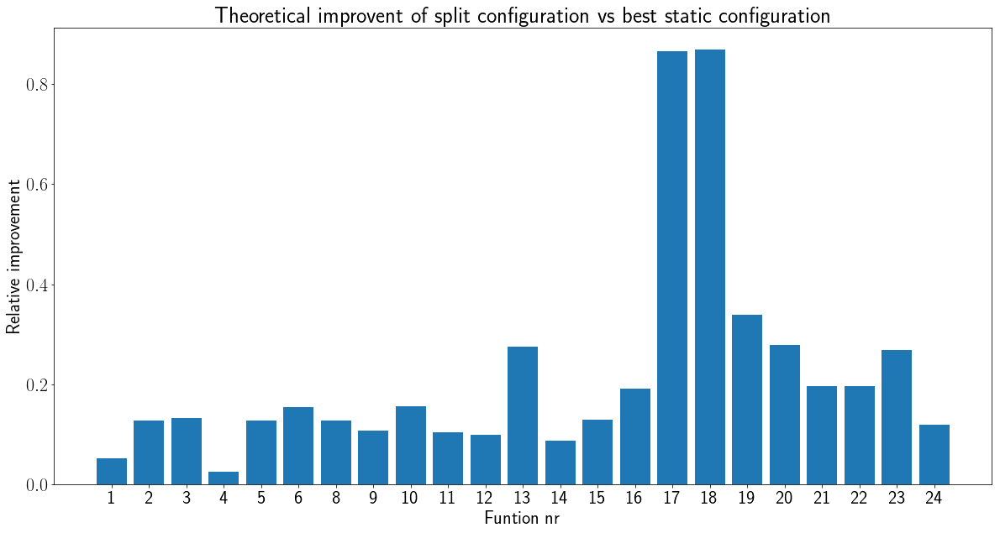

In [99]:
plt.figure(figsize=(20,10))
plt.bar(range(23),table["relative improvement possible"])
plt.xticks(range(23),table["fid"])
plt.title("Theoretical improvent of split configuration vs best static configuration")
plt.xlabel("Funtion nr")
plt.ylabel("Relative improvement")
plt.savefig("Results_theory.pdf")
plt.show()

This figure shows that for quite a few functions, the improvemnt could be as high as 20%. However, there are two obvious outliers with values of more than 80%, which seems unrealistic.

After further investigation, we determined the reason for high improvement possible for F17 and 18 in particular to be the following:
- Part 1 of the configuration performs well at the beginning, but gets stuck in a local optium (which is much worse than the target)
- Part 2 starts slow, and then settles into a better local optimum (so it does hit the target value)
- By combining these performances, we follow P1 untill the last target it hit, and then assume the same behaviour as P2, which is then quickly settling into its local optimum

Note that this problem can be solved by requiring both configurations to reach the target to be considered for contributing to the split configuration. We implement this fix for our future approaches, but we don't recalculate the data shown in this section. This is shown in the next figure.

In [29]:
records_th = []
to_run = []
fids_new = range(1,25)

for fid in fids_new:
    
    df = get_data(fid=fid,ndim=5)
    df = df.replace(np.nan,np.inf)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID']).mean()
#     if fid == 1:
#         target = '10e-8.0'
#     else:
    target = get_final_target(fid)
    target_idx = int(2-float(target[3:]))*5
#     target_idx = 50
#     target = '10e-8.0'
    best_val = np.inf
    best_c1 = -1
    best_c2 = -1
    best_split = -1
    confs_to_consider = [3*i for i in range(1536) if dfmeans[target][3*i] < 50001 ]
#     print(len(confs_to_consider))
    for split in range(target_idx):
        c1 = np.argmin([dfmeans[f"10e{powers[split]:.1f}"][i] for i in confs_to_consider])
        v1 = dfmeans[f"10e{powers[split]:.1f}"][confs_to_consider[c1]]
        p2 = dfmeans[target] - dfmeans[f"10e{powers[split]:.1f}"]  
        p2 = p2.replace(np.nan,np.inf)
        c2 = np.argmin([p2[i] for i in confs_to_consider])
        v2 = p2[confs_to_consider[c2]]
        val = v1+v2
        if(val<best_val):
            best_val = val
            best_c1 = c1
            best_c2 = c2
            best_split = split
    
#     print(best_c1,best_c2,best_val,best_split)
    st = np.argmin([dfmeans[target][i] for i in confs_to_consider])
    stval = dfmeans[target][confs_to_consider[st]]
    impr = 1-best_val/stval
    record = (fid,impr)
    records_th.append(record)
    to_run.append((fid,confs_to_consider[best_c1],confs_to_consider[best_c2],best_split,confs_to_consider[st]))
    
np.save("to_run_mean_calcd.npy",to_run)

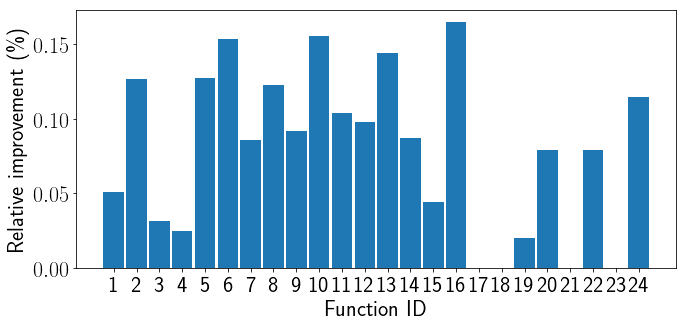

In [32]:
plt.figure(figsize=(10,5))
plt.bar([i for i in range(24)],[i[1] for i in records_th],width=0.9,label="Expected")
plt.xticks([i for i in range(24)],fids_new)
# plt.yscale('log')
plt.xlabel('Function ID')
plt.ylabel('Relative improvement (\%)')
# plt.legend()
plt.tight_layout()
plt.savefig("Results_theory_updated2.pdf")
plt.show()

# Additional splitpoint determination methods<a id='methods'></a>


Based on the previous resuls, we decided to incorporate two different techniques into the splitpoint determination.

We use the following two techniques to reduce the influence of variance on the splitpoint configuration's performance:
- Sliding window: Instead of considering only the performance at a single splitpoint and choosing that as the split to use, we consider a sliding window around the splitpoint, and take the average of the performances at all these splitpoints. <br> This should deal with variance by smoothing out the hitting times.


- Worstcase: Instead of considering the mean performance, we take a version of the worstcase performance. To still deal with the different instances, we take the worstcase performance for every instance and average this to get the calculated performance. <br> This should reduce the impact of variance, since even when we assume we get bad runs, this configuration performs the best out of all possible split configurations. This way, the variance might improve the performance of the split configuration.

We run test with 3 different settings: 
- No sliding window, using means
- Sliding window, using means
- Sliding window, using worstcase

The reason we decided not to use the no sliding window, worstcase method is as follows:<br>
We started by implementing the original method (no sliding window using means). Afterwards, we introduced both the sliding window and worstcase techniques at the same time, so both were implemented and used together. To be able to identify whether the sliding window or the worstcase technique was the main source of the difference compared to the original method, we also implemented the means sliding window approach. 

Note: from here on, we don't consider F1, since the runs for this function only cover 4 instances instead of 5. This makes the implementation more difficult, so we ignore it. 

First, we define some functions to get the mean performance values for both static and split configurations. This is done so we can compare the expected average improvements of the different methods. 

In [49]:
def get_mean_value_split(fid,rep1,rep2,target,split):
    df = get_data(fid=fid,ndim=5)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID']).mean()
    val1 = dfmeans["10e{0}".format(split)][rep1]
    val2sp = dfmeans["10e{0}".format(split)][rep2]
    val2st = dfmeans["10e{0}".format(target)][rep2]
#     print(val2st,val2sp,val1)
    return val2st - val2sp + val1
    
def get_mean_value_static(fid,rep0,target):
    df = get_data(fid=fid,ndim=5)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID']).mean()
    return dfmeans["10e{0}".format(target)][rep0]

For ease of use, the split configurations have been generated outside this report. They are accesible trough the function `get_table_item`.

For these configurations, we use the previously defined functions to determine the mean improvement possible. These theoretical improvements are shown in the table below.

Footnote:
To determine which configurations to use, we created the file `splitpoint_generation.py`, which contains all the necessary code to calculate the split configurations according to our three previously described methods.
This code gives us some csv-tables, which are processed in the initialzation part of this notebook. 

In [100]:
records = []
for fid in fids:
    statics = []
    splits = []
    for method in methods:
        item = get_table_item(fid,method)
#         print(item)
        rep1 = item[4]
        rep2 = item[5]
        rep0 = item[3]
        split = item[1]
        target = item[2]
        splits.append(get_mean_value_split(fid,rep1,rep2,target,split))
        statics.append(get_mean_value_static(fid,rep0,target))
#     print(splits)
#     print(statics)
    imprs = [1-(x/min(statics)) for x in splits]
    records.append((fid,imprs[0],imprs[1],imprs[2]))
labels = ["fid","M-impr","W-impr","MW-impr"]
resultsth = pd.DataFrame.from_records(records, columns=labels,index='fid')

labels2 = ["fid","Mean NoWindow-impr","Worst Window-impr","Mean Window-impr"]

pd.DataFrame.from_records(records, columns=labels2,index='fid')

,Mean NoWindow-impr,Worst Window-impr,Mean Window-impr
fid,,,
2,0.126740,0.107985,0.114929
3,0.132841,0.026376,0.029987
4,0.024397,0.000000,-0.005627
5,0.127622,0.066744,0.127622
6,0.153440,0.128349,0.153440
8,0.127922,0.107669,0.120774
9,0.107806,0.081020,0.092171
10,0.155736,0.058408,0.144998
11,0.103839,0.102152,0.103839


Again, since visual data is easier to understand quicly, we take this data and create a bargraph below.

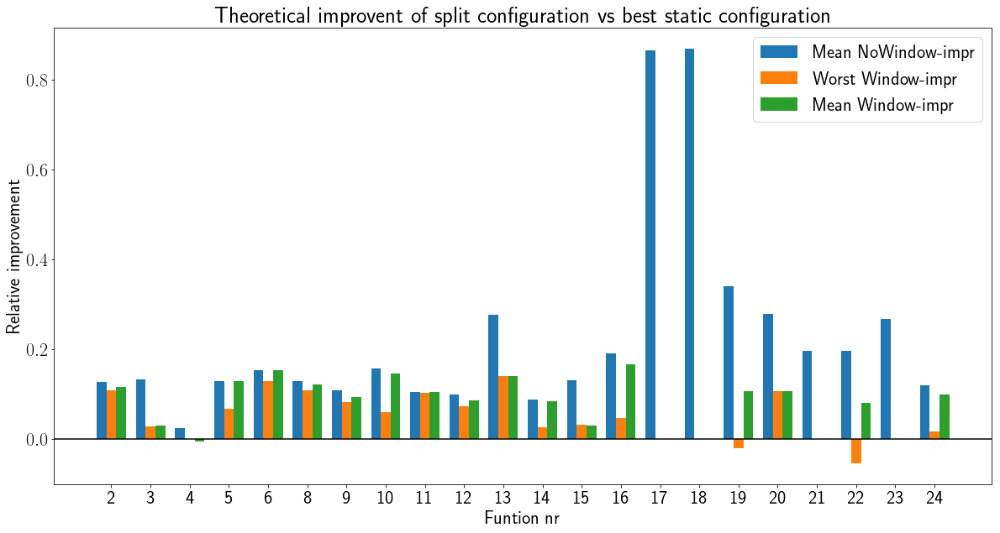

In [99]:
plt.figure(figsize=(20,10))
plt.bar([i-0.25 for i in range(22)], resultsth["M-impr"],width=0.25,label="Mean NoWindow-impr")
plt.bar([i for i in range(22)], resultsth["W-impr"],width=0.25,label="Worst Window-impr")
plt.bar([i+0.25 for i in range(22)], resultsth["MW-impr"],width=0.25,label="Mean Window-impr")
plt.xticks(range(22),resultsth.index)
plt.axhline(0,color='k')
plt.legend()
plt.title("Theoretical improvent of split configuration vs best static configuration")
plt.xlabel("Funtion nr")
plt.ylabel("Relative improvement")
plt.show()

From this graph, we can see that the expected mean improvement for our two new methods is always worse than for the original method. This is to be expected, since the original method takes the configuration with the best mean improvement possible, while the new methods look at sliding windows. 

The first thing we notice is that for some functions and some methods, there is no bar present. In these cases, there is 0 expected improvement since we switch from the best static configuration to itself.

This sliding window approach makes it possible for negative mean improvement to be shown, which was not previously possible. We could always just switch from the static configuration to itself for 0 improvement. This is not the case when using the sliding window, since it might determine that for a certain window around the chosen splitpoint, switching from C1 to C2 is the best option, while this is on average worse to actually use this splitpoint.

As an example: Take a split configuration $(C_1,C_2)$ where we have to decide what splitpoint to use. Assume the this split configuration has predicted AHT's for splitpoints $\{\phi_0\dots\phi_6\}$ as follows: `[3000,500,500,1000,500,500,3000]`. Say we have a window of size 5 (so 2 splitpoints on each side). Then the window from $\phi_1$ to $\phi_5$ has total value (sum of all AHT's in this window) of $3000$, so it is selected and the splitpoint set to the center of the window, so $\phi_3$ in this case. However, for this splitpoint, the predicted AHT of $1000$, which is worse then when splitpoints $\phi_1,\phi_2,\phi_4$ or $\phi_5$ were chosen. If the best static configuration has an expected AHT of $700$, this leads to negative expected improvement, where a non-window approach would have seen a positive expected improvement.

In general, while the average expected performance for these two new methods is worse, we expect it to be more realistic with regards to actual runs of the split configuration, since it deals better with variance in the data.

# Running the split configurations <a id='emp'></a>


## Split configuration implementation

All implementation is based on the Modular CMA-ES framework made by Sander van Rijn. The framework itself is [available here](https://github.com/sjvrijn/ModEA), while the experiment files which we base our implementation on are [available here](https://github.com/sjvrijn/ConfiguringCMAES).

The first modification to this framework involved breaking open the black-box nature of the problems to be optimized by giving the optimizer the exact value of the optimum to be found. This allows us to determine if a certain target has been reached durig the optimization process, which enables the use of the previously described targets as a point to switch between configuration.
This has the added benefit that we can enable early stopping of the optimizer, since when the final target ($10^{-8}$) has been reached, we don't need to continue the search. This greatly reduced computation time needed, especially for easy functions.

Now that the optimizer has the ability to know when a certain target has been hit, we adapted the functions running the modular CMA-ES in such a way that they can take in a new parameter containing the configuration to switch to, as well as a parameter indicating at which target to switch configurations.

When this split-target is hit, we can switch configurations by reinitializing part of the currently running CMA-ES. We started by changing all modules to those of the new configurations. This turned out not to be enough, since there are some parameters which are initialized differently based on the configuration. So all of these static parameters need to be reinitialized as well.

After this switch, we still have a valid CMA-ES. We kept all the dynamic parameters from the first configurations (population, search history, covariance matrix,$\dots$) but all modules and static parameters are changed to those belonging to the second configuration. 

## Results

Now that we have determined which split configurations should perform the best, we actually run them. 
We decided on running them 250 times: 5 instances each with 50 runs. This should give us quite roboust data to work with.
Next to running the split configurations, we also run the original static configurations for C1, C2 and Cstatic to verify the original data. Since we added fixed seeds to the runs, this data is now reproducible. 

Note: The way fixed seeds were implemented is twofold: 
- Fix the seed at the start of the optimization run
- Reset the seed when the switch occurs / would have occured

This second part causes the data to not always be easily reproducible: if running the configuration $(\tau,C_1,C_2)$ and its seperate components ($C_1$ and $C_2$), the data for this static $C_1$ might differ slightly from that when running the configuration $(\tau',C_1,C_2)$ and its components with $\tau\neq\tau'$, because the random seed is reset at a different time in both of the static runs of $C_1$.

The experiments are run in the adapted version of the modulare CMA-ES framework, which reads the csv-files mentioned in the previous section. The following code processes the data from these experiments.

In [140]:
records = []
for fid in fids:
    splitERTs = []
    staticERTs = []
    nonreached = []
    nonreachedST = []
    targets = []
    for method in methods:
        data = load_data(fid,method)
        
        item = get_table_item(fid,method)

        stops = calcStopVals(data['split']['fitness'],10**item[2])
        splitERTs.append(calcERT(stops))
        nonreached.append(calcNonReached(stops))
        targets.append(item[2])

        
        stopsST = calcStopVals(data['static']['fitness'],10**item[2])
        staticERTs.append(calcERT(stopsST))
        nonreachedST.append(calcNonReached(stopsST))
        
    bestStatic = min(staticERTs)
    imprs = [1-x/bestStatic for x in splitERTs]
    records.append((fid,imprs[0],imprs[1],imprs[2],splitERTs[0],splitERTs[1],splitERTs[2],bestStatic,nonreached,nonreachedST,targets))#,imprs[2]))
    
labels = ["Fid","M-impr","W-impr","MW-impr","M-ERT","W-ERT","MW-ERT","ST-ERT","Split-nonF","ST-nonF","targets"]#,"Means_window-impr"]
results = pd.DataFrame.from_records(records, columns=labels,index='Fid')

In [87]:
records = []
ert_records = []
impr_records = []
for fid in fids_new:

    target = 10**float(get_final_target(fid)[3:])

   
    
    df = get_data(fid=fid,ndim=5)
    df = df.replace(np.nan,np.inf)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID']).mean()
    dftarget = dfmeans[get_final_target(fid)]
    best_val = np.inf
    best_c1 = -1
    best_c2 = -1
    best_split = -1
    confs_to_consider = [3*i for i in range(1536) if dfmeans[get_final_target(fid)][3*i] < 50001 ]
    
    st = np.argmin([dfmeans[get_final_target(fid)][i] for i in confs_to_consider])
    st_exp = dfmeans[get_final_target(fid)][confs_to_consider[st]]
#     print(len(confs_to_consider))

    target_idx = int(2-float(get_final_target(fid)[3:]))*5
    for split in range(target_idx):
        c1 = np.argmin([dfmeans[f"10e{powers[split]:.1f}"][i] for i in confs_to_consider])
        v1 = dfmeans[f"10e{powers[split]:.1f}"][confs_to_consider[c1]]
        p2 = dfmeans[get_final_target(fid)] - dfmeans[f"10e{powers[split]:.1f}"]  
        p2 = p2.replace(np.nan,np.inf)
        c2 = np.argmin([p2[i] for i in confs_to_consider])
        v2 = p2[confs_to_consider[c2]]
        val = v1+v2
        if(val<best_val):
            best_val = val
            best_c1 = c1
            best_c2 = c2
            best_split = split
            
            

    split_idx = best_split
    c1 = confs_to_consider[best_c1]
    c2 = confs_to_consider[best_c2]
    cs = confs_to_consider[st]
#     print(c1,c2,cs,split_idx)
    data_st = np.load(data_location + 'DataStatics/' + file_name_params.format(fid=fid,ndim=5,rep=reprToString(intToRepr(cs))),encoding='bytes')
    data = np.load(data_location + 'DataStatics/' + file_name_params_split.format(fid=fid,ndim=5,rep=reprToString(intToRepr(c1)),rep2=reprToString(intToRepr(c2))),encoding='bytes')

    splitERT = calc_actual_ERT_split(data['fitness'],c1,c2,split_idx=split_idx,target=target)
    stopsST = calcStopVals(data_st['fitness'],target)

    st_ERT = calcERT(stopsST,c=cs)
#     ert_records.append()
    impr = 1-splitERT/st_ERT
    ert_records.append((fid,st_exp,best_val,st_ERT,splitERT))


    data = load_data(fid,'worstcase')

    item = get_table_item(fid,'worstcase')

    worst_c1 = item[4]
    worst_c2 = item[5]
    worst_split = item[1]
    
    splitERTworst = calc_actual_ERT_split(data['split']['fitness'],item[4],item[5],int(2-item[1])*5,target)

    stopsST = calcStopVals(data['static']['fitness'],target)
    staticERTworst = calcERT(stopsST,c=item[3])       

    data = load_data(fid,'means_window')

    item = get_table_item(fid,'means_window')
    mw_c1 = item[4]
    mw_c2 = item[5]
    mw_split = item[1]
    
    splitERTmw = calc_actual_ERT_split(data['split']['fitness'],item[4],item[5],int(2-item[1])*5,target)

    stopsST = calcStopVals(data['static']['fitness'],target)
    staticERTmw = calcERT(stopsST,c=item[3])               

    records.append((fid,splitERT,splitERTworst,splitERTmw,min(st_ERT,staticERTworst,staticERTmw)))
    
#     best_st = min(st_ERT,staticERTworst,staticERTmw)
    best_st = st_ERT
    impr = 1-splitERT/best_st
    imprworst = 1-splitERTworst/best_st
    imprmw = 1-splitERTmw/best_st
    
    target = get_final_target(fid)
    
    th_st = dfmeans[target][cs]
    th_imp = 1-best_val/th_st
    
    th_worst = dfmeans[f"10e{worst_split}"][worst_c1] - dfmeans[f"10e{worst_split}"][worst_c2] + dfmeans[target][worst_c2]
    th_imp_worst = 1-th_worst/th_st
    
    th_mw = dfmeans[f"10e{mw_split}"][mw_c1] - dfmeans[f"10e{mw_split}"][mw_c2] + dfmeans[target][mw_c2]
    th_imp_mw = 1-th_mw/th_st

    impr_records.append((fid,th_imp,th_imp_worst,th_imp_mw,impr,imprworst,imprmw))
    
#     print(fid,st_exp,best_val,st_ERT,splitERT)
    
# labels = ["Fid","M-impr","W-impr","MW-impr","M-ERT","W-ERT","MW-ERT","ST-ERT","Split-nonF","ST-nonF","targets"]#,"Means_window-impr"]
labels = ["fid","orig","worst","mw","static"]
results_corrected_comparison = pd.DataFrame.from_records(records, columns=labels,index='fid')

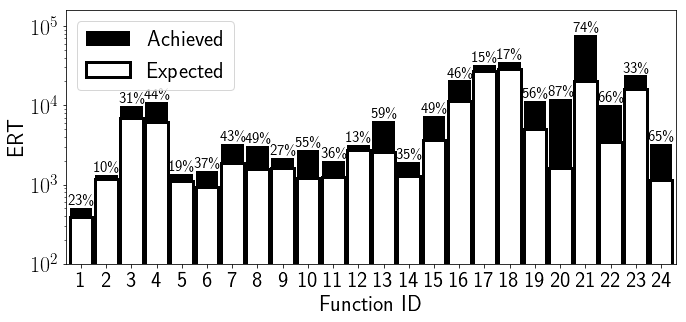

In [56]:
plt.figure(figsize=(10,5))
# plt.bar([i-0.21 for i in range(23)],[i[1] for i in ert_records],width=0.4,color='b',label="Static Expected")
plt.bar([i for i in range(24)],[i[4] for i in ert_records],width=0.9,color='k',alpha=1,label="Achieved")#,edgecolor='k',linewidth=3)

plt.bar([i for i in range(24)],[i[2] for i in ert_records],width=0.9,color='w',label="Expected",alpha=1,edgecolor='k',linewidth=3)
# plt.bar([i-0.21 for i in range(23)],[i[3] for i in ert_records],width=0.4,color='r',alpha=0.3,label="Static Achieved")
plt.xticks([i for i in range(24)],[i[0] for i in ert_records])
plt.yscale('log')
plt.xlabel('Function ID')
plt.ylabel('ERT')
plt.legend()
plt.tight_layout()
plt.xlim(-0.6,23.6)
plt.ylim(100,10**5.2)

for i in range(24):
    record = ert_records[i]
    plt.annotate(f"{100*(1-record[2]/record[4]):.0f}\%",(i-0.5,1.1*record[4]),fontsize=15)
plt.savefig("ERT_comparison_corrected_single_blackwhite_labeled.pdf")
plt.show()

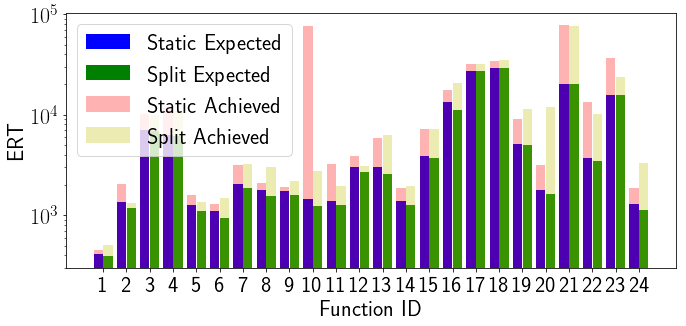

In [216]:
plt.figure(figsize=(10,5))
plt.bar([i-0.21 for i in range(24)],[i[1] for i in ert_records],width=0.4,color='b',label="Static Expected")
plt.bar([i+0.21 for i in range(24)],[i[2] for i in ert_records],width=0.4,color='g',label="Split Expected")
plt.bar([i-0.21 for i in range(24)],[i[3] for i in ert_records],width=0.4,color='r',alpha=0.3,label="Static Achieved")
plt.bar([i+0.21 for i in range(24)],[i[4] for i in ert_records],width=0.4,color='y',alpha=0.3,label="Split Achieved")
plt.xticks([i for i in range(24)],[i[0] for i in ert_records])
plt.yscale('log')
plt.xlabel('Function ID')
plt.ylabel('ERT')
plt.legend()
plt.tight_layout()
plt.savefig("ERT_comparison_corrected.pdf")
plt.show()

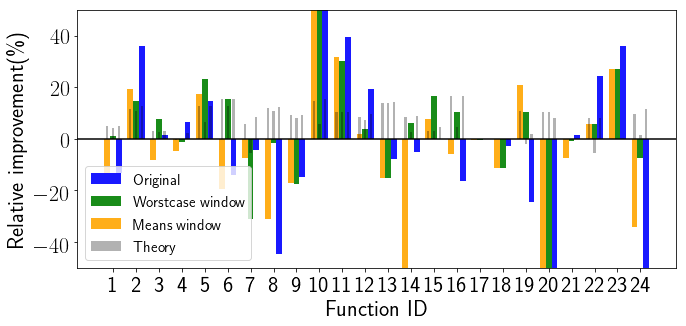

In [212]:
plt.figure(figsize=(10,5))
plt.bar([i+0.25 for i in range(24)],[100*i[4] for i in impr_records],width=0.25,alpha=0.9,color='b',label="Original")
plt.bar([i for i in range(24)],[100*i[5] for i in impr_records],width=0.25,alpha=0.9,color='g',label="Worstcase window")
plt.bar([i-0.25 for i in range(24)],[100*i[6] for i in impr_records],width=0.25,alpha=0.9,color='orange',label="Means window")
plt.bar([i+0.25 for i in range(24)],[100*i[1] for i in impr_records],width=0.1,alpha=0.3,color='k',label="Theory")
plt.bar([i for i in range(24)],[100*i[2] for i in impr_records],width=0.1,alpha=0.3,color='k')
plt.bar([i-0.25 for i in range(24)],[100*i[3] for i in impr_records],width=0.1,alpha=0.3,color='k')
plt.ylim(-50,50)
plt.xticks(range(24),fids_new)
plt.axhline(0,color='k')
plt.legend(prop={'size':15})
plt.xlabel("Function ID")
plt.ylabel("Relative improvement(\%)")
plt.tight_layout()
plt.savefig("Relative_improvements_percentage_single_reference_smaller.pdf")

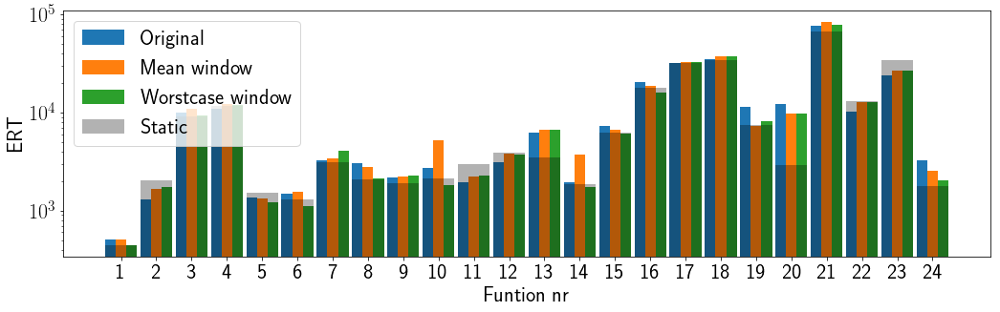

In [213]:
plt.figure(figsize=(15,5))
plt.bar([i-0.3 for i in range(24)],results_corrected_comparison["orig"],width=0.3,label="Original")
plt.bar([i for i in range(24)],results_corrected_comparison["mw"],width=0.3,label="Mean window")
plt.bar([i+0.3 for i in range(24)],results_corrected_comparison["worst"],width=0.3,label="Worstcase window")
plt.bar([i for i in range(24)],results_corrected_comparison["static"],width=0.9,label="Static",alpha=0.3,color='k')

plt.yscale('log')
plt.legend()
plt.xticks(range(24),fids_new)
plt.xlabel("Funtion nr")
plt.ylabel("ERT")
plt.tight_layout()
# plt.savefig("results_combined_ERT.pdf")
plt.show()

In the table below, we compare the performance of the 3 methods used to determine the split: 
- Mean without sliding window 
- Mean with sliding window 
- Worstcase with sliding window 

For these methods, we compare the ERT of the split configuration with the ERT of the static configuration.
Since we calculated a different static configuration for the worstcase and mean methods, we use the one with the lowest ERT to compare with. (Here we do not consider C1 and C2 when calculating the best static configuration, which is something we will look at later in this notebook).

We show the ERT itself, as well as the relative improvement to this static configuration for all three split configurations (-impr). To give some more insight in these numbers, we also show the amount of runs which did not reach the target value (-nonF) for all three split-configurations.

In [104]:
pd.set_option('precision', 3)
results.rename(index = str, columns={"M-impr": "Mean NoWindow-impr","W-impr" : "Worst Window-impr","MW-impr":"Mean Window-impr","M-ERT": "Mean NoWindow-ERT","W-ERT": "Worst Window-ERT","MW-ERT": "Mean Window-ERT","ST-ERT": "Best static ERT","ST-nonF": "Static-nonF"})

,Mean NoWindow-impr,Worst Window-impr,Mean Window-impr,Mean NoWindow-ERT,Worst Window-ERT,Mean Window-ERT,Best static ERT,Split-nonF,Static-nonF,targets
Fid,,,,,,,,,,
2,0.276,0.089,0.112,1123.980,1415.212,1378.612,1552.688,"[0, 0, 0]","[0, 0, 0]","[-8.0, -8.0, -8.0]"
3,-0.148,-0.017,-0.206,10472.419,9284.851,11003.276,9125.742,"[2, 1, 4]","[1, 0, 2]","[0.4, 0.4, 0.4]"
4,-0.197,-0.214,-0.239,9149.538,9278.403,9469.584,7642.008,"[3, 7, 5]","[0, 7, 7]","[0.8, 0.8, 0.8]"
5,0.168,0.281,0.168,1266.288,1093.748,1266.288,1521.472,"[0, 0, 0]","[0, 0, 0]","[-8.0, -8.0, -8.0]"
6,-0.129,0.209,-0.129,1514.228,1060.140,1514.228,1341.084,"[0, 0, 0]","[0, 0, 0]","[-8.0, -8.0, -8.0]"
8,-0.268,-0.009,-0.310,2646.456,2104.608,2733.896,2086.560,"[0, 0, 0]","[0, 0, 0]","[-8.0, -8.0, -8.0]"
9,-0.431,-0.132,-0.131,2799.328,2215.136,2213.680,1956.640,"[0, 0, 0]","[0, 0, 0]","[-8.0, -8.0, -8.0]"
10,-1.843,0.068,-2.142,4495.384,1473.840,4967.511,1581.168,"[13, 0, 15]","[150, 0, 154]","[-8.0, -8.0, -8.0]"
11,0.130,0.128,0.130,1933.951,1937.016,1933.951,2222.232,"[3, 3, 3]","[0, 0, 0]","[-8.0, -8.0, -8.0]"


From this table, we extract the most improvements for the different methods and compare them to the improvements we had previously predicted. This is shown in the figure below.

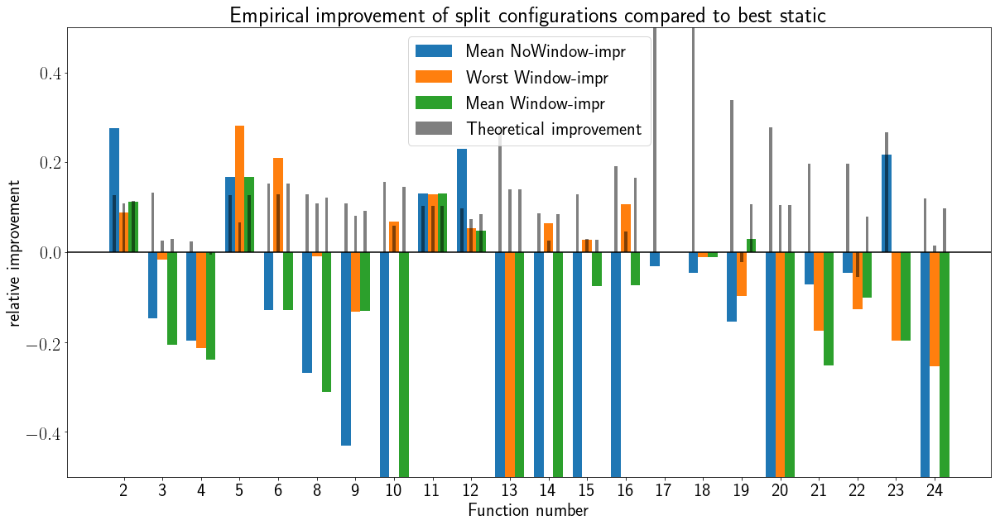

In [177]:
plt.figure(figsize=(20,10))
plt.bar([i-0.25 for i in range(22)],results['M-impr'],width=0.25,label='Mean NoWindow-impr')
plt.bar([i for i in range(22)],results['W-impr'],width=0.25,label='Worst Window-impr')
plt.bar([i+0.25 for i in range(22)],results['MW-impr'],width=0.25,label='Mean Window-impr')
plt.bar([i-0.25 for i in range(22)], resultsth["M-impr"],width=0.08,label="Theoretical improvement",color='k',alpha=0.5)
plt.bar([i for i in range(22)], resultsth["W-impr"],width=0.08,color='k',alpha=0.5)
plt.bar([i+0.25 for i in range(22)], resultsth["MW-impr"],width=0.08,color='k',alpha=0.5)
plt.legend()
plt.axhline(0,color='k')
plt.xticks(range(22),results.index)
plt.xlabel("Function number")
plt.ylabel("relative improvement")
plt.ylim(-0.5,0.5)
plt.title('Empirical improvement of split configurations compared to best static')
plt.savefig("results2.pdf")
plt.show()


From this figure, we can see that the fit between theory and practice is not as good as we would have hoped.

We do see some improvements, especially for the easier functions.

When comparing the three methods we used, we see that the worstcase sliding window approach seems to perform best. We expect this to be caused by the fact that this methods is less prone to major decreases in performance as a result of variance. 

In this notebook, many experiment have been performed, most of which showed quite interesting results. To be able to compare the results from different sections and get an overview of everything we did, we create a large overview table in this section.

This table contains ERTs from all different experiment, and some of the figures introduced in previous sections. 
The first part of this section contains the code for the generation of this data and some explanation of these processes, while the second part deals with the formatting of the table. The table itself is available in the final part of this section.


# Two-stage approach<a id='finalexp'></a>

In a previous experiment ('Additional statistics from worstcase-window approach' in [this section](#emp)) we found that there can be significant differences between the performance of a configuration in the original experiments (25 runs) and the rerun experiments (250 runs). To remedy this, we first rerun some static configurations to get some more roboust data to base our splitpoint generation on. 

This experiment consists of 3 steps.
- First, the configurations to be rerun need to be determined. This is done by selecting the 50 best static configurations and the 50 best split configurations according to the original data. To calculate these split configurations, the file `splitpointgeneration.py` needs to be run for the required function. This creates a npy-file containing all possible split configurations which reach the best target value possible. This file is then processed by the function `get_sorted_var2`, which selects the 50 best split configurations with the added restriction that a configuration can occur at most 3 times as part one and 3 times as part 2. The function `calc_static_configs` is used to combine these configurations and save them in a npy-file (`Statics_Fxx.npy`).
- Second, this statics file is used to rerun the required configs. This is done by using the function run_statics in the updated version of the CMA-ES framework. This generates the required files for each configuration.
- This newly generated data can then be processed to determine the best 50 split configurations, again using the above mentioned limitation on the part1 and part2 configurations. This is done by the function `calc_split_configs`.
- Finally, this data can be processed to generate the required figures and table.




## Rerunning the static configurations

First, we determine which static configurations need to be rerun.

Since for the more difficult functions, we might not always have 50 runs which hit the final target, we choose the target such that at least 50 static configurations hit it. This is done by the following function.

In [50]:
def get_best_statics_to_rerun(fid,nr_to_return=50):
    df = get_data(fid=fid,ndim=5)
    df = df.replace(np.nan,np.inf)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID']).mean()
    

    finaltarget = get_final_target(fid)
    
    meantarget = dfmeans[finaltarget]
    sortedargs = np.argsort(np.array(meantarget))
    valid_statics = [(i,meantarget[i]) for i in sortedargs if i%3==0 and meantarget[i] < 50001]
    
    st_old = valid_statics
    
    while len(valid_statics) < nr_to_return:
        finaltarget = f"10e{float(finaltarget[3:]) + 0.2:.1f}"
        meantarget = dfmeans[finaltarget]
        sortedargs = np.argsort(np.array(meantarget))
        valid_statics = [(i,meantarget[i]) for i in sortedargs if i%3==0 and meantarget[i] < 50001]
        
#     valid_statics = st_old (valid_statics)
    return valid_statics[:nr_to_return]


The next function combines these 50 best static configurations with the previously calculated 50 best split configurations to get a set of configurations to be rerun.

In [51]:
def calc_static_configs(fid):
    statics = [i[0] for i in get_best_statics_to_rerun(fid)]
    splits = get_sorted_var2(fid,lim_uses=3)
    for i in splits:
        statics.append(int(i[1]))
        statics.append(int(i[2]))

    statics = list(set(statics))
    len(statics)
    np.save(f"Statics_F{fid}",statics)
    return statics

For these configuration, we first determine their expected ERTs

In [52]:
def calc_theoretical_erts(fid,getvars=False):
    statics = calc_static_configs(fid)
    df = get_data(fid=fid,ndim=5)
    df = df.replace(np.nan,np.inf)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID']).mean()
    dfstds = df.groupby(by=['Representation', 'ndim', 'function ID']).std()
    target = get_final_target(fid)
    vals = dfmeans[target]
    stds = dfstds[target]

    thERTs = []
    thvars = []
    for i in range(len(statics)):
        try:
            thERTs.append(vals[statics[i]])
            thvars.append(stds[statics[i]])
        except:
            print(i,statics[i])
            
    if getvars:
        return (thERTs,thvars)
    return thERTs

After the configurations have been rerun, we can calculate the actual achieved ERTs using the function below.

Note that for some static configurations, we had some problems running them on the Das4-cluster. For the moment, we decided to ignore these failed configurations.

In [53]:
def calc_realized_erts(fid):
#     statics = calc_static_configs(fid)
    statics = np.load(f"Statics_F{fid}.npy")
    ERTs = []
    fullstops = []
    succeeded_statics = []
    target = get_final_target(fid)
    target_idx = int((-1*float(target[3:])+2)*5)
    print(target_idx)
    for i in range(len(statics)):
        try:
            data = load_data_statics(fid,statics[i])
            stops = calcAllStops(data['fitness'])
            if(intToRepr(statics[i])[6]):
                stops *= 4/3
            fullstops.append(stops)
            ERTs.append(calcERT([i[target_idx] for i in stops]))
            succeeded_statics.append(statics[i])
        except:
            print(i,statics[i])
    return ERTs,(succeeded_statics,fullstops)

In [73]:
def calc_realized_ahts(fid):
#     statics = calc_static_configs(fid)
    statics = np.load(f"Statics_F{fid}.npy")
    AHTs = []
    fullstops = []
    succeeded_statics = []
    target = get_final_target(fid)
    target_idx = int((-1*float(target[3:])+2)*5)
    print(target_idx)
    for i in range(len(statics)):
        try:
            data = load_data_statics(fid,statics[i])
            stops = calcAllStops(data['fitness'])
            if(intToRepr(statics[i])[6]):
                stops *= 4/3
            stops.replace(50000,0)
            AHTs.append(np.mean(stops,axis=0)[target_idx])
        except:
            print(i,statics[i])
    return AHTs

We load this data for F11, for which we already gathered the required data.

To visualize these result, we create a scatterplot of the expected vs the achieved ERTs below

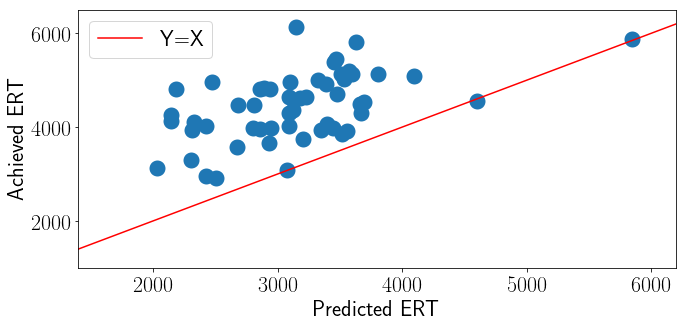

In [231]:
for fid in [7]:
#     thERTs = calc_theoretical_erts(fid)
#     ERTs,(succeeded_statics,fullstops) = calc_realized_erts(fid)
    if(len(thERTs) != len(ERTs)):
        print(fid)
    else:
        plt.figure(figsize=(10,5))
        plt.scatter(thERTs,ERTs,lw=10)
        plt.plot(range(35000),range(35000),color='r',label="Y=X")
        plt.legend()
        plt.rc('text', usetex=True)
        plt.xlabel(r"Predicted ERT")
        plt.ylabel(r"Achieved ERT")
#         plt.title(f"F{fid}: Expected (25 run) ERT vs Achieved (250 run) ERT")
        plt.ylim(1000,6500)
        plt.xlim(1400,6200)
        plt.tight_layout()
        plt.savefig(f"ExpectedvsAchievedERT_F{fid}_notitle.pdf")
        plt.show()

From this figure, we can see that the fit between expected and achieved ERT is not as good as we would have hoped. 

The outlier which perform worse than expected can mostly be explained by unfinished runs adding a lot to the ERT, but the configurations which perform better then expected have no clear explanation yet.

## Determining the split configurations

The following two functions are used to determine the best split configurations based on the new data. 

The first function is a version of the function available in `splitpoint_generation.py`, using the newly generated data instead.

The second function then sorts the data according to the limited-usage method, first described in [this section](#50-50).

In [54]:
def calcBestSplit(fid,fullstops,iid=None, sliding_window=True, use_mean=False):
#     dfa = np.array(df)
    if sliding_window:
        best_target = 5  # set to 5 to allow for 2 before and 2 after sliding window
    else:
        best_target = 0

    if iid is not None:
        assert (type(iid) == type(0))
        nr_runs = 5
    else:
        nr_runs = 250

    best_worstcase = np.inf
    bestidx1 = -1
    bestidx2 = -1
    bestsplit = -1
    history_splits = []

    # use dictonaries to avoid recalculating values
    targets_hit = {}
    vals = {}

#     for idx in configs_to_consider:
#         if iid is not None:
#             vals[idx] = [dfa[i][5:] for i in range(idx * 25 + 5 * iid, idx * 25 + 5 * (iid + 1))]
#         else:
#             vals[idx] = [dfa[i][5:] for i in range(idx * 25, (1 + idx) * 25)]

#         temp = [i for i in range(51) if (np.sum(vals[idx], axis=0)[i] < np.inf)]
#         if len(temp) != 0:
#             targets_hit[idx] = max(temp)
#         else:
#             targets_hit[idx] = -1

    for idx1 in range(len(fullstops)):
        for idx2 in range(len(fullstops)):
            vals1 = fullstops[idx1]
            vals2 = fullstops[idx2]
            target = get_final_target(fid)
            targetidx = int((-1*float(target[3:])+2)*5)

            if targetidx > best_target:
                best_worstcase = np.inf
                bestidx1 = -1
                bestidx2 = -1
                bestsplit = -1
                best_target = targetidx
                history_splits = []

            if targetidx == best_target:
                value_split = []
                for split in range(targetidx):
                    p1 = [vals1[i][split] for i in range(nr_runs)]
                    p2 = [vals2[i][targetidx] - vals2[i][split] for i in range(nr_runs)]
                    if not use_mean:
                        combined = []
                        if iid is None:
                            for iids in range(5):
                                worstp1 = max(p1[50 * iids:50 * (iids + 1)])
                                worstp2 = max(p2[50 * iids:50 * (iids + 1)])
                                combined.append(worstp1 + worstp2)

                            worstcase_mean = np.mean(combined)
                            value_split.append(worstcase_mean)
                        else:
                            value_split.append(max(p1) + max(p2))
                    else:
                        value_split.append(np.mean(p1) + np.mean(p2))
                if not sliding_window:
                    split = np.argmin(value_split)
                    worstcase_mean = np.min(value_split)
                else:
                    summed_window = [np.mean(value_split[i - 2:i + 3]) for i in range(2, targetidx - 2)]
                    window_split = np.argmin(np.array(summed_window))
                    split = window_split + 2
                    worstcase_mean = summed_window[window_split]
                if worstcase_mean < best_worstcase:
                    bestsplit = split
                    bestidx1 = idx1
                    bestidx2 = idx2
                    best_worstcase = worstcase_mean
                history_splits.append((split,idx1,idx2,worstcase_mean))
    return ((best_target, bestidx1, bestidx2, bestsplit, best_worstcase),history_splits)

In [ ]:
configs_to_consider = [i * 3 for i in range(int(4608 / 3))]

def calcBestSplit(fid,iid=None, sliding_window=True, use_mean=False):
#     dfa = np.array(df)
    if sliding_window:
        best_target = 5  # set to 5 to allow for 2 before and 2 after sliding window
    else:
        best_target = 0

    if iid is not None:
        assert (type(iid) == type(0))
        nr_runs = 5
    else:
        nr_runs = 250

    best_worstcase = np.inf
    bestidx1 = -1
    bestidx2 = -1
    bestsplit = -1
    history_splits = []

    # use dictonaries to avoid recalculating values
    targets_hit = {}
    vals = {}

#     for idx in configs_to_consider:
#         if iid is not None:
#             vals[idx] = [dfa[i][5:] for i in range(idx * 25 + 5 * iid, idx * 25 + 5 * (iid + 1))]
#         else:
#             vals[idx] = [dfa[i][5:] for i in range(idx * 25, (1 + idx) * 25)]

#         temp = [i for i in range(51) if (np.sum(vals[idx], axis=0)[i] < np.inf)]
#         if len(temp) != 0:
#             targets_hit[idx] = max(temp)
#         else:
#             targets_hit[idx] = -1

    for idx1 in configs_to_consider:
        for idx2 in configs_to_consider:
            vals1 = [dfa[i][5:] for i in range(idx1 * nr_runs, (1 + idx1) * nr_runs)]
            vals2 = [dfa[i][5:] for i in range(idx2 * nr_runs, (1 + idx2) * nr_runs)]
            target = get_final_target(fid)
            targetidx = int((-1*float(target[3:])+2)*5)

            if targetidx > best_target:
                best_worstcase = np.inf
                bestidx1 = -1
                bestidx2 = -1
                bestsplit = -1
                best_target = targetidx
                history_splits = []

            if targetidx == best_target:
                value_split = []
                for split in range(targetidx):
                    p1 = [vals1[i][split] for i in range(nr_runs)]
                    p2 = [vals2[i][targetidx] - vals2[i][split] for i in range(nr_runs)]
                    if not use_mean:
                        combined = []
                        if iid is None:
                            for iids in range(5):
                                worstp1 = max(p1[50 * iids:50 * (iids + 1)])
                                worstp2 = max(p2[50 * iids:50 * (iids + 1)])
                                combined.append(worstp1 + worstp2)

                            worstcase_mean = np.mean(combined)
                            value_split.append(worstcase_mean)
                        else:
                            value_split.append(max(p1) + max(p2))
                    else:
                        value_split.append(np.mean(p1) + np.mean(p2))
                if not sliding_window:
                    split = np.argmin(value_split)
                    worstcase_mean = np.min(value_split)
                else:
                    summed_window = [np.mean(value_split[i - 2:i + 3]) for i in range(2, targetidx - 2)]
                    window_split = np.argmin(np.array(summed_window))
                    split = window_split + 2
                    worstcase_mean = summed_window[window_split]
                if worstcase_mean < best_worstcase:
                    bestsplit = split
                    bestidx1 = idx1
                    bestidx2 = idx2
                    best_worstcase = worstcase_mean
                history_splits.append((split,idx1,idx2,worstcase_mean))
    return ((best_target, bestidx1, bestidx2, bestsplit, best_worstcase),history_splits)


In [55]:
def calc_split_configs(fid):
    ERTs,(succeeded_statics,fullstops) = calc_realized_erts(fid)
    _,hist = calcBestSplit(fid,fullstops,use_mean=True)
    histsort = [hist[i] for i in np.argsort([t[3] for t in hist])]
    tsorted = histsort
    lim_uses = 3
    tsorted_new = []
    i =0 
    j=0
    used_as_p1 = {}
    used_as_p2 = {}
    while i<50:
        can_use_p1 = False
        can_use_p2 = False
    #     print(j)
        if tsorted[j][1] not in used_as_p1:
            used_as_p1[tsorted[j][1]] = 0
            can_use_p1 = True
        elif used_as_p1[tsorted[j][1]] < lim_uses:
            can_use_p1 = True
        if tsorted[j][2] not in used_as_p2:
            used_as_p2[tsorted[j][2]] = 0
            can_use_p2 = True
        elif used_as_p2[tsorted[j][2]] < lim_uses:
            can_use_p2 = True
        if can_use_p1 and can_use_p2:
            used_as_p1[tsorted[j][1]] += 1
            used_as_p2[tsorted[j][2]] += 1   

    #             print(j)
            item = tsorted[j]
            itemnew = (item[0],succeeded_statics[item[1]],succeeded_statics[item[2]],item[3])

            tsorted_new.append(itemnew)
            i+=1
        j+=1
    np.save(f"Splits_F{fid}_new2",tsorted_new)
    return tsorted_new

In [1]:
def calc_missed_splits(fid):
    new_splits_sorted = calc_split_configs(fid)
    old_split_sorted = np.load(f"Splits_F{fid}_new.npy")
    founds = []
    to_rerun = []
    for item in new_splits_sorted:
        found = False
        for item2 in old_split_sorted:
            if item[0]==item2[0] and item[1]==item2[1] and item[2]==item2[2]:
                found = True
#                 print(item2)
                break
        founds.append(found)
        to_rerun.append(item)
    np.save(f"Splits_F{fid}_rerun",to_rerun)
    print(sum(founds))

We run this function to determine the split configurationf for F11.

The functions below can be used to determine the theoretical ERT for the split configurations which have been previously calculated.

In [56]:
def calcExpectedERT(fid,idx1,idx2,split,succeeded_statics,fullstops):
    idx1 = [i for i in range(len(succeeded_statics)) if succeeded_statics[i] == idx1][0]
    idx2 = [i for i in range(len(succeeded_statics)) if succeeded_statics[i] == idx2][0]
    vals1 = fullstops[idx1]
    vals2 = fullstops[idx2]
#     print(np.mean(vals1,axis=0)[-1])
#     print(np.mean(vals2,axis=0)[-1])
#     print(split)
    p1 = [vals1[i][int(split)] for i in range(250)]
    target = get_final_target(fid)
    targetidx = int((-1*float(target[3:])+2)*5)
#     print(targetidx)
#     print(target)
    p2 = [vals2[i][targetidx] - vals2[i][int(split)] for i in range(250)]
#     print(np.mean(p1),np.mean(p2))
    comb = np.mean(p1)+np.mean(p2)
    return comb

In [78]:
def calcSplitERTs(fid,tsorted_new,succeeded_statics)
    splitERTs = []
    for i in range(50):
        splitERTs.append(calcExpectedERT(fid,tsorted_new[i][1],tsorted_new[i][2],tsorted_new[i][0],succeeded_statics))
    return splitERTs

## Data from running the split configurations

After the split configurations have been run, the following function creates a table containing the most important data from it: C1,C2,$\tau$, predicted ERT and achieved ERT.

In [239]:
# ERTs,(succeeded_statics,fullstops) = calc_realized_erts(7)
createTable_5050_exp(7,succeeded_statics,fullstops)
load_data_50_50_exp(7)


[  18.     1254.      243.     3287.0456] 23
[  12.     1530.      795.     3308.6568] 24
[  12.     1536.      795.     3308.6568] 25
[  13.     2106.      795.     3335.6832] 27
[  18.     2106.      243.     3346.8344] 28


(<numpy.lib.npyio.NpzFile at 0x22144bdf0f0>,
              C1           C2 Splitpoint  Predicted ERT  Achieved ERT
 0   1100101010   11011100020  10e-0.4    2598.0         3264.5      
 1   1100101010   11000100010  10e-0.4    2674.7         2976.6      
 2   1000101010   11011100020  10e-0.4    2674.0         3301.0      
 3   1110101010   11011100020  10e-0.4    2663.5         2965.9      
 4   1000101010   110101100    10e-1.6    2683.9         27914.9     
 5   1000101010   11000100010  10e-0.4    2750.8         2810.1      
 6   1110101010   11000100010  10e-0.4    2740.2         2517.7      
 7   1110101010   110101100    10e-1.6    2745.8         27623.4     
 8   11100101110  1000101010   10e0.8     2860.1         3358.7      
 9   1100101010   1000101010   10e-0.4    2813.5         3494.5      
 10  11101101110  1000101010   10e1.0     2852.4         3159.7      
 11  11011100020  110101100    10e-1.6    2825.8         26971.1     
 12  11100101110  1110101010   10e0.6     287

In [57]:
def calc_actual_ERT_split_50_50(fid,c1,c2,split_idx,target):
    data = load_data_statics_split(fid,int(c1),int(c2))['fitness']
    stops = calcAllStops(data)
    target_idx = int(5*(2-np.log10(target)))
#     print(np.shape(stops))
    stops = stops.T
    if(intToRepr(c1)[6]):
        if (intToRepr(c2)[6]):
            stops *= 4/3
#             print("times 4/3")
        else:
            splits_offset = stops[split_idx]*1/3
            stops[:split_idx] *= 4/3
            stops[split_idx:] += splits_offset
#             print(f"using offset {splits_offset}")
    else:
        if (intToRepr(c2)[6]):
            p2_offset = stops[split_idx:]-stops[split_idx]
            p2_offset *= 1/3
            stops[split_idx:] += p2_offset
#             print(f"using p2_offset {p2_offset}")

#     print(target_idx)
    return calcERT(stops[target_idx])
    

In [58]:
def createTable_5050_exp(fid,succeeded_statics,fullstops):
#     fid = 11

    common = get_best_common_vars(fid)

#     ERTs,(succeeded_statics,fullstops) = calc_realized_erts(fid)
#     tsorted_new  = calc_split_configs(fid)
    tsorted_new = np.load(f"Splits_F{fid}_new2.npy")

    splitERTs = []
    for i in range(50):
        splitERTs.append(calcExpectedERT(fid,tsorted_new[i][1],tsorted_new[i][2],tsorted_new[i][0],succeeded_statics,fullstops))
#     print(splitERTs)
    actuals = []
    records = []
    target = get_final_target(fid)
    target_float = 10**float(target[3:])
    for i in range(len(tsorted_new)):
        thERT = splitERTs[i]
        try:
#             targetidx = int((-1*float(target[3:])+2)*5)
            actualERT = calc_actual_ERT_split_50_50(fid,int(tsorted_new[i][1]),int(tsorted_new[i][2]),int(tsorted_new[i][0]),target_float)
    #         actuals.append(actualERT)
            actuals.append((thERT,actualERT))
            records.append((reprToString(intToRepr(int(tsorted_new[i][1]))),reprToString(intToRepr(int(tsorted_new[i][2]))),f"10e{2-tsorted_new[i][0]/5:.1f}",f"{thERT:.1f}",f"{actualERT:.1f}"))
        except:
            print(tsorted_new[i],i)

    labels = ["C1","C2","Splitpoint","Predicted ERT","Achieved ERT"]
    table_split = pd.DataFrame.from_records(records, columns=labels)
    table_split['C1'] = table_split['C1'].astype('str')
    table_split['C2'] = table_split['C2'].astype('str')

    table_split.to_csv(f"F{fid}_table_50_50_exp.csv")
    return table_split,actuals

From this data, we can then visualize the achieved ERT and compare it to the ERT we prediced. This is done in the graph below.

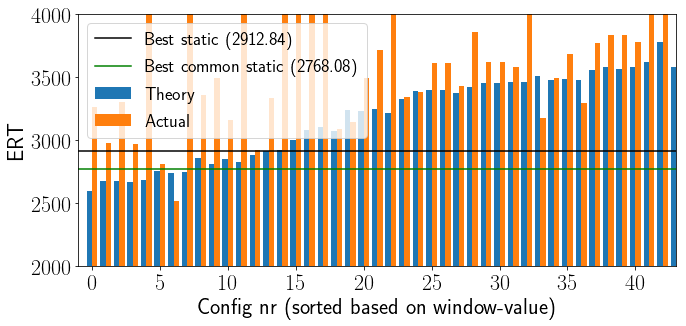

In [241]:
for fid in [7]:
#     fid = 5
#     ERTs,(succeeded_statics,fullstops) = calc_realized_erts(fid)
#     table_split,actuals = createTable_5050_exp(fid,succeeded_statics,fullstops)
    data_static,table_split = load_data_50_50_exp(fid)
    common = get_best_common_vars(fid=fid)
    plt.figure(figsize=(10,5))
    actuals = [(i,j) for i,j in zip(table_split["Predicted ERT"],table_split["Achieved ERT"])]
    plt.bar([i-0.2 for i in range(len(actuals))],[i[0] for i in actuals],label="Theory",width = 0.4)
    plt.bar([i+0.2 for i in range(len(actuals))],[i[1] for i in actuals],label="Actual",width = 0.4)
    ERTs = data_static["ERT"]
#     plt.ylim(min(min(ERTs),min([min(i,j) for i,j in actuals]))*0.9,min(ERTs)*1.5)
#     plt.ylim(1250,1900)
    plt.axhline(min(ERTs),color='k',label=f"Best static ({min(ERTs):.2f})")
    plt.axhline(common[1],color='g',label=f"Best common static ({common[1]:.2f})")


    plt.xlabel("Config nr (sorted based on window-value)")
    plt.ylabel("ERT")
    plt.xlim(-1,43)
    plt.ylim(2000,4000)
    plt.legend(prop={'size' : 18})
    plt.tight_layout()
#     plt.title(f"F{fid}: Predicted vs achieved ERT for split configurations")
    plt.savefig(f"ERTsplitConfigF{fid}_notitle.pdf")
# plt.show()

## Exploration of results

This section contains the code to generate the remaining figures shown in the paper. They are not well documented here, so for more context is is highly recommended to read section 5 of our paper.

In [ ]:
records = []
for fid in fids:
    table = pd.read_csv(f"F{fid}_table_50_50_exp.csv")
    common = get_best_common_vars(fid=fid)
    common_nonipop = get_best_common_vars_nonipop(fid=fid)
    ERTs,(succeeded_statics,fullstops) = calc_realized_erts(fid)
    best_actual_idx = np.argmin(table["Achieved ERT"])
    relimpr = 1-(table["Achieved ERT"][best_actual_idx]/min(ERTs))
    record = (fid,get_final_target(fid),
              reprToString(intToRepr(common[0])),common[1],
              reprToString(intToRepr(common_nonipop[0])),common_nonipop[1],
              reprToString(intToRepr(succeeded_statics[np.argmin(ERTs)])),min(ERTs),
              f"{str(table['C1'][best_actual_idx]).zfill(11)}",f"{str(table['C2'][best_actual_idx]).zfill(11)}",
              table["Splitpoint"][best_actual_idx],table["Predicted ERT"][best_actual_idx],
              table["Achieved ERT"][best_actual_idx],relimpr
             )
    records.append(record)

labels = ["Fid","Target",
          "Best common static","ERT of common static",
          "Best common static (non-IPOP)","ERT of common static (non-IPOP)",
         "Best static", "Best static ERT", 
          "C1 of best split", "C2 of best split",
          "Splitpoint", "Predicted split ERT", 
          "Achieved split ERT","Relative improvement (to best static)"]
table_split_exp = pd.DataFrame.from_records(records, columns=labels)
table_split_exp.to_csv("Overview_table_50_50_experiment.csv")

In [60]:
def config_formatter(conf):
    return f"{str(conf).zfill(11)}"

def ERT_formatter(ert):
    return f"{ert:,.1f}"

# html = HTML('''
#         <style>
#             .df tbody tr:nth-child(even) { background-color: lightblue; }
#         </style>
#         ''' + pd.read_csv("Overview_table_50_50_experiment.csv",index_col=0).to_html(formatters = {"Best common static" : config_formatter,
#                                                                                                   "Best common static (non-IPOP)" : config_formatter,
#                                                                                                   "Best static" : config_formatter,
#                                                                                                   "C1 of best split" : config_formatter,
#                                                                                                   "C2 of best split" : config_formatter,
#                                                                                                   "ERT of common static" : ERT_formatter,
#                                                                                                   "ERT of common static (non-IPOP)" : ERT_formatter,
#                                                                                                   "Best static ERT" : ERT_formatter,},escape=False))
# html

In [104]:
pd.read_csv("Overview_table_50_50_experiment.csv",index_col=0).to_latex("Table_overview_tex",formatters = {"Best common static" : config_formatter,
                                                                                                  "Best common static (non-IPOP)" : config_formatter,
                                                                                                  "Best static" : config_formatter,
                                                                                                  "C1 of best split" : config_formatter,
                                                                                                  "C2 of best split" : config_formatter,
                                                                                                  "ERT of common static" : ERT_formatter,
                                                                                                  "ERT of common static (non-IPOP)" : ERT_formatter,
                                                                                                  "Best static ERT" : ERT_formatter,},escape=False)


In [61]:
def plot_combined_module_activation_50_50(fid,ax=None):
    tsorted_new = np.load(f"Splits_F{fid}_new2.npy")
    colors = ['r','g','b']

    if ax is None:
        fig, ax = plt.subplots(2,1,figsize=(10,10))
        ax[0].set_title(f"F{fid}: Combined module activation for $C_1$")
        ax[0].set_xticks(range(10))
        ax[0].set_xticklabels(conf_names[:10])
        ax[0].set_yticks([0.5,2.5])
        ax[0].set_yticklabels(["Off","On"])
        ax[0].axhline(3.5,color='k',lw=2,ls='--')
        axy = ax[0].twinx()
        axy.set_ylim(0,5)
        ax[0].set_ylim(0,5)
        axy.set_yticks([0.5,2.5,4.5])
        axy.set_yticklabels(["Off","Sobol","Halton"])
        for tick in ax[0].get_xticklabels():
            tick.set_rotation(30)
        ax[1].set_title(f"F{fid}: Combined module activation for $C_2$")
        ax[1].set_xticks(range(10))
        ax[1].set_xticklabels(conf_names[:10])
        ax[1].set_yticks([0.5,2.5])
        ax[1].set_yticklabels(["Off","On"])
        axy1 = ax[1].twinx()
        axy1.set_ylim(0,5)
        ax[1].set_ylim(0,5)
        axy1.set_yticks([0.5,2.5,4.5])
        axy1.set_yticklabels(["Off","Sobol","Halton"])
        ax[1].axhline(3.5,color='k',lw=2,ls='--')

        for tick in ax[1].get_xticklabels():
            tick.set_rotation(30)

#     plt.figure(figsize=(20,10))
#     plt.title(f"F{fid}: Combined module activation for part 1")
    for i in range(50):
        ax[0].plot([2*j +i/50 for j in intToRepr(int(tsorted_new[i][1]))[:10]],alpha=1,lw=1)
#     plt.xticks(range(10),conf_names[:10])
#     plt.show()


#     plt.figure(figsize=(20,10))
#     plt.title(f"F{fid}: Combined module activation for part 2")

    for i in range(50):
        ax[1].plot([2*j +i/50 for j in intToRepr(int(tsorted_new[i][2]))[:10]],alpha=1,lw=1)
#     plt.xticks(range(10),conf_names[:10])
#     plt.show()
    ax[1].axhline(1.5,color='k',lw=5)
    ax[0].axhline(1.5,color='k',lw=5)
    filename = f"F{fid}_combined_module_activation_split_50_50.pdf"
    plt.tight_layout()
    plt.savefig(filename)
    return filename

def plot_combined_module_activation_50_50_static(fid,ax=None):
    ERTs,(succeeded_statics,fullstops) = calc_realized_erts(fid)
    sortedargs = np.argsort(ERTs)[:min(50,len(ERTs))]
    configs = [succeeded_statics[i] for i in sortedargs]
    colors = ['r','g','b']

    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(20,10))
        ax.set_title(f"F{fid}: Combined module activation for best statics")
        ax.set_xticks(range(10))
        ax.set_xticklabels(conf_names[:10])
        ax.set_yticks([0.5,2.5])
        ax.set_yticklabels(["Off","On"])


#     plt.figure(figsize=(20,10))
#     plt.title(f"F{fid}: Combined module activation for part 1")
    for i in range(len(sortedargs)):
        ax.plot([2*j +i/50 for j in intToRepr(int(configs[i]))[:10]],alpha=1,lw=1)
#     plt.xticks(range(10),conf_names[:10])
#     plt.show()


#     plt.figure(figsize=(20,10))
#     plt.title(f"F{fid}: Combined module activation for part 2")

#     plt.xticks(range(10),conf_names[:10])
#     plt.show()
    ax.axhline(1.5,color='k',lw=5)
    filename = f"F{fid}_combined_module_activation_statics.pdf"
    plt.savefig(filename)
    return filename

50
50
8
6
50
50
50
50
50
50
50
50
50
50
8
20
32


C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in long_scalars
  


30
13
9
51 3294
61 114
63 501
13


C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


10
54 1266
59 1275
14
5


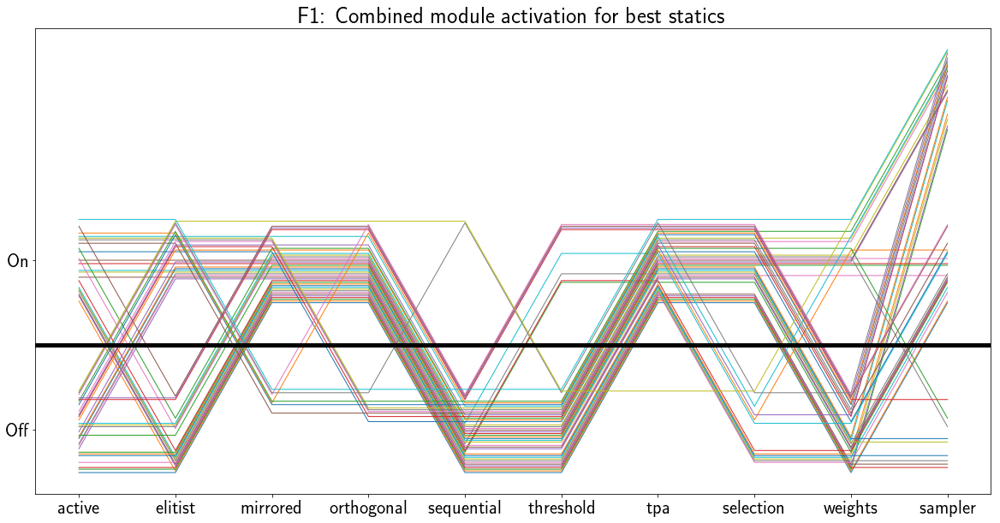

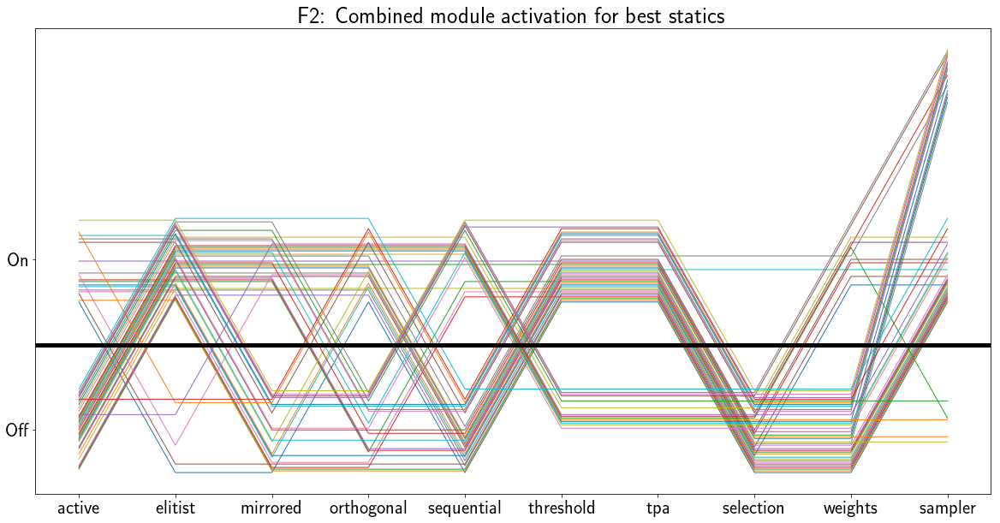

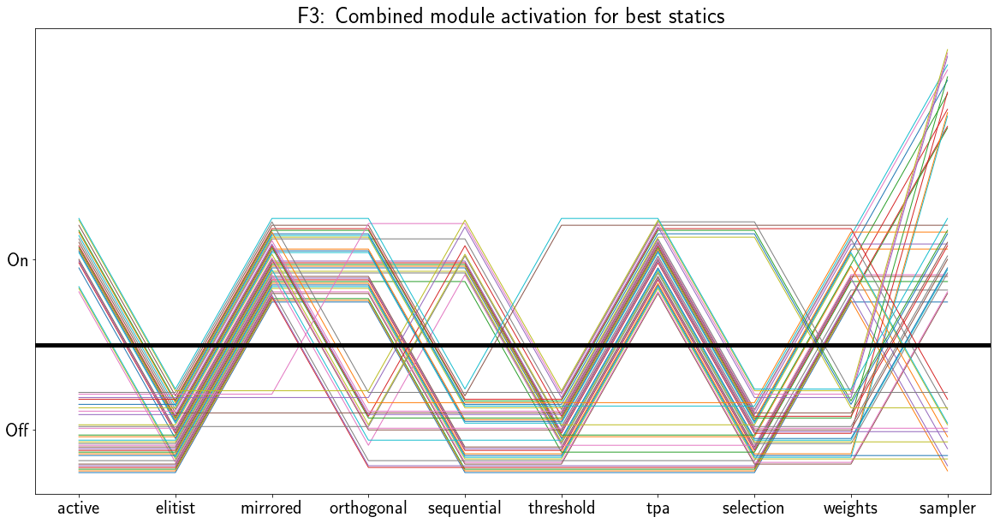

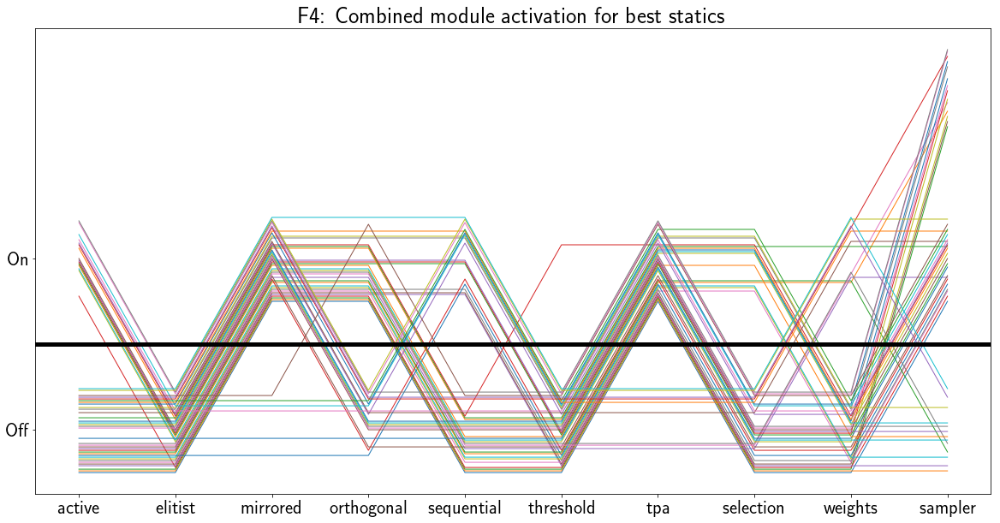

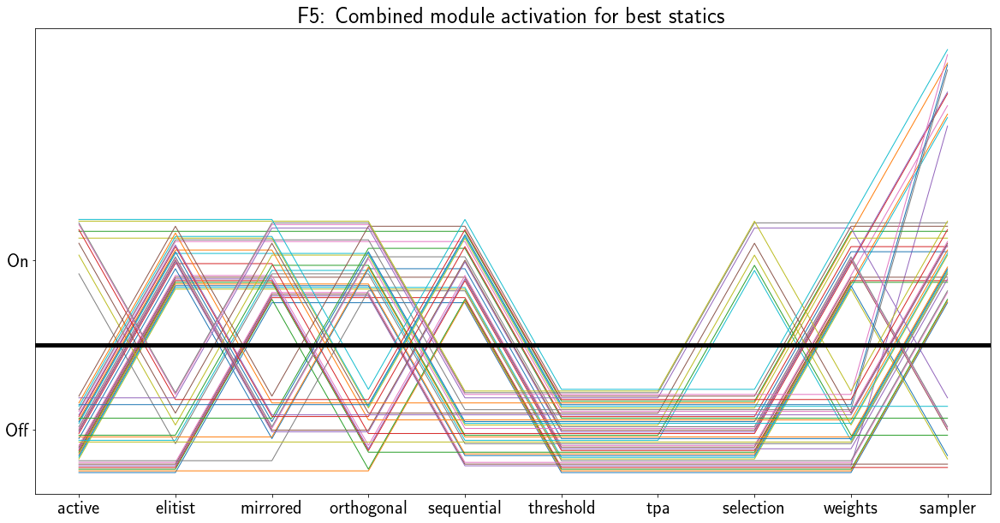

...

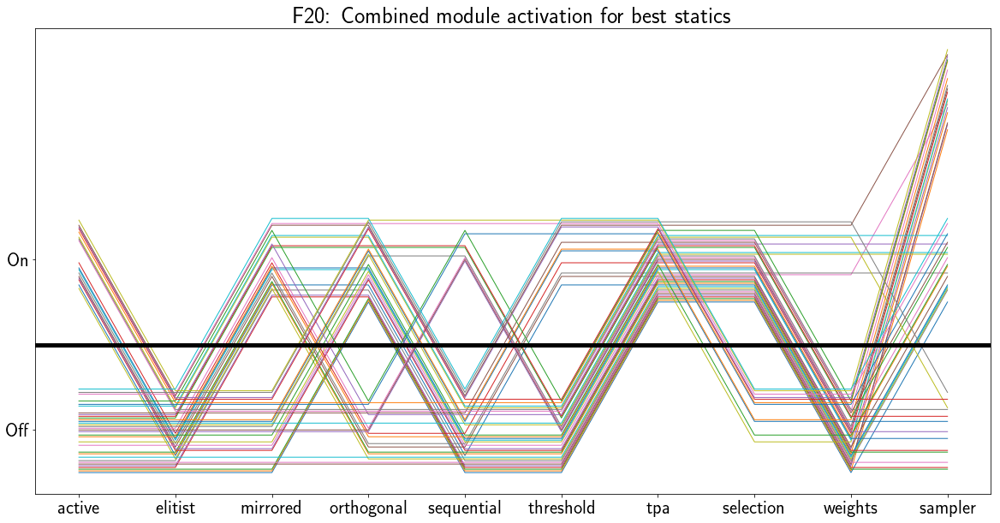

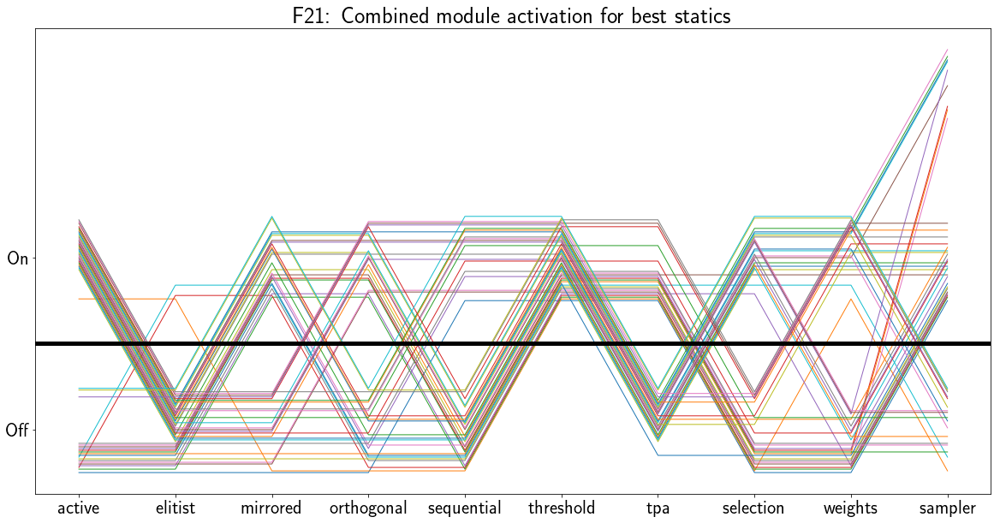

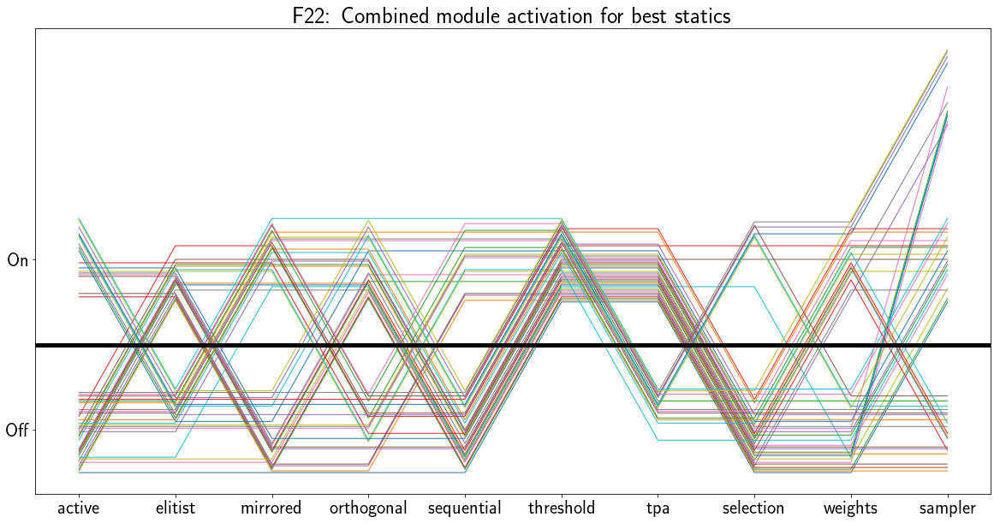

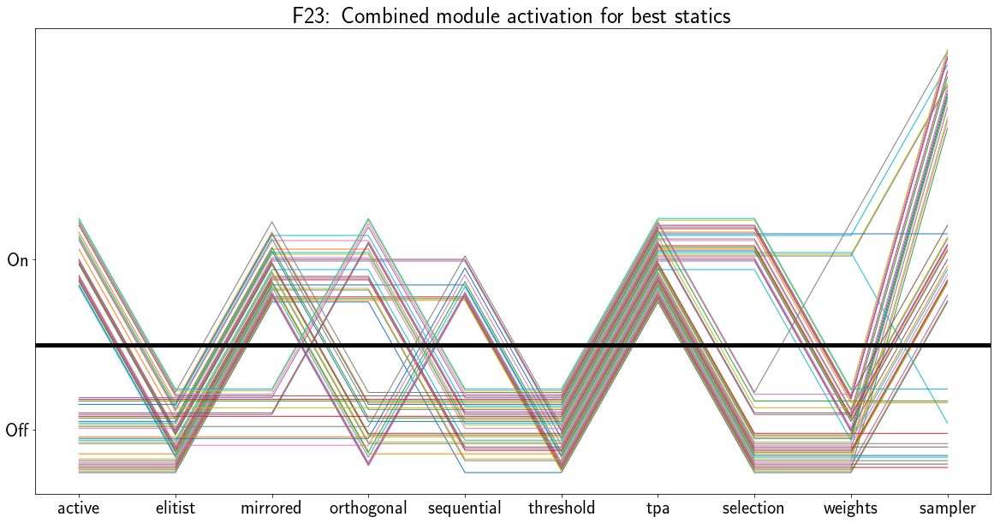

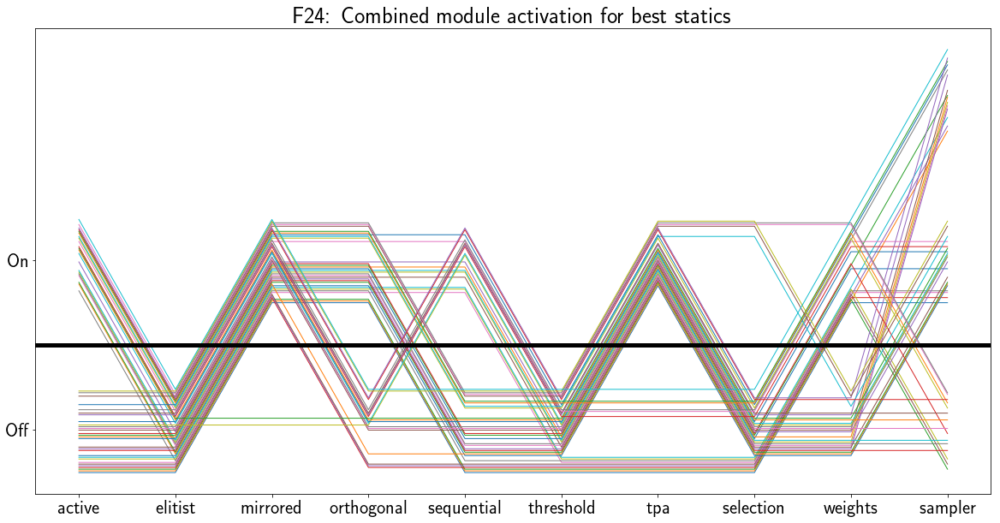

In [60]:
for fid in fids_new:
    plot_combined_module_activation_50_50_static(fid)

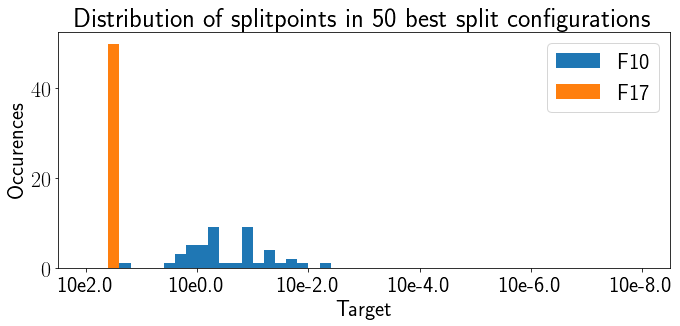

In [136]:
tsorted_new = np.load(f"Splits_F10_new2.npy")
splits10 = [i[0] for i in tsorted_new]
tsorted_new = np.load(f"Splits_F24_new2.npy")
splits24 = [i[0] for i in tsorted_new]
plt.figure(figsize=(10,5))
plt.hist(splits10,bins=range(51),label={"F10"})
plt.hist(splits24,bins=range(51),label={"F17"})
plt.legend()
plt.xlabel("Target")
plt.ylabel("Occurences")
plt.xticks([10*i for i in range(6)],[f"10e{powers[i*10]}" for i in range(6)])
plt.title("Distribution of splitpoints in 50 best split configurations")
plt.tight_layout()
plt.savefig("SplitDistr1024.pdf")
plt.show()
# print(splits24)

In [140]:
modules_complete = np.zeros((48,9))
complete_splits = np.zeros((24,51))
# fids_new = [1,2,3,4,5,6,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]
for i in range(len(fids_new)):
    fid = fids_new[i]
    tsorted_new = np.load(f"Splits_F{fid}_new2.npy")
    c1s = [int(i[1]) for i in tsorted_new]
    c2s = [int(i[2]) for i in tsorted_new]
    for c1,c2 in zip(c1s,c2s):
        modules_complete[2*i] += intToRepr(c1)[:9]
        modules_complete[2*i+1] += intToRepr(c2)[:9]
    for j in tsorted_new:
        complete_splits[i][int(j[0])] += 1

In [ ]:
sums_vals = []
impr_vals = []
impr_vals_nr = []
max_mod_vals = []
for i in range(len(fids_new)):
    fid = fids_new[i]
#     tsorted = np.load(f"Splits_F{fid}_new2.npy")
    sums_vals.append(sum(np.abs(modules_complete[2*i]-modules_complete[2*i+1])))
    max_mod_vals.append(max(np.abs(modules_complete[2*i]-modules_complete[2*i+1])))

    impr_vals_nr.append(table_split_classification_extended["Amount of impr"][fid])
    impr_vals.append(1-table_split_classification_extended["Best split"][fid]/table_split_classification_extended["Best rerun ERT"][fid])
#     print(fid,sum(np.abs(modules_complete[2*i]-modules_complete[2*i+1])),
#           1-table_split_classification_extended["Best split"][fid]/table_split_classification_extended["Best rerun ERT"][fid])

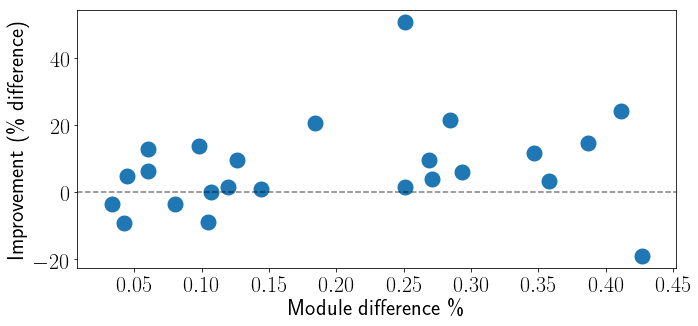

In [268]:
plt.figure(figsize=(10,5))
plt.scatter([i/450 for i in sums_vals],[100*i for i in impr_vals],lw=10)
plt.axhline(0,color='k',ls='--',alpha=0.5)
plt.xlabel("Module difference \%")
plt.ylabel("Improvement (\% difference)")
plt.tight_layout()
plt.savefig("Module_difference_perc_imprs.pdf")
plt.show()

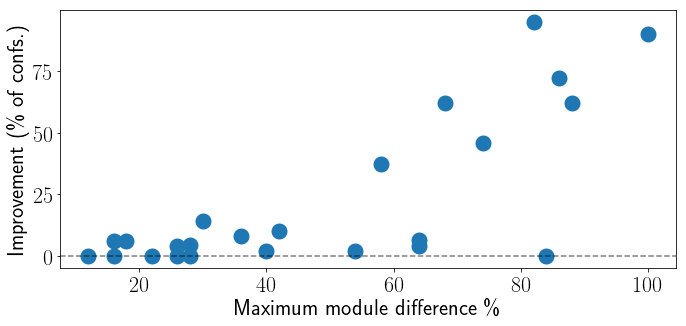

In [269]:
plt.figure(figsize=(10,5))
plt.scatter([100*(i/50) for i in max_mod_vals],impr_vals_nr,lw=10)
plt.axhline(0,color='k',ls='--',alpha=0.5)
# plt.ylim(0,100)
plt.xlabel("Maximum module difference \%")
plt.ylabel("Improvement (\% of confs.)")
plt.tight_layout()
plt.savefig("Module_difference_nr_imprs_max.pdf")
plt.show()

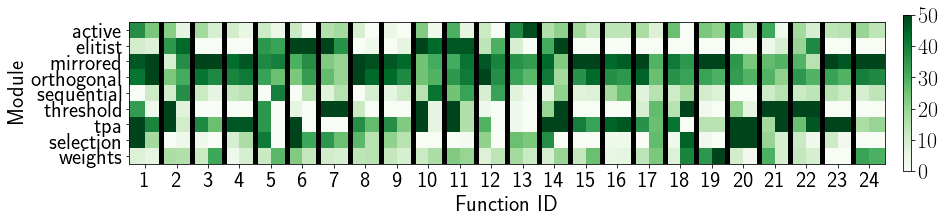

In [248]:
plt.figure(figsize=(15,5))
plt.imshow(modules_complete.T,vmax=50,vmin=0,cmap='Greens')
plt.xticks([2*i+0.5 for i in range(24)],[fids_new[i] for i in range(24)])
plt.yticks(range(9),conf_names[:9])
for i in range(23):
    plt.axvline(1.5+(2*i),color='k',linewidth=5)
plt.tight_layout()
plt.ylabel("Module")
plt.xlabel("Function ID")
plt.colorbar(shrink=0.5,pad=0.02)
plt.tight_layout()
plt.savefig("module_distr_heatmap_bw.pdf")
plt.show()

In [141]:
final_target_idxs = []
for fid in fids_new:
    if fid == 7:
        target = -8.0
    else:
        target = get_final_target(fid)[3:]
    idx = 5*(2-float(target))
    final_target_idxs.append(idx)

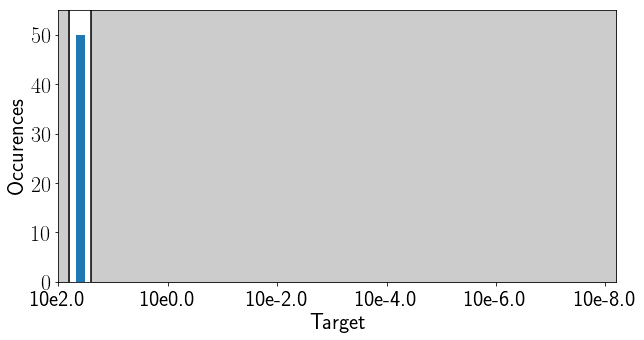

In [169]:
# plt.hist(complete_splits[1],bins=range(51))
fid = 24
plt.figure(figsize=(10,5))
plt.bar(range(51),complete_splits[fid-1])
plt.axvline(1,color='k')
plt.axvline(final_target_idxs[fid-1]-2,color='k')
plt.fill_between([-1,1],[60,60],color='k',alpha=0.2)
plt.fill_between([final_target_idxs[fid-1]-2,51],[60,60],color='k',alpha=0.2)
plt.ylim(0,max(complete_splits[fid-1])*1.1)
plt.xlim(0,51)
plt.xticks([10*i for i in range(6)],[f"10e{powers[i*10]}" for i in range(6)])
plt.xlabel("Target")
plt.ylabel("Occurences")
plt.show()

In [170]:
def plot_splitpoint_hist(fid):
    plt.figure(figsize=(10,5))
    plt.bar(range(51),complete_splits[fid-1])
    plt.axvline(1,color='k')
    plt.axvline(final_target_idxs[fid-1]-2,color='k')
    plt.fill_between([-1,1],[60,60],color='k',alpha=0.2)
    plt.fill_between([final_target_idxs[fid-1]-2,51],[60,60],color='k',alpha=0.2)
    plt.ylim(0,max(complete_splits[fid-1])*1.1)
    plt.xlim(0,51)
    plt.xticks([10*i for i in range(6)],[f"10e{powers[i*10]}" for i in range(6)])
    plt.xlabel("Target")
    plt.ylabel("Occurences")
    plt.tight_layout()
    plt.savefig(f"F{fid}_splitpoint_distr_hist.pdf")

C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


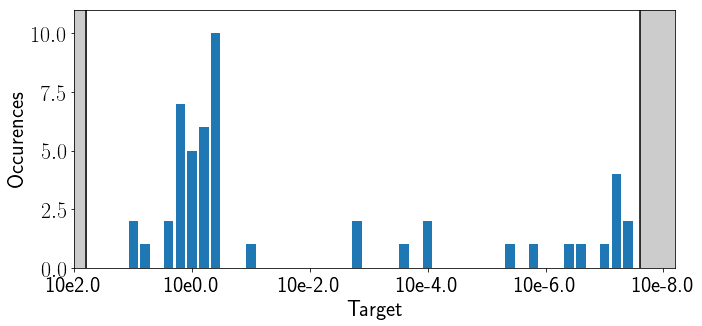

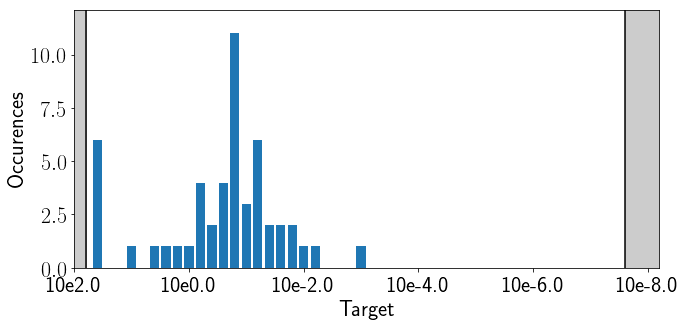

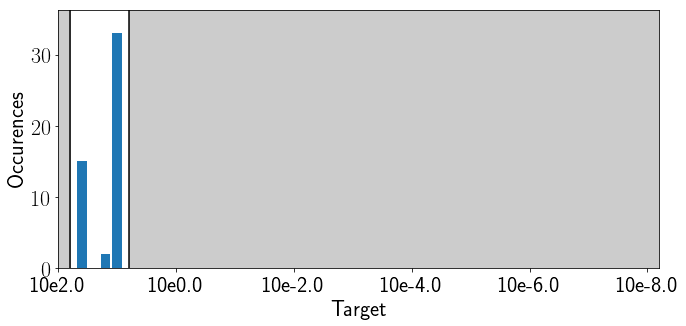

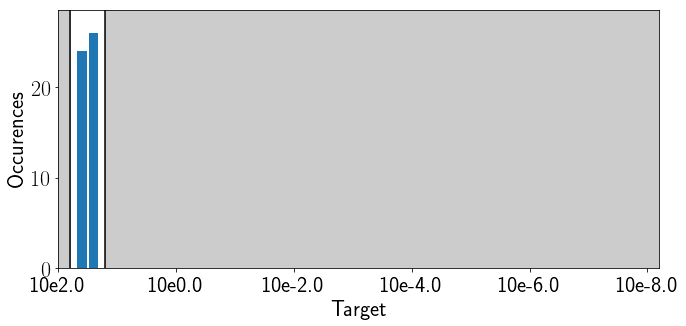

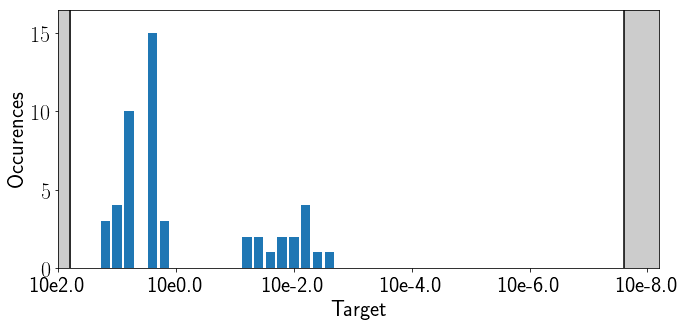

...

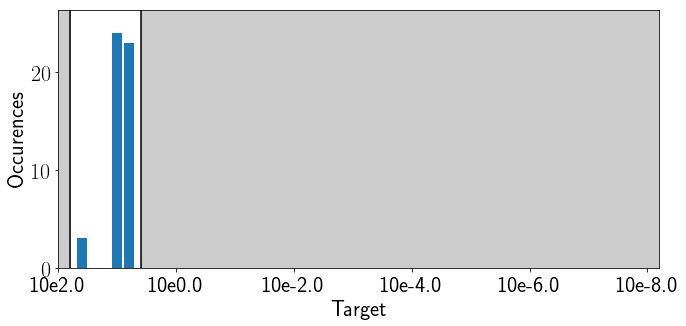

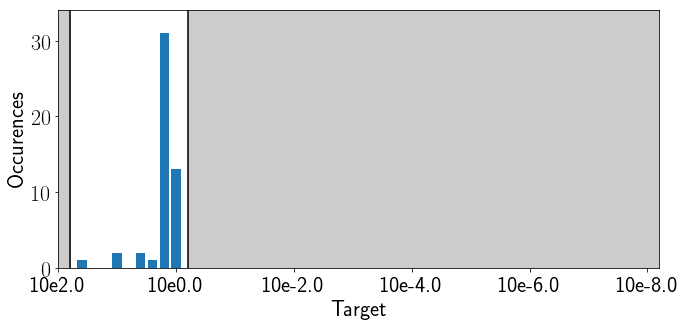

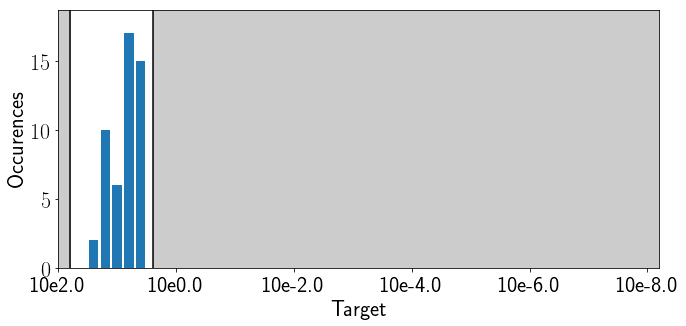

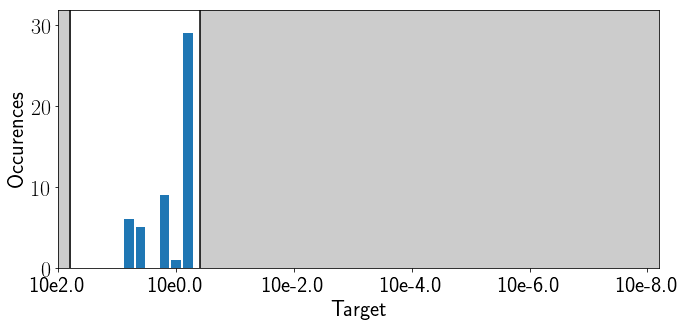

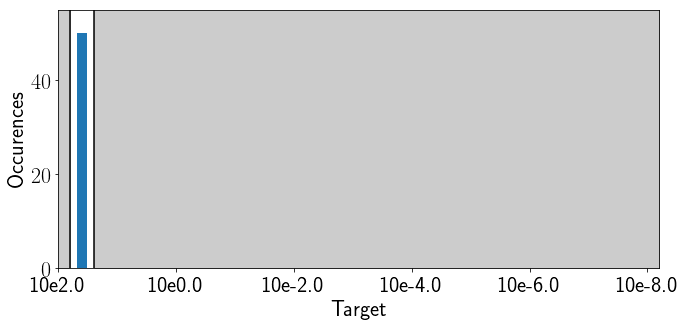

In [171]:
for fid in fids_new:
    plot_splitpoint_hist(fid)


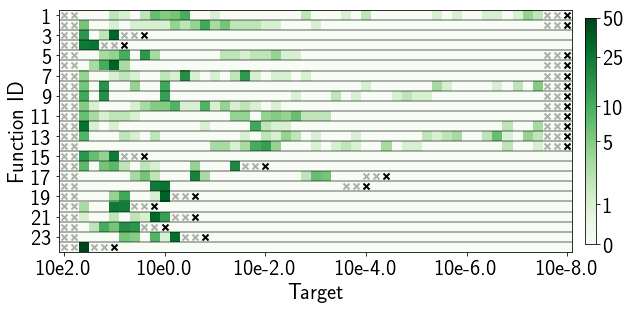

In [251]:
plt.figure(figsize=(10,5))
plt.imshow(np.log(1+complete_splits),cmap='Greens',vmin=0)
plt.yticks([2*i for i in range(12)],[fids_new[2*i] for i in range(12)])
plt.xticks([10*i for i in range(6)],[f"10e{powers[i*10]}" for i in range(6)])
plt.tight_layout()
plt.xlabel("Target")
plt.ylabel("Function ID")
for i in range(23):
    plt.axhline(0.5+i,color='k',alpha=0.4)
cbar = plt.colorbar(shrink=0.78,pad=0.02,ticks=[0,np.log(2),np.log(6),np.log(11),np.log(26),np.log(51)])
cbar.ax.set_yticklabels([0,1,5,10,25,50])
plt.scatter(final_target_idxs,range(24),marker='x',color='k',linewidth=2)

plt.scatter([i-1 for i in final_target_idxs],range(24),marker='x',color='k',linewidth=2,alpha=0.3)
plt.scatter([i-2 for i in final_target_idxs],range(24),marker='x',color='k',linewidth=2,alpha=0.3)
plt.scatter([0 for i in final_target_idxs],range(24),marker='x',color='k',linewidth=2,alpha=0.3)
plt.scatter([1 for i in final_target_idxs],range(24),marker='x',color='k',linewidth=2,alpha=0.3)

plt.savefig("Split_distribution.pdf")
plt.show()

Based on the figure above, we see that the fit between theory and practice is quite good, with some outliers caused by unfinished runs. Overall, the split configurations are definately able to improve the performance of the best static configuration.

Note: the configurations are sorted based on their ranking from the Means-Window approach we used to calculate them.

As a final visualization, we plot the relation between the expected and achieved ERTs as a scatterplot below.

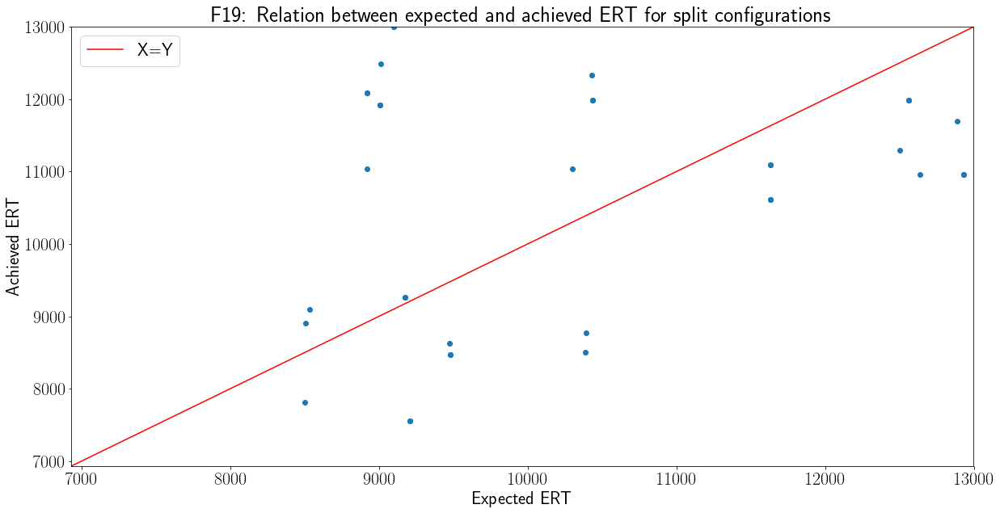

In [176]:
plt.figure(figsize=(20,10))
plt.scatter([i[0] for i in actuals],[i[1] for i in actuals])
plt.plot(range(16000),range(16000),color='r',label="X=Y")
plt.xlim(min(ERTs)*0.8,min(ERTs)*1.5)
plt.ylim(min(ERTs)*0.8,min(ERTs)*1.5)
# slope, intercept, r_value, p_value, std_err = stats.linregress([i[0] for i in actuals],[i[1] for i in actuals])

# print(f"r-squared is {r_value**2}")
# plt.plot(range(16000),intercept+range(16000)*slope,color = 'g',lw=3,label="Actual regression")
plt.xlabel("Expected ERT")
plt.ylabel("Achieved ERT")
plt.legend()
plt.title(f"F{fid}: Relation between expected and achieved ERT for split configurations")
plt.show()

# print("Note: Outliers seem to be caused mostly by non-finished runs")

From this figure, we can see that the fit between theory and practice is indeed quite good, indicating that the lack of roboust data might have been the main issue with our previous experiments.

In [62]:
def load_data_50_50_exp(fid):
    if (not os.path.isfile(f"F{fid}_static_5050.npz")):
        th_ERT = calc_theoretical_erts(fid)
        ERTs,(succeeded_statics,fullstops) = calc_realized_erts(fid)
        np.savez(f"F{fid}_static_5050.npz", th_ERT = th_ERT, ERT = ERTs, succeeded = succeeded_statics, fullstops = fullstops)
    data_static = np.load(f"F{fid}_static_5050.npz")
    data_split = pd.read_csv(f"F{fid}_table_50_50_exp.csv",index_col=0)
    return data_static,data_split

In [265]:
first_ert_split = []
best_ert_splits = []
for fid in fids_new:
    _,a = load_data_50_50_exp(fid)
    first_ert_split.append(a["Achieved ERT"][0])
    best_ert_splits.append(min(a["Achieved ERT"]))
    

In [ ]:
fids_new = [i+1 for i in range(24)]
records = []
records_extended = []
for fid in fids_new:
#     print(f"F{fid}, with target {get_final_target(fid)}")
    data_static,data_split = load_data_50_50_exp(fid)
    common = get_best_common_vars(fid=fid)
    
    target = get_final_target(fid)
    common_ERT = common[1]
    best_static,val = get_static_vals_orig(fid)
    best_static_has_IPOP = intToRepr(int(best_static))[-1]
    
    best_rerun = min(data_static['ERT'])
    best_split = min(data_split['Achieved ERT'])
    predicted_split = min(data_split['Predicted ERT'])
    if(np.argmin(data_split['Predicted ERT']) != np.argmin(data_split['Achieved ERT'])):
        print(fid)
    
#     if (common[1] < min(data_static["ERT"])):
#         common_or_st = "Best common better than best rerun static"
#     elif (common[1] == np.inf):
#         print("Common has inf")
#         if(intToRepr(int(best_static))[-1] > 0):
#             print(f"Best static (with (B)IPOP): {val}, vs {min(data_static['ERT'])}")
#         else:
#             print("Best static has no (B)IPOP")
#     else:
#         if(min(data_split['Achieved ERT']) < min(data_static['ERT'])):
#             print("Best split is better than best static")
#         else:
#             print("Failed to beat best static")
#         print(f"Split gets {min(data_split['Achieved ERT'])} vs static of {min(data_static['ERT'])} ")
    avg_first_10 = np.mean(sorted(data_split["Achieved ERT"])[:10])
    nr_better_static = np.sum([(i < min(data_static['ERT'])) for i in data_split['Achieved ERT']])
    nr_succeeded = len(data_split)    
    perc_better_static = nr_better_static/nr_succeeded *100

        
    record = [fid,target,common_ERT,val,best_static_has_IPOP,best_rerun,best_split,avg_first_10,perc_better_static]
    records.append(record)
    
    common_non_IPOP = get_best_common_vars_nonipop(fid)
    static_conf_idx = np.argmin(data_static['ERT'])
    static_conf = data_static['succeeded'][static_conf_idx]
#     print(static_conf)
    record_extended = [fid,target,intToRepr(common[0]),common_ERT,
                       intToRepr(common_non_IPOP[0]),common_non_IPOP[1],
                       best_static_has_IPOP,val,
                       intToRepr(static_conf),best_rerun,
                       best_split,predicted_split,
                       avg_first_10,perc_better_static
                      ]
    records_extended.append(record_extended)
    
labels = ["Fid","Target","Common ERT","Best ERT","Has IPOP","Best rerun","Best split","Avg 10 splits","Amount of impr"]
table_split_classification = pd.DataFrame.from_records(records, columns=labels)
labels_extended =  ["Fid","Target","Common config","Common ERT",
                    "Common config(non IPOP)", "non IPOP ERT",
                    "Has (B)IPOP","Best static ERT",
                    "Best rerun config","Best rerun ERT",
                    "Best split","Predicted split",
                    "Avg 10 splits","Amount of impr"]

table_split_classification_extended = pd.DataFrame.from_records(records_extended, columns=labels_extended,index="Fid")


In [58]:
table_split_classification_extended

,Target,Common config,Common ERT,Common config(non IPOP),non IPOP ERT,Has (B)IPOP,Best static ERT,Best rerun config,Best rerun ERT,Best split,Predicted split,Avg 10 splits,Amount of impr
Fid,,,,,,,,,,,,,
1,10e-8.0,"[1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]",7.951000e+02,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]",798.700000,0,412.00,"[0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0]",452.736000,446.5,421.9,452.71,6.382979
2,10e-8.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]",2.312920e+03,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]",2337.640000,0,1347.96,"[1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0]",1447.840000,1236.5,1281.5,1282.53,72.000000
3,10e0.4,"[1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2]",1.787112e+04,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",inf,2,2751.60,"[0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0]",9316.048193,9189.0,9104.1,9770.67,2.000000
4,10e0.8,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2]",7.301240e+03,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",inf,2,2837.28,"[0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0]",11162.216867,10455.7,11023.8,11034.36,6.000000
5,10e-8.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]",1.700120e+03,"[0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0]",1730.680000,0,1268.12,"[0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0]",1460.864000,1110.5,1319.9,1128.32,95.000000
6,10e-8.0,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]",1.540000e+03,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]",1540.000000,0,1106.36,"[0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0]",1234.464000,971.2,1104.0,1008.03,90.000000
7,10e-8.0,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]",2.768080e+03,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",inf,1,1471.08,"[0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0]",2912.838710,2517.7,2598.0,3002.57,4.444444
8,10e-8.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]",2.622560e+03,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",inf,2,1764.96,"[0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]",2233.216000,2215.6,2039.1,2238.72,4.000000
9,10e-8.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]",2.524120e+03,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]",inf,1,1725.92,"[0, 0, 1, 1, 0, 0, 0, 0, 0, 2, 0]",1938.144000,1939.6,1720.3,2095.46,0.000000


In [299]:
def perc_formatter(value):
    return f"{value:.0f}\%"

In [255]:
impr_fids = [(k,l,j)if i<j  else (np.nan,np.nan,np.nan) for i,j,k,l in zip(table_split_classification_extended["Avg 10 splits"],table_split_classification_extended["Best rerun ERT"],table_split_classification_extended["Predicted split"],table_split_classification_extended["Best split"])]
non_impr_fids = [(k,l,j)if i>j  else (np.nan,np.nan,np.nan) for i,j,k,l in zip(table_split_classification_extended["Avg 10 splits"],table_split_classification_extended["Best rerun ERT"],table_split_classification_extended["Predicted split"],table_split_classification_extended["Best split"])]



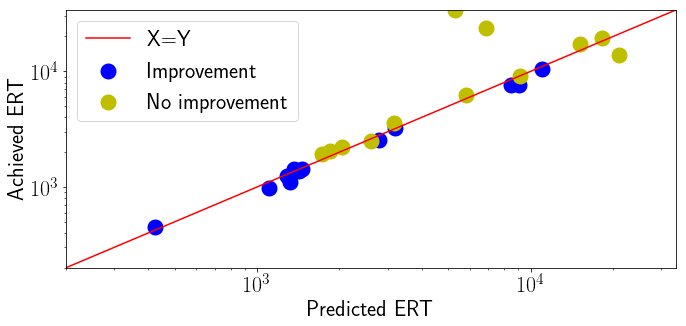

In [256]:
plt.figure(figsize=(10,5))
# to_color = ["Green" if i<j else "Blue" for i,j in zip(table_split_classification_extended["Avg 10 splits"],table_split_classification_extended["Best rerun ERT"])]
# plt.scatter(table_split_classification_extended["Predicted split"],table_split_classification_extended["Best split"],c=to_color)
plt.scatter([i[0] for i in impr_fids],[i[1] for i in impr_fids],label="Improvement",color="B",lw=10)
plt.scatter([i[0] for i in non_impr_fids],[i[1] for i in non_impr_fids],label="No improvement",color="Y",lw=10)
# for i in fids_new:
#     plt.annotate(i,xy=(table_split_classification_extended["Predicted split"][i],table_split_classification_extended["Best split"][i]),fontsize=13)
# for i in range(len(impr)):
#     plt.plot([impr[i][0],impr[i][0]],[impr[i][1],impr[i][2]],color="k")
#     plt.plot([non_impr[i][0],non_impr[i][0]],[non_impr[i][1],non_impr[i][2]],color="k")

plt.plot(range(35000),range(35000),color='r',label="X=Y")
plt.yscale('log')
plt.xscale('log')
plt.ylim(200,34000)
plt.xlim(200,34000)
plt.xlabel("Predicted ERT")
plt.ylabel("Achieved ERT")
plt.legend()
plt.tight_layout()
plt.savefig("scatter_ert_split.pdf")
plt.show()

In [303]:
def ERT_formatter(val):
    if val == np.inf:
        return "\infty"
    return f"{val:,.0f}"


In [57]:
tc = table_split_classification_extended

In [260]:
rel_gains = [100*(1-j/i) for i,j in zip(tc["Best rerun ERT"],tc["Best split"])]
rel_gains_com = [100*(1-j/i) for i,j in zip(tc["Common ERT"],tc["Best split"])]

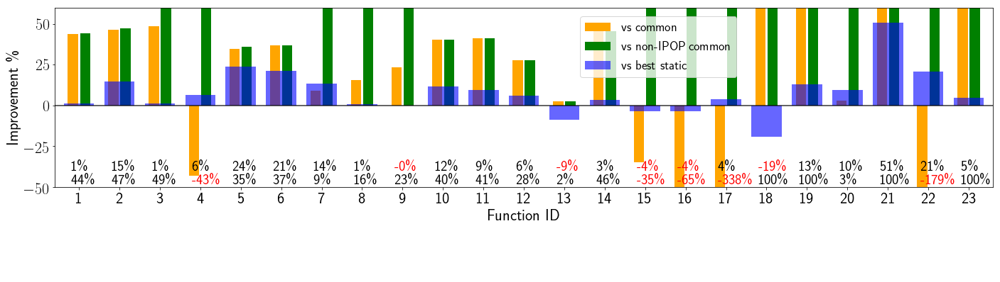

In [261]:
plt.figure(figsize=(20,5))
# plt.bar(range(23),tc["Common ERT"],alpha=0.3,label='Common',color='b')
# plt.bar(range(23),tc["non IPOP ERT"],alpha=0.6, label='non IPOP',color='b')

plt.bar([i-0.15 for i in range(24)],[100*(1-j/i) for i,j in zip(tc["Common ERT"],tc["Best split"])],width=0.25,label='vs common',color='orange')
plt.bar([i+0.15 for i in range(24)],[100*(1-j/i) for i,j in zip(tc["non IPOP ERT"],tc["Best split"])],width=0.25,label='vs non-IPOP common',color='g')
plt.bar([i for i in range(24)],[100*(1-j/i) for i,j in zip(tc["Best rerun ERT"],tc["Best split"])],width=0.75,alpha=0.6,label='vs best static',color='b')

# plt.bar([i+0.15 for i in range(23)],tc["Best split"],width=0.25, label='Best adaptive',color= 'g')
# plt.yscale('log')
plt.axhline(0,color='k',alpha=0.8)
# plt.xticks(range(23),[f"F{i} ({j:.1f}\%)" for i,j in zip(fids_new,rel_gains)],rotation=35)
plt.xticks(range(24),fids_new)

for i in range(24):
    plt.annotate(f"{rel_gains[i]:.0f}\%",(i-0.2,-40),fontsize=20,color=f"{'r' if rel_gains[i] <0 else 'k' }")
    plt.annotate(f"{rel_gains_com[i]:.0f}\%",(i-0.2,-48),fontsize=20,color=f"{'r' if rel_gains_com[i] <0 else 'k' }")

plt.xlim(-0.6,22.6)
plt.xlabel("Function ID")
plt.ylabel("Improvement \%")
plt.ylim(-50,60)
# axbox = plt.get_position()

plt.legend(loc = (0.56,0.61), prop={'size':18})

plt.tight_layout()
plt.savefig("Improvements_final_comparison_relative_labeled2.pdf")
plt.show()

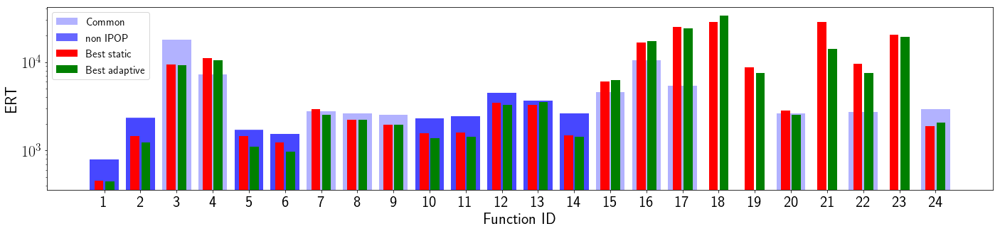

In [262]:
plt.figure(figsize=(20,5))
plt.bar(range(24),tc["Common ERT"],alpha=0.3,label='Common',color='b')
plt.bar(range(24),tc["non IPOP ERT"],alpha=0.6, label='non IPOP',color='b')

plt.bar([i-0.15 for i in range(24)],tc["Best rerun ERT"],width=0.25,label='Best static',color='r')
plt.bar([i+0.15 for i in range(24)],tc["Best split"],width=0.25, label='Best adaptive',color= 'g')
plt.yscale('log')
plt.legend(prop={'size':15})
plt.xticks(range(24),fids_new)
plt.xlabel("Function ID")
plt.ylabel("ERT")
plt.tight_layout()
plt.savefig("Improvements_final_comparison_wide.pdf")
plt.show()

In [304]:
table_split_classification_extended.to_latex("Table_overview_tex_classify_extended2",formatters={"Predicted split" : ERT_formatter,"Common ERT" : ERT_formatter,"Best ERT": ERT_formatter,"Best rerun ERT": ERT_formatter,"Best split": ERT_formatter,"Avg 10 splits": ERT_formatter,"non IPOP ERT":ERT_formatter,"Common config":reprToString,"Common config(non IPOP)":reprToString,"Best static conf":reprToString,"Best rerun config":reprToString,"Best static ERT":ERT_formatter,"Amount of impr":perc_formatter},escape=False)

In [63]:
def get_static_vals_orig(fid):
    df = get_data(fid=fid,ndim=5)
    df = df.replace(np.nan,np.inf)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID']).mean()
    vals = np.array(dfmeans[get_final_target(fid)])
    return (np.argmin(vals),np.min(vals))


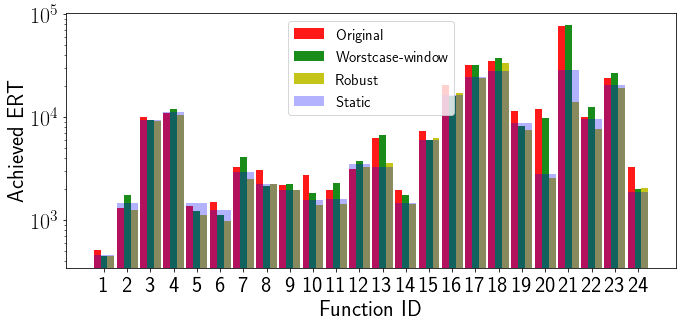

In [263]:
plt.figure(figsize=(10,5))
# plt.bar([i for i in range(23)],tc["Best rerun ERT"],width=0.9,alpha=0.7,color='y',label="Static")

plt.bar([i -0.3 for i in range(24)],results_corrected_comparison['orig'],width=0.3,alpha=0.9,color='r',label="Original")
plt.bar([i for i in range(24)],results_corrected_comparison['worst'],width=0.3,alpha=0.9,color='g',label="Worstcase-window")
plt.bar([i +0.3 for i in range(24)],tc["Best split"],width=0.3,alpha=0.9,color='y',label="Robust")
plt.bar([i for i in range(24)],tc["Best rerun ERT"],width=0.9,alpha=0.3,color='b',label="Static")

plt.xticks(range(24),fids_new)
plt.yscale('log')
plt.xlabel("Function ID")
plt.ylabel("Achieved ERT")
plt.legend(prop={'size':15})
plt.tight_layout()
plt.savefig("comparison_3_methods_ert.pdf")
plt.show()

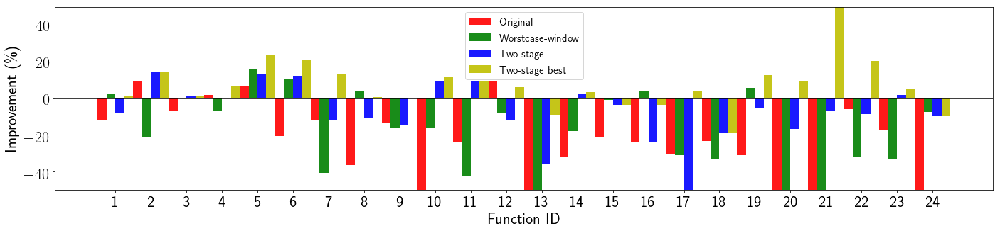

In [266]:
plt.figure(figsize=(20,5))
# plt.bar([i for i in range(23)],tc["Best rerun ERT"],width=0.9,alpha=0.7,color='y',label="Static")

plt.bar([i -0.375 for i in range(24)],[100*(1-j/i) for i,j in zip(tc["Best rerun ERT"],results_corrected_comparison['orig'])],width=0.25,alpha=0.9,color='r',label="Original")
plt.bar([i - 0.125 for i in range(24)],[100*(1-j/i) for i,j in zip(tc["Best rerun ERT"],results_corrected_comparison['worst'])],width=0.25,alpha=0.9,color='g',label="Worstcase-window")
plt.bar([i +0.125 for i in range(24)],[100*(1-j/i) for i,j in zip(tc["Best rerun ERT"],first_ert_split)],width=0.25,alpha=0.9,color='b',label="Two-stage")
plt.bar([i + 0.375 for i in range(24)],[100*(1-j/i) for i,j in zip(tc["Best rerun ERT"],tc["Best split"])],width=0.25,alpha=0.9,color='y',label="Two-stage best")
# plt.bar([i for i in range(23)],tc["Best rerun ERT"],width=0.9,alpha=0.3,color='b',label="Static")
# first_ert_split


plt.xticks(range(24),fids_new)
# plt.yscale('log')
plt.ylim(-50,50)
plt.axhline(0,color='k')
plt.xlabel("Function ID")
plt.ylabel("Improvement (\%)")
plt.legend(prop={'size':15})
plt.tight_layout()
plt.savefig("comparison_3_methods_percent_updated_wide.pdf")
plt.show()

In [482]:
def calcERTsNewExp(fid):
    erts_ww = []
    erts_orig = []
    
    target = 10**float(get_final_target(fid)[3:])
    confs_ww = get_sorted_var2(fid,method="")
    confs_orig = get_sorted_var2(fid,method="orig")
    for i,j in zip(confs_ww,confs_orig):
        rep1 = int(i[1])
        rep2 = int(i[2])
        rep1o = int(j[1])
        rep2o = int(j[2]) 
            
        try:

            data_ww = np.load(data_location+"New_exp_ww/" + file_name_params_split.format(fid=fid,ndim=5,rep=reprToString(intToRepr(rep1)),rep2=reprToString(intToRepr(rep2))),encoding='bytes')['fitness']     
            ert_ww = calc_actual_ERT_split(data_ww,rep1,rep2,i[0],target)
            erts_ww.append(ert_ww)
        except:
            ertw_ww.append(np.nan)
        try:
            data_orig = np.load(data_location+"New_exp_orig/" + file_name_params_split.format(fid=fid,ndim=5,rep=reprToString(intToRepr(rep1o)),rep2=reprToString(intToRepr(rep2o))),encoding='bytes')['fitness']
            ert_orig = calc_actual_ERT_split(data_orig,rep1o,rep2o,j[0],target)
            erts_orig.append(ert_orig)
        except:
            erts_orig.append(np.nan)
    
    return (erts_ww,erts_orig)

In [ ]:
restuls_ww = []
results_orig = []
for fid in fids_new:
    (erts_ww,erts_orig) = calcERTsNewExp(fid)
    results_ww.append(np.nanmin(erts_ww))
    results_orig.append(np.nanmin(erts_orig))
    

In [ ]:
plt.figure(figsize=(10,5))
# plt.bar([i for i in range(23)],tc["Best rerun ERT"],width=0.9,alpha=0.7,color='y',label="Static")

plt.bar([i -0.3 for i in range(23)],[100*(1-j/i) for i,j in zip(tc["Best rerun ERT"],results_orig)],width=0.3,alpha=0.9,color='r',label="Original")
plt.bar([i for i in range(23)],[100*(1-j/i) for i,j in zip(tc["Best rerun ERT"],results_ww)],width=0.3,alpha=0.9,color='g',label="Worstcase-window")
# plt.bar([i +0.3 for i in range(23)],[100*(1-j/i) for i,j in zip(tc["Best rerun ERT"],tc["Best split"])],width=0.3,alpha=0.9,color='y',label="Robust")
# plt.bar([i for i in range(23)],tc["Best rerun ERT"],width=0.9,alpha=0.3,color='b',label="Static")
# first_ert_split
plt.bar([i +0.3 for i in range(23)],[100*(1-j/i) for i,j in zip(tc["Best rerun ERT"],first_ert_split)],width=0.3,alpha=0.9,color='y',label="Two-stage")


plt.xticks(range(23),fids_new)
# plt.yscale('log')
plt.ylim(-50,50)
plt.axhline(0,color='k')
plt.xlabel("Function ID")
plt.ylabel("Improvement (\%)")
plt.legend(prop={'size':15})
plt.tight_layout()
plt.savefig("comparison_3_methods_percent_50.pdf")
plt.show()

In [138]:
def plot_combined_module_activation_impr(fid,ax=None):
    tsorted_new = np.load(f"Splits_F{fid}_new2.npy")
    colors = ['r','g','b']
    data_static,table_split = load_data_50_50_exp(fid)
    impr_confs = [i  for i in range(len(table_split['Achieved ERT'])) if table_split['Achieved ERT'][i] < min(data_static['ERT'])]
    if ax is None:
        fig, ax = plt.subplots(2,1,figsize=(10,10))
        ax[0].set_title(f"F{fid}: Combined module activation for $C_1$")
        ax[0].set_xticks(range(10))
        ax[0].set_xticklabels(conf_names[:10])
        ax[0].set_yticks([0.5,2.5])
        ax[0].set_yticklabels(["Off","On"])
        ax[0].axhline(3.5,color='k',lw=2,ls='--')
        axy = ax[0].twinx()
        axy.set_ylim(0,5)
        ax[0].set_ylim(0,5)
        axy.set_yticks([0.5,2.5,4.5])
        axy.set_yticklabels(["Off","Sobol","Halton"])
        for tick in ax[0].get_xticklabels():
            tick.set_rotation(30)
        ax[1].set_title(f"F{fid}: Combined module activation for $C_2$")
        ax[1].set_xticks(range(10))
        ax[1].set_xticklabels(conf_names[:10])
        ax[1].set_yticks([0.5,2.5])
        ax[1].set_yticklabels(["Off","On"])
        axy1 = ax[1].twinx()
        axy1.set_ylim(0,5)
        ax[1].set_ylim(0,5)
        axy1.set_yticks([0.5,2.5,4.5])
        axy1.set_yticklabels(["Off","Sobol","Halton"])
        ax[1].axhline(3.5,color='k',lw=2,ls='--')

        for tick in ax[1].get_xticklabels():
            tick.set_rotation(30)

#     plt.figure(figsize=(20,10))
#     plt.title(f"F{fid}: Combined module activation for part 1")
    for i in impr_confs:
        confstr = str(table_split['C1'][i]).zfill(11)
        ax[0].plot([2*int(j)+i/50 for j in confstr[:10]],alpha=1,lw=1)
#         ax[0].plot([2*j +i/50 for j in intToRepr(int(tsorted_new[i][1]))[:10]],alpha=1,lw=1)
#     plt.xticks(range(10),conf_names[:10])
#     plt.show()


#     plt.figure(figsize=(20,10))
#     plt.title(f"F{fid}: Combined module activation for part 2")

    for i in impr_confs:
        confstr = str(table_split['C2'][i]).zfill(11)
        ax[1].plot([2*int(j)+i/50 for j in confstr[:10]],alpha=1,lw=1)
#         ax[1].plot([2*j +i/50 for j in intToRepr(int(tsorted_new[i][2]))[:10]],alpha=1,lw=1)
#     plt.xticks(range(10),conf_names[:10])
#     plt.show()
    ax[1].axhline(1.5,color='k',lw=5)
    ax[0].axhline(1.5,color='k',lw=5)
    filename = f"F{fid}_combined_module_activation_split_impr.pdf"
    plt.tight_layout()
#     plt.show()
    plt.savefig(filename)
#     return filename

C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


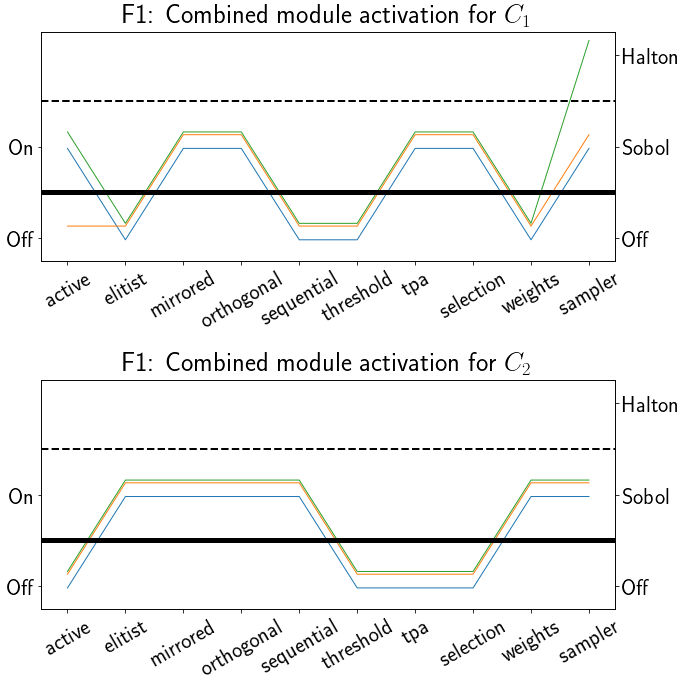

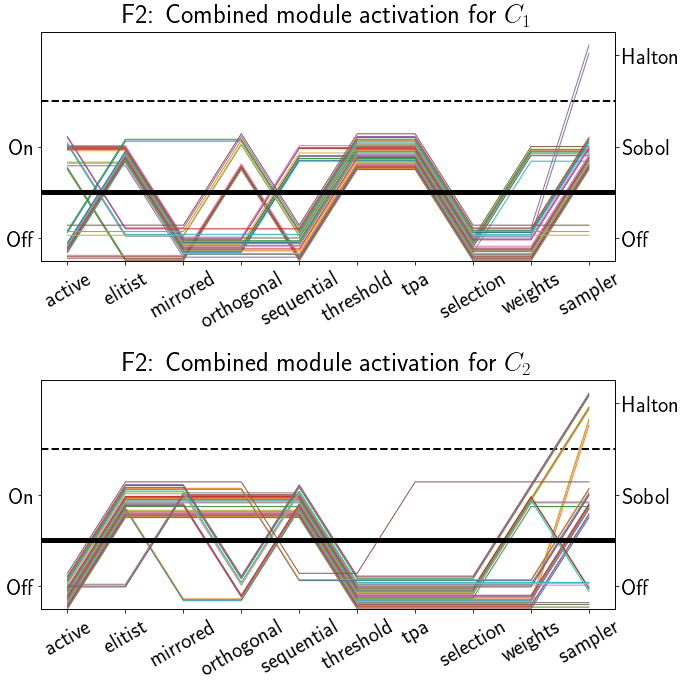

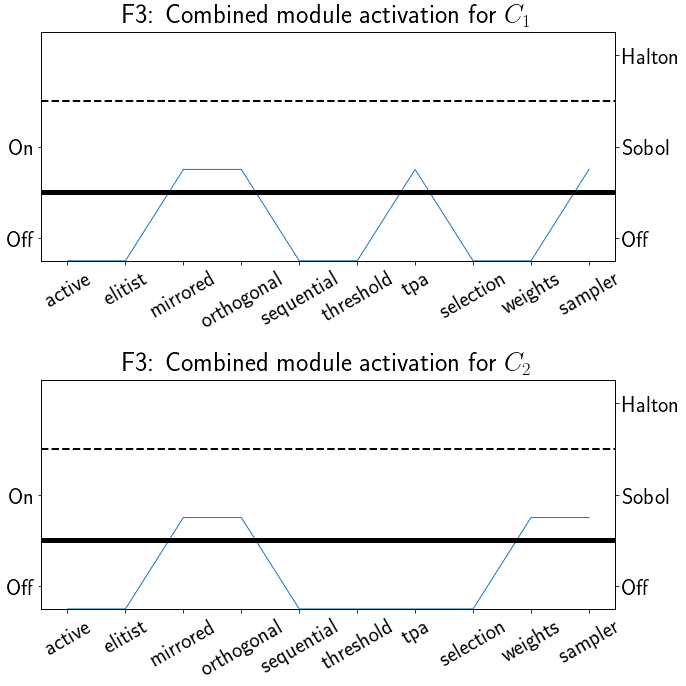

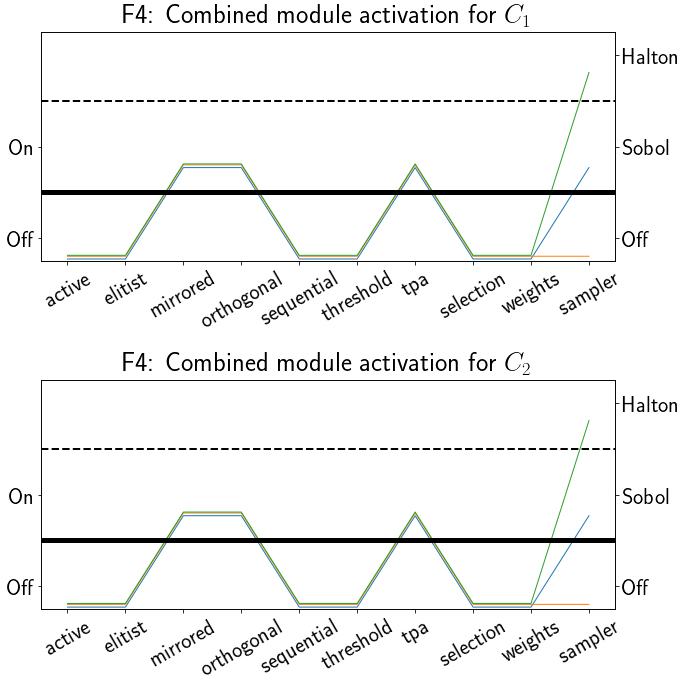

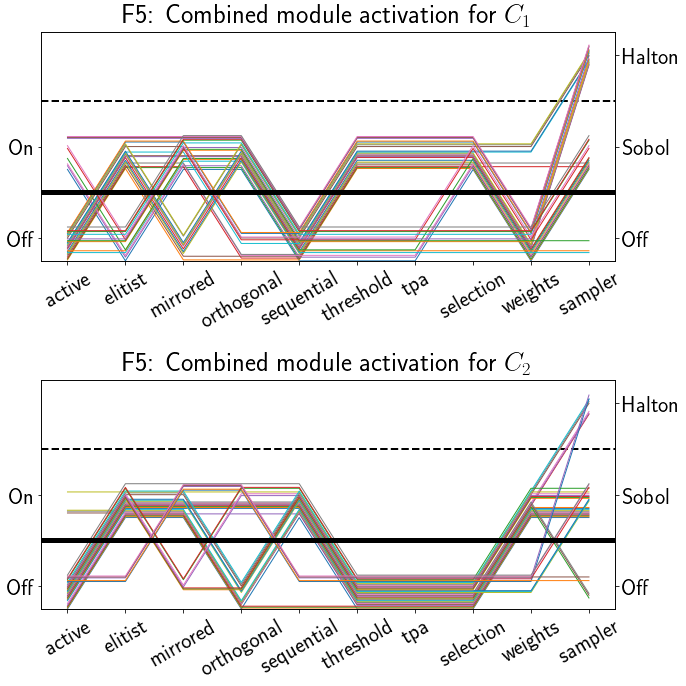

...

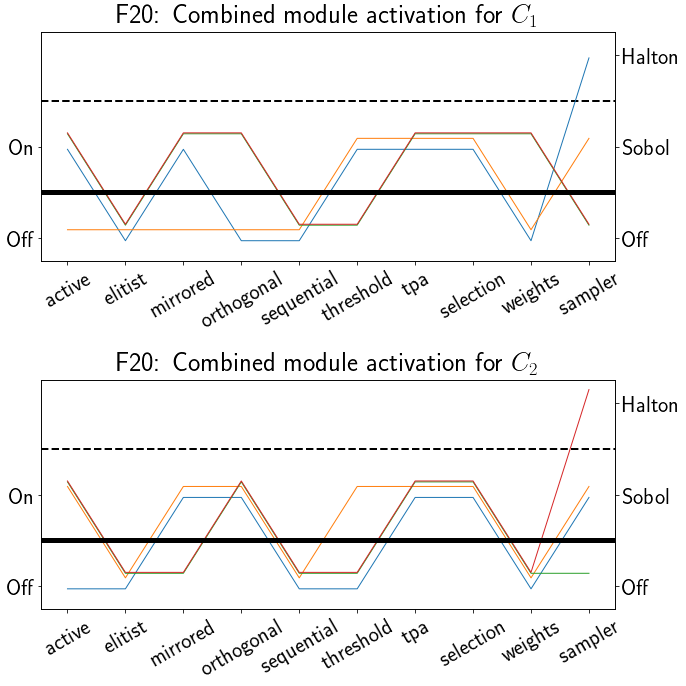

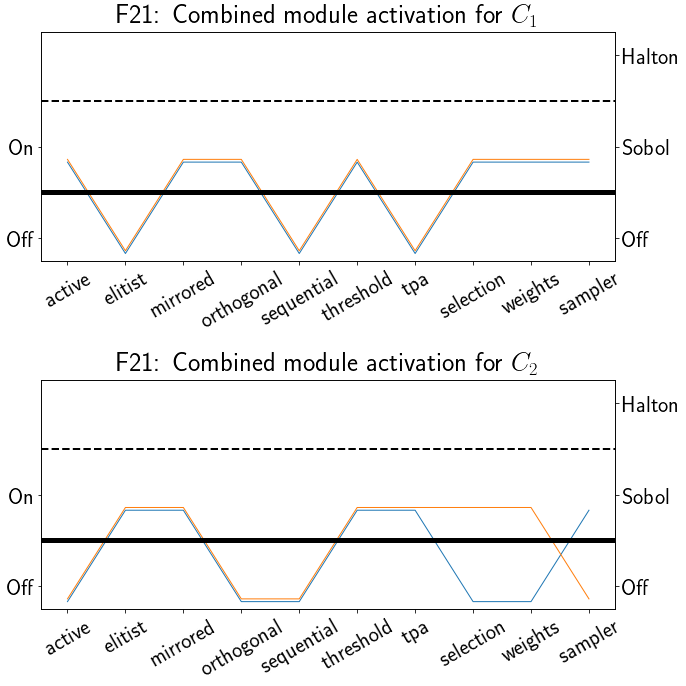

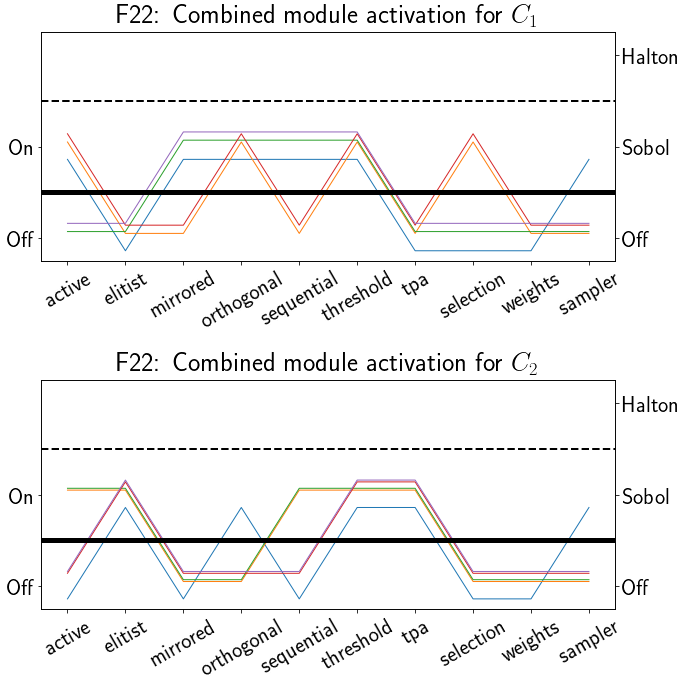

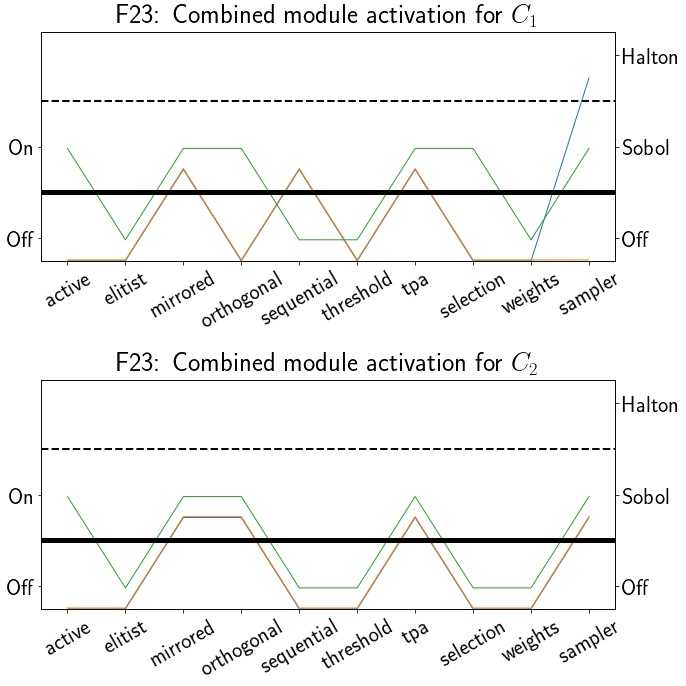

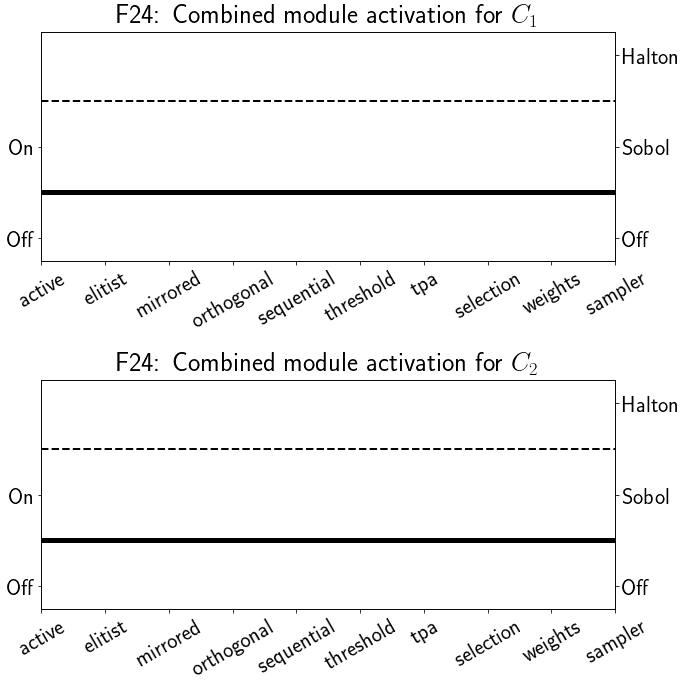

In [139]:
for fid in fids_new:
    plot_combined_module_activation_impr(fid)

In [116]:
data_static,table_split = load_data_50_50_exp(1)
min(data_static['ERT'])
[i  for i in range(len(table_split['Achieved ERT'])) if table_split['Achieved ERT'][i] < min(data_static['ERT'])]
table_split

,C1,C2,Splitpoint,Predicted ERT,Achieved ERT
0,10110111000,110010010,10e-0.4,421.9,487.7
1,10110111020,110010010,10e-0.4,421.9,487.7
2,10110111010,110010010,10e-0.4,423.8,484.7
3,10110111020,110011010,10e-0.4,424.6,471.3
4,10110111000,110011010,10e-0.4,424.6,471.3
5,10110111010,110011010,10e-0.4,426.5,472.8
6,10110111020,10110011010,10e-0.2,426.7,458.2
7,10110111000,10110011010,10e-0.2,426.7,458.2
8,10110111010,10110011010,10e-0.4,429.6,470.9
9,10110111110,10110010010,10e0.0,436.5,529.8


# Appendix

There are many more interesting results which we found during this research, but not all of them were relevant to the story. Some of them are available here in this notebook, while some earlier version can be found in the other notebooks, available on [this repository](https://git.liacs.nl/s1603094/adaptive_CMA-ES_data_processing.git).

These sections contain few comments, and no real discussion of the results obtained.

## Figure illustrating the adaptive approach

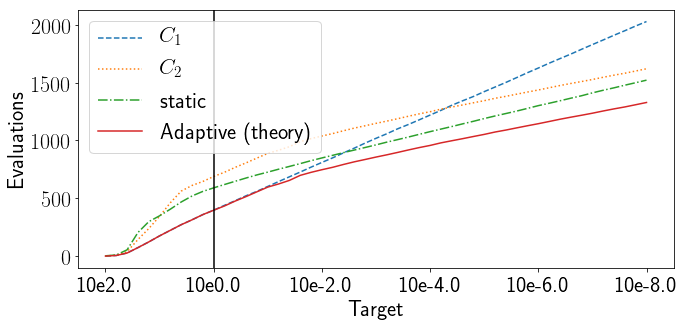

In [116]:
fid = 5
data = load_data(fid,"worstcase")
item = get_table_item(fid,"worstcase")
plt.figure(figsize=(10,5))
stops1 = calcAllStops(data['part1']['fitness'])
plt.plot(np.mean(stops1,axis=0),label="$C_1$",ls='--')
stops2 = calcAllStops(data['part2']['fitness'])
plt.plot(np.mean(stops2,axis=0),label="$C_2$",ls=':')
stopst = calcAllStops(data['static']['fitness'])
plt.plot(np.mean(stopst,axis=0),label="static",ls='-.')
stopsp = calcAllStops(data['split']['fitness'])
# plt.plot(np.mean(stopsp,axis=0),label="Adaptive")

means2 = np.mean(stops2,axis=0)
adaptive = np.mean(stops1,axis=0)

split = int(5*(2-item[1]))
for i in range(51-split):
    adaptive[split+i] = adaptive[split] - means2[split] + means2[split+i]
    
plt.plot(adaptive,label="Adaptive (theory)")
plt.axvline(split,color='k')
plt.legend()
plt.xticks([10*i for i in range(6)],[f"10e{powers[10*i]}" for i in range(6)])
plt.xlabel("Target")
plt.ylabel("Evaluations")
# plt.yscale("log")
plt.tight_layout()
plt.savefig("Adaptive_example.pdf")
plt.show()

## Instance based splitpoint determination<a id='instance'></a>


Since the instance of the function might have significant effect on the optimization landscape and thus on the performance of the different CMA-ES, we wanted to figure out if it was possible to do our split-configuration calculations on an (function,instance) basis instead of only on a function basis. 

Before we do this, we wanted to measure the actual effect of instances on the performance of the configurations

### Influence of instance on performance

We first define a function to determine for a specific function the mean performance (over all configurations) on every instance. 

In [64]:
def get_instance_means(fid):
    df = get_data(5,fid)
    dfmeans2 = df.groupby(by=['Representation', 'ndim', 'function ID','instance ID']).mean()
    item = get_table_item(fid,"worstcase")
    target = f"10e{item[2]}"
    # print(len(dfmeans2))
    means2_target = dfmeans2[target]
    m2a = np.array(means2_target)
    p2a = [[m2a[5*i+j] for i in range(4608)] for j in range(5) ]
#     print([np.sum([x[i] != x[i] for i in range(4608)]) for x in p2a])
    return np.nanmean(p2a,axis=1)



We can now use the mean performance over all configurations to determine the variance between the different instances.

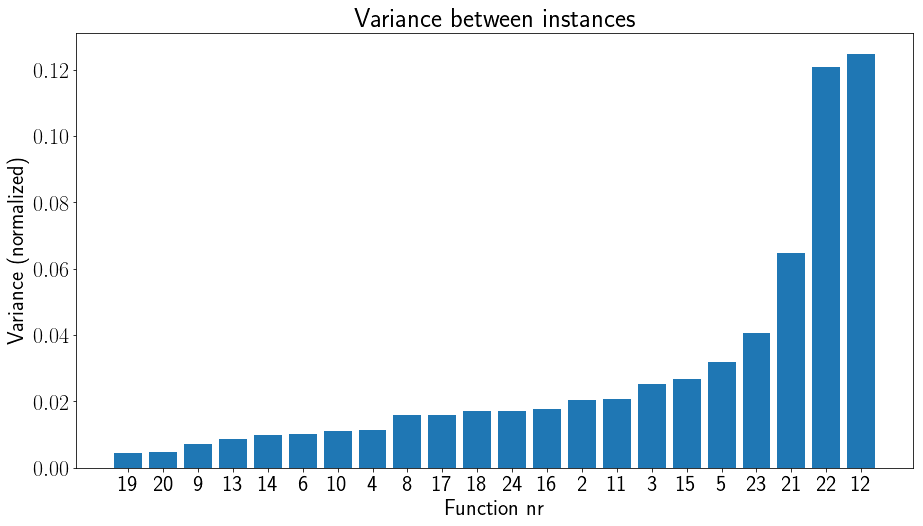

In [51]:
means = []
for i in fids:
    means.append(get_instance_means(i))
iids_means = np.array(means)
iids_thing = [(np.std(means[i]))/max(means[i]) for i in range(len(fids)) ]
order = np.argsort(iids_thing)
plt.figure(figsize=(15,8))
plt.bar(range(len(fids)),sorted(iids_thing))
plt.title("Variance between instances")
plt.xlabel("Function nr")
plt.ylabel("Variance (normalized)")
plt.xticks(range(len(fids)),[fids[i] for i in order])
plt.show()

From this figure, we can see that instance seems to have a relatively small variance for most functions, with some noticable outliers in the more difficult functions. This indicates that an instance-based approach might work, especially for the more difficult functions.

### Method

For the instance based splitpoint determination, we use the same approach as for the standard splitpoint determination, choosing the Worstcase method with a sliding window, since this seemed to have the best performance.

First, we define some instance-base variants of previously defined functions.

In [53]:
configs_to_consider = [3*i for i in range(int(4608/3))]
def get_best_static(fid,iid,target):
    df = get_data(ndim=5,fid=fid)
    df = df.replace(np.nan,np.inf)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID', 'instance ID']).mean()
    targetmeans = dfmeans[f"10e{target}"]
    tmiid = [targetmeans[5*i + iid] for i in configs_to_consider]
    return 3*np.nanargmin(tmiid),np.nanmin(tmiid)

In [54]:
def get_mean_perf(fid,iid,target,split,idx1,idx2):
    df = get_data(ndim=5,fid=fid)
    df = df.replace(np.nan,np.inf)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID', 'instance ID']).mean()
    splitp1 = dfmeans[f"10e{split}"][idx1*5+iid]
    splitp2 = dfmeans[f"10e{split}"][idx2*5+iid]
    valp2 = dfmeans[f"10e{target}"][idx2*5+iid]
    val = valp2 - splitp2 + splitp1
    return val

As was the case with the normal splitpoint determination, we again use the `splitpoint_generation.py`-file for the computation itself. This gives us the table `overview_instancebased_WW.csv`, which we first need to postprocess slightly before using it.

The newly created table is shown below, and shows for every (function,instance) pair the calculated split configuration.

In [55]:
table_instances = pd.read_csv(data_location + "overview_instancebased_WW.csv",index_col=0)
table_instances = table_instances.drop(columns = ['static_value','Static index', 'improvement possible (worstcase)', 'improvement possible (mean)'])
table_instances['target'] = powers[table_instances['target']]
table_instances['split'] = powers[table_instances['split']]


In [216]:
# table_instances = table_instances.assign(static_value=static_vals)
# table_instances = table_instances.assign(Static_index=static_idxs)
# table_instances = table_instances.assign(improvement_possible=imprs)
# table_instances['split_value'] = split_vals
table_instances = table_instances.rename(columns={"Static_index" : "Static index"})
table_instances.to_csv("instance_based_WW_cleaned.csv")
pd.set_option('precision', 2)
table_instances

,ndim,fid,iid,target,$C_1$ index,$C_{\Gamma}$ index,split,split_value,static_value,Static index,improvement_possible
0,5,2,0,-8.0,1263,2166,0.2,968.0,1255.0,1275,2.29e-01
1,5,2,1,-8.0,396,1299,0.2,1038.4,1340.4,3570,2.25e-01
2,5,2,2,-8.0,3576,2172,0.4,962.2,1234.6,1263,2.21e-01
3,5,2,3,-8.0,402,2175,0.2,1042.4,1291.6,1266,1.93e-01
4,5,2,4,-8.0,2706,42,0.2,990.0,1304.6,1275,2.41e-01
5,5,3,0,0.0,2922,2922,1.6,13248.0,13248.0,2922,0.00e+00
6,5,3,1,0.0,615,879,1.6,4274.8,4451.0,879,3.96e-02
7,5,3,2,0.0,3219,585,0.8,7367.0,10270.8,585,2.83e-01
8,5,3,3,0.0,759,2892,1.6,3404.2,3468.4,2892,1.85e-02
9,5,3,4,0.0,2892,1023,1.6,18815.2,18947.8,1023,7.00e-03


In this table, the column `improvement_possible` is the worstcase-sliding window improvement instead of the average improvement.
The code below calculates the mean improvement instead.

In [ ]:
static_idxs = []
static_vals = []
imprsth = []
split_vals = []
table_instances = pd.read_csv("instance_based_WW_cleaned.csv")
for idx in range(len(table_instances)):
    idx_st, val_st = get_best_static(table_instances['fid'][idx],
                                     table_instances['iid'][idx],
                                     table_instances['target'][idx])
    
    val = get_mean_perf(table_instances['fid'][idx],
                        table_instances['iid'][idx],
                        table_instances['target'][idx],
                        table_instances['split'][idx],
                        table_instances['$C_1$ index'][idx],
                        table_instances['$C_{\Gamma}$ index'][idx])
    
    impr = 1-(val/val_st)
#     print(impr)
    static_idxs.append(idx_st)
    static_vals.append(val_st)
    imprsth.append(impr)
    split_vals.append(val)

We visualize these expected mean improvements in the figure below.

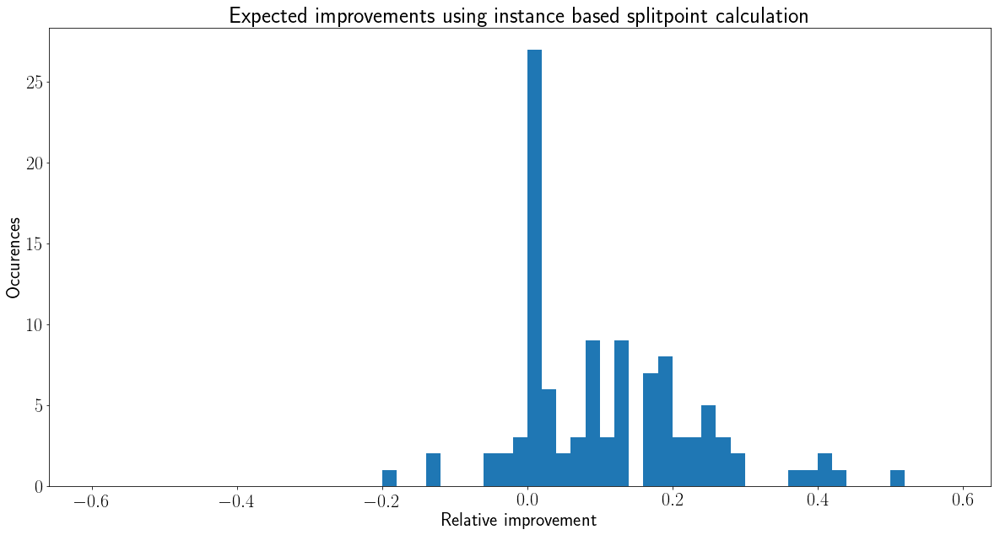

In [104]:
plt.figure(figsize=(20,10))
plt.hist(imprsth,bins=[-0.6+i*0.02 for i in range(60)])
plt.xlabel("Relative improvement")
plt.ylabel("Occurences")
plt.title("Expected improvements using instance based splitpoint calculation")
plt.show()


In this figure, we plotted a histogram of the expected improvements of the instance-based split configurations compared to the instance-based best static configurations. As can be seen in this figure, some (function,instance)-pairs give negative expected improvement, but in general the expected improvement is quite high when compared to the original function-based split configuratons. 

However, we should note that the variance plays a much higher role in these instance-based calculations, since we only have 5 runs for ever (function,instance)-pair.

### Empirical results

We now repeat the process of the function-based split-configurations for the instance-based ones.


During the running of these split-configurations, there were some slight issues which we did not know how to resolve. We decided to ignore these failed runs and only look at those which did succeed.

First, we load the data. We have 5 failed runs: F4 Instance 1, F8 Instance 0, F9 Instance 0, F16 Instance 0, F18 Instance 4. Because something went wrong during the execution of these split configurations, we do not have the data available for these instances, we we ignore them.

For all other runs, we calculate the improvement over the static configuration for that instance

In [ ]:
imprs = []
for fid in fids:
    for iid in range(5):
        idx = [x for x in range(len(table_instances)) if table_instances[x][0] == fid and table_instances[x][-1] == iid][0]

        try:
            data = load_data_instanced(fid,iid)

            stopssplit = calcStopVals(data['split']['fitness'],10**table_instances[idx][2])
            stopsst = calcStopVals(data['static']['fitness'],10**table_instances[idx][2])
            imprs.append(1-(calcERT(stopssplit)/calcERT(stopsst)))
            
        except:
            print(f"Error with F{fid}, iid {iid}; index {idx}")

We compare the predicted improvement to the achieved improvements in the histogram below

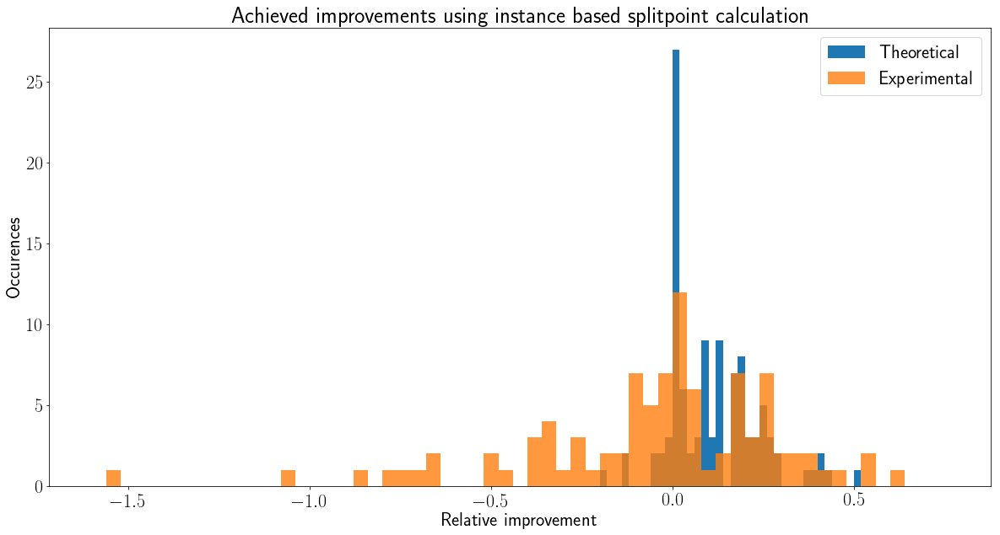

In [108]:
plt.figure(figsize=(20,10))
plt.hist(imprsth,bins=[-0.6+i*0.02 for i in range(60)],label="Theoretical")
plt.hist(imprs,bins=[-1.6+i*0.04 for i in range(60)],label="Experimental",alpha=0.8)
plt.xlabel("Relative improvement")
plt.ylabel("Occurences")
plt.title("Achieved improvements using instance based splitpoint calculation")
plt.legend()
plt.show()

From this histogram, we can see that for some function-instance pairs this method seems to work, but in general the expected improvement is not achieved.

We decided not to look into instance-based splitpoint determination in more detail, since we assume that much more data would be needed to accurately determine good instance-based split configurations.

## Invesitgate sphere-killers

This section looks at so-called "sphere-killers", which are configurations which perform well on F1 (the sphere function). 
This might give some insight into commonalities in these kind of configurations, and might lead to a class of split configurations which switch to a sphere-killer at some point.

First, we will look at the distribution of ERTs for the static configuraions

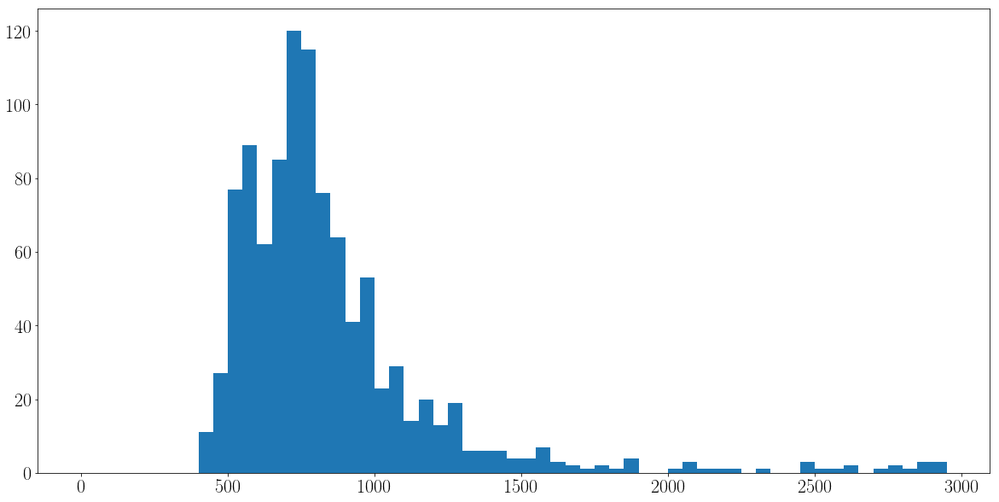

In [51]:
df = get_data(5,1)
dfmeans = np.array(df.groupby(by=['Representation', 'ndim', 'function ID']).mean()['10e-8.0'])
dfmeans_tc = [dfmeans[3*i] for i in range(int(4608/3))]
plt.figure(figsize=(20,10))
plt.hist([i for i in dfmeans_tc if i == i],bins=[0+50*i for i in range(60)])
plt.show()


Next, we look at the commonalities in the top 50 best static configurations

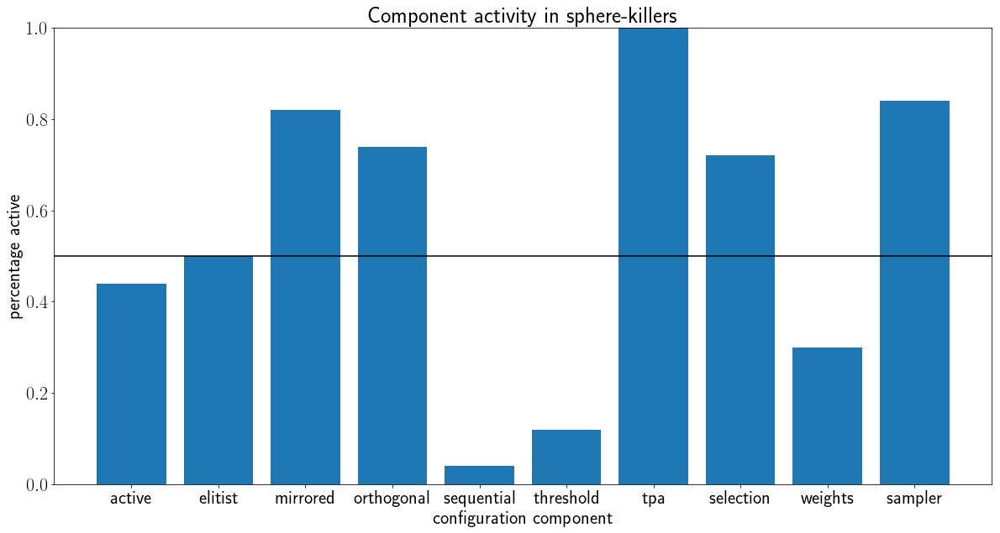

In [240]:
df = get_data(5,1)
dfmeans = np.array(df.groupby(by=['Representation', 'ndim', 'function ID']).mean()['10e-8.0'])
dfmeans_tc = [dfmeans[3*i] for i in range(int(4608/3))]
sortedidx = np.argsort(dfmeans_tc)*3

totals = []
total = 0
for i in range(10):
    for j in sortedidx[:50]:
        if(intToRepr(j)[i] != 0):
            total +=1
    totals.append(total)
    total=0

perc_config = [x/50 for x in totals]

#     
plt.figure(figsize=(20,10))
plt.bar(range(10),perc_config)
plt.axhline(0.5, color='black')
plt.xlabel("configuration component")
plt.ylabel("percentage active")
plt.ylim(0,1)
plt.xticks(range(10),conf_names[:10])
plt.title("Component activity in sphere-killers")
plt.show()

We will now look at the relation between components in these top 50 configurations, using the heatmap below.
This heatmap indicates whether components are always different (-1), always the same (1) or anything inbetween.

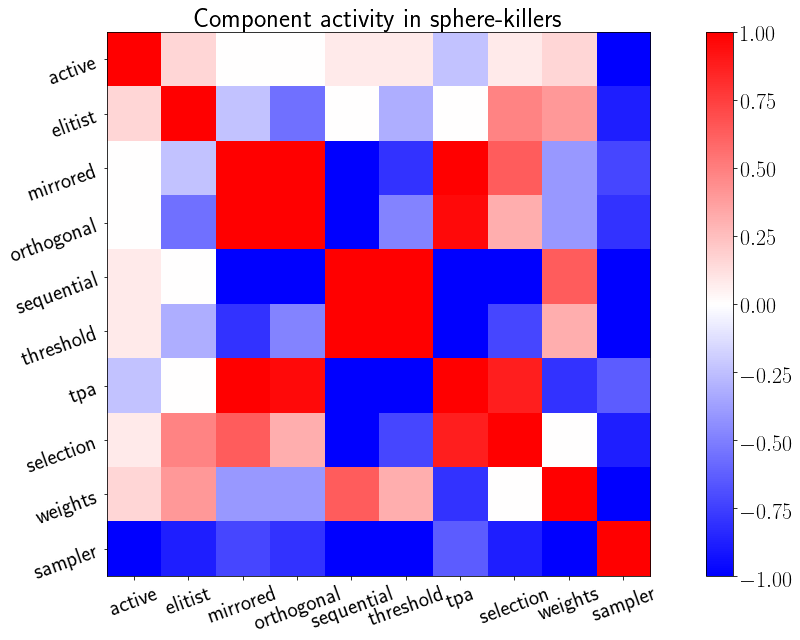

In [241]:
df = get_data(5,1)
dfmeans = np.array(df.groupby(by=['Representation', 'ndim', 'function ID']).mean()['10e-8.0'])
dfmeans_tc = [dfmeans[3*i] for i in range(int(4608/3))]
sortedidx = np.argsort(dfmeans_tc)*3

totals = np.zeros((10,10))
total = 0
for i in range(10):
    for k in range(10):
        for j in sortedidx[:50]:
            if(intToRepr(j)[i] == intToRepr(j)[k]):
                total += 0.04
            else:
                total -= 0.04
        totals[i,k] = total
        total=0


#     
plt.figure(figsize=(20,10))
plt.imshow(totals,cmap="bwr",vmin=-1,vmax=1)
plt.title("Component activity in sphere-killers")
plt.colorbar()
plt.xticks(rotation=20)
plt.yticks(rotation=20)

plt.xticks(range(10),conf_names[:10])
plt.yticks(range(10),conf_names[:10])

plt.show()

## Parameter value analysis at point of split

This section studies the parameter values which we store for most of our experiments. We look at the covariance matrix and mean searchpoint at the moment of switching configurations (or the point at which the switch would have occured, when considering static configurations).


### Covariance matrices

Here, we plot the average covaraince matrices at the time the split would have occured. We do this on an instance basis since the landscape (and thus the covariance matrix) differs per instance.

In [58]:
def plot_mean_CM(fid,method):
    data = load_data(fid,method)
    item = get_table_item(fid,method)
    print(data['part1']['CM'].shape)
    print(data['part2']['CM'].shape)

    CM1 = data['part1']['CM'].reshape(5,50,5,5)
    CM2 = data['part2']['CM'].reshape(5,50,5,5)

    CM1mean = np.mean(CM1,axis=(1))
    CM2mean = np.mean(CM2,axis=(1))

    fig, axs = plt.subplots(3,5,figsize=(30,50),sharey=True,sharex=True)
#     fig.subplots_adjust(hspace = 0.1, wspace=.5)
    fig.set
    fig.suptitle(f"F{fid}: mean covariance matrices for all instances")
    axs = axs.ravel()
    # fig.title("5 covariance martrices for different configurations")


    min1 = min(np.min(CM1mean),np.min(CM1mean))
    max1 = max(np.max(CM2mean),np.max(CM2mean))
    abs1 = max(abs(min1),max1)
    for i in range(5):
        axs[i].set_title(f"Instance nr {i}\n Part 1")
        im0 = axs[i].imshow(CM1mean[i],cmap="bwr",vmin=-abs1,vmax=abs1)
        axs[5+i].set_title(f"Part 2")
        im1 = axs[5+i].imshow(CM2mean[i],cmap="bwr",vmin=-abs1,vmax=abs1)
        axs[10+i].set_title(f"Differenct (Part1 - Part2)")
        im2 = axs[10+i].imshow(CM1mean[i]-CM2mean[i],cmap="bwr",vmin=-abs1,vmax=abs1)


    fig.colorbar(im0,ax=axs[4],fraction=0.046, pad=0.04)
    fig.colorbar(im1,ax=axs[9],fraction=0.046, pad=0.04)
    fig.colorbar(im2,ax=axs[14],fraction=0.046, pad=0.04)

    fig.tight_layout()

(250, 25)
(250, 25)


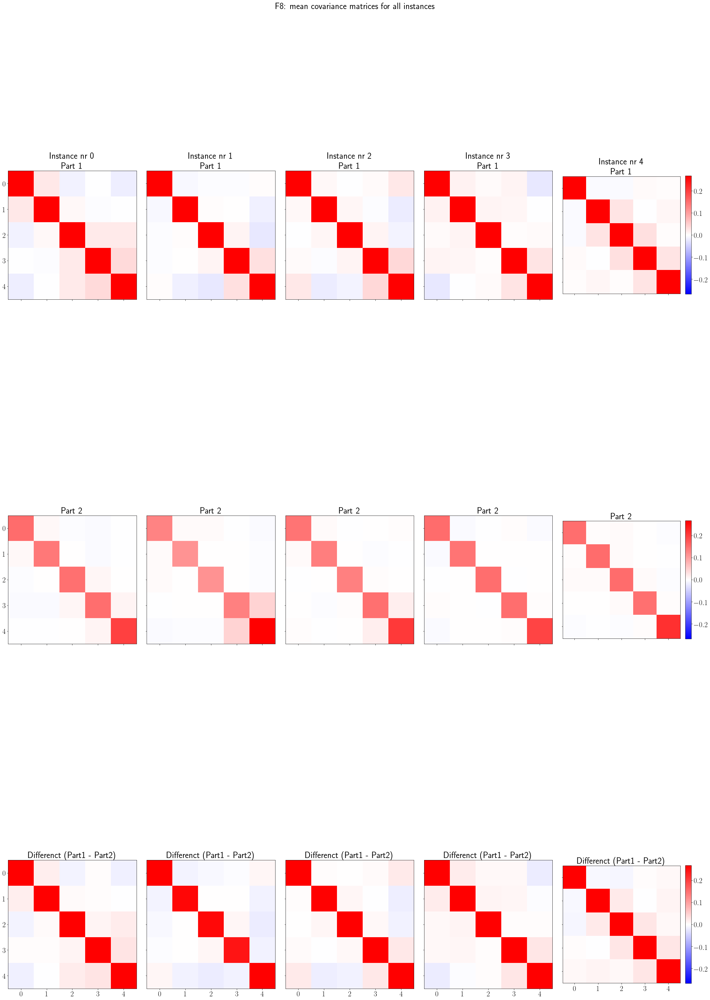

In [60]:
plot_mean_CM(8,"worstcase")

### Searchpoint history

Here, we plot the location of the center of the population at the point the split would occur.

This is done for one instance, and the contours shown are for this instance, with 2 variable coordinates and the other coordinates fixed to those of the optimum.

In [65]:
def get_contour(fid,iid,ax0,ax1):
    return np.load(data_location + contours_folder + file_name_contours.format(fid=fid,iid=iid,ax0=ax0,ax1=ax1)).reshape(100,100)

In [66]:
def plot_mean_searchpoint(fid,method,instance=0):
    data = load_data(fid,method)
    item = get_table_item(fid,method)
    fig, axs = plt.subplots(5,5,figsize=(15,15),sharex=True,sharey=True)
    # fig.subplots_adjust(hspace = .5, wspace=.5)
    fig.set
    axs = axs.ravel()

    colors = ['r','g','b','k','y']

    nr_per_inst = 50

    vmin = np.min([get_contour(fid,instance,i,0) for i in range(1,5)])
    vmax = np.max([get_contour(fid,instance,i,0) for i in range(1,5)])
    
    gen_size1 = data['part1']['gen_size'].reshape(5,50)[instance,0][0]
    gen_size2 = data['part1']['gen_size'].reshape(5,50)[instance,0][0]
    
    splits = np.array(calcStopVals(data['split']['fitness'],10**item[1])).reshape(5,50)[instance]
    splitsp2 = np.array(calcStopVals(data['part2']['fitness'],10**item[1])).reshape(5,50)[instance]

    splits1 = [int(splits[i]/gen_size1) for i in range(nr_per_inst)]
    splits2 = [int(splitsp2[i]/gen_size2) for i in range(nr_per_inst)]
    
    search1 = data['part1']['Search'].reshape(5,50)[instance]
    search2 = data['part2']['Search'].reshape(5,50)[instance]
    
#     splits1 = [min(len(search1[i])-1,splits1[i]) for i in range(nr_per_inst) ]
#     splits2 = [min(len(search2[i])-1,splits2[i]) for i in range(nr_per_inst) ]
    
    for i in range(5):
        for i2 in range(5):
            if i!=i2:
                axs[5*i2+i].contourf(np.arange(-5,5,0.1),np.arange(-5,5,0.1),get_contour(fid,instance,i2,i),alpha=0.4,extend="both",vmin=vmin,vmax=vmax)

            for j in range(nr_per_inst):
                if i!=i2:
                   
                    axs[5*i2+i].scatter([search1[k][splits1[k]][i] for k in range(nr_per_inst)], 
                                [search1[k][splits1[k]][i2] for k in range(nr_per_inst)],
                                12.5,alpha=1,color='red')
                    axs[5*i2+i].scatter([search2[k][splits2[k]][i] for k in range(nr_per_inst)], 
                                [search2[k][splits2[k]][i2] for k in range(nr_per_inst)],
                                12.5,alpha=1,color='blue')
#                     axs[5*i2+i].scatter([search1[k][-1][i] for k in range(nr_per_inst)], 
#                                 [search1[k][-1][i2] for k in range(nr_per_inst)],
#                                 322.5,alpha=1,color='k',marker='x')

            axs[5*i2+i].set_title(f"Projection {(i,i2)}")
            axs[5*i2+i].set_xlim(-5,5)
            axs[5*i2+i].set_ylim(-5,5)
            axs[5*i2+i].set_xticks([-5,-2.5,0,2.5,5])
            axs[5*i2+i].set_yticks([-5,-2.5,0,2.5,5])
            if i2 == 4:
                axs[5*i2+i].set_xlabel(f"$X_{i}$-axis")
            if i == 0:
                axs[5*i2+i].set_ylabel(f"$X_{i2}$-axis")

    fig.suptitle(f"F{fid}: Mean location of search point at the moment of splitting; instance {instance}")

#### Visualization

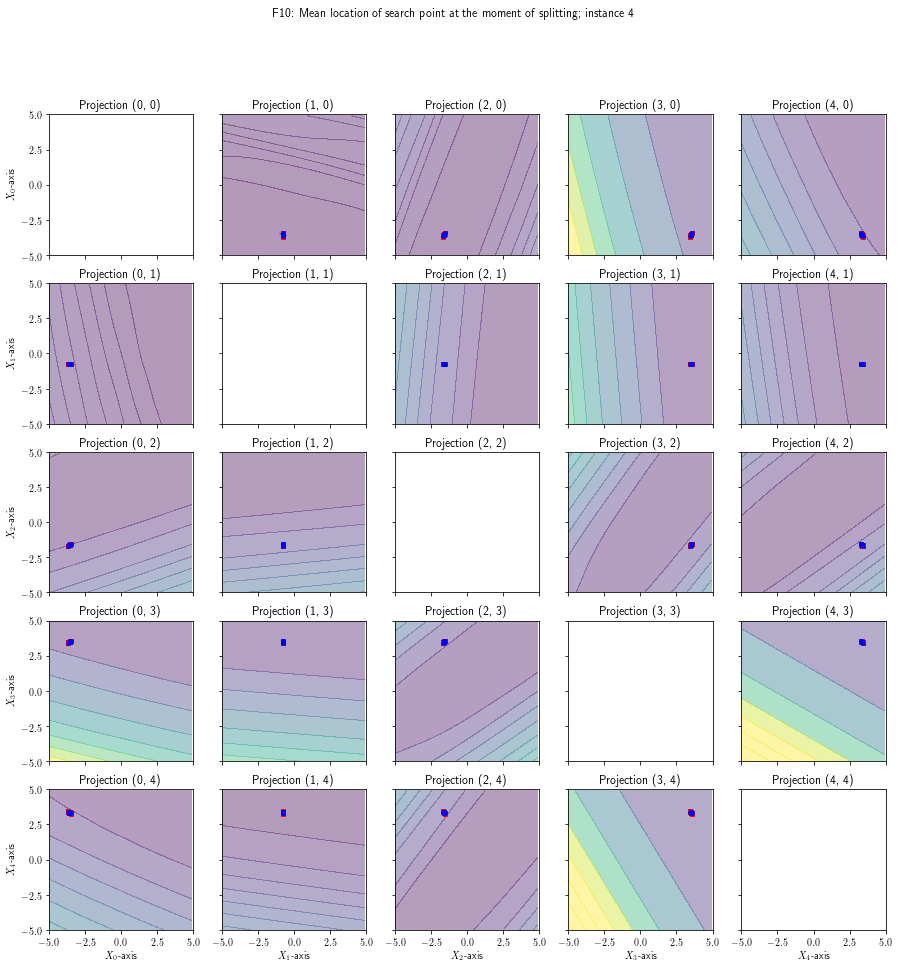

In [147]:
plot_mean_searchpoint(10,"worstcase",4)

## Study degeneration of parameters

The CMA-ES framework contains a catch for degenerated parameters, for example when the stepsize gets too large or small to be usefull. If a degeneration of parameters is detected, some parameters (inculding stepsize) are reset.

We noticed that this resetting of the stepsize might cause the optimizer to never recover and continue degenerating constantly. 
A smarter way of managing parameter degeneration might help the performance of the CMA-ES, but since we ran all configurations on the same framework with the same type of degeneration, we decided not to spend much time investigation this.

In [102]:
fid = 13
data = load_data(fid,"worstcase")
st_idx = np.argmin(results2["ST-nonF"][fid])
method = methodskeys[st_idx]
data_st = load_data(fid,method)
sigmasST = data_st['static']['Sigma']
sigmasSP = data['split']['Sigma']
degensST = []
degensSP = []

for i in range(250):
    s = sigmasST[i]
    s2 = sigmasSP[i]
    degenST = [1 for j in s[1:] if j == 1]
    degenSP = [1 for j in s2[1:] if j == 1]

    degensST.append(sum(degenST))
    degensSP.append(sum(degenSP))

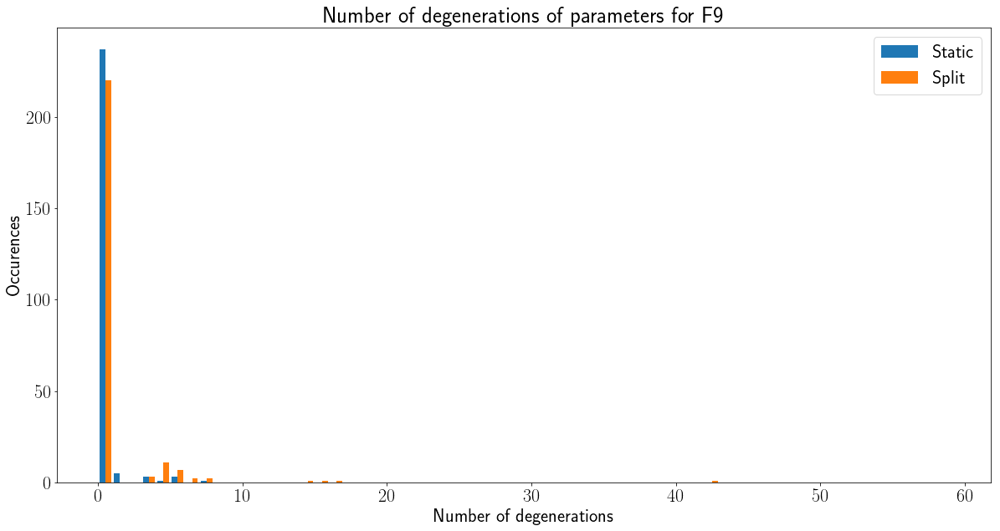

In [97]:
bins = [i for i in range(60)]
plt.figure(figsize=(20,10))
plt.hist([degensST,degensSP],bins=bins)
plt.legend(["Static","Split"])
plt.title(f"Number of degenerations of parameters for F{fid}")
plt.xlabel("Number of degenerations")
plt.ylabel("Occurences")
plt.show()

# plt.hist(degensStatic)

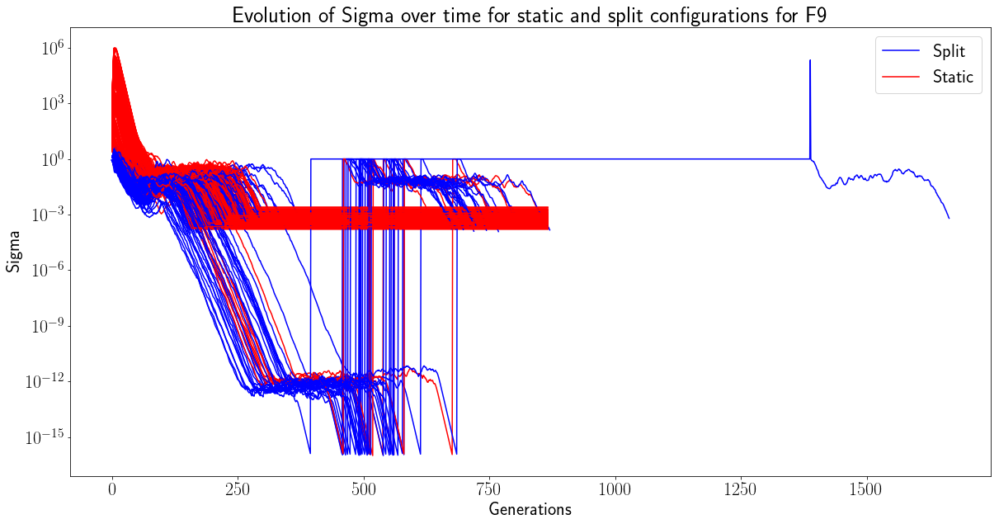

In [100]:
plt.figure(figsize=(20,10))
for i in range(250):
    plt.plot(data['split']['Sigma'][i],color='b')
    plt.plot(data_st['static']['Sigma'][i],color='r')
plt.legend(["Split","Static"])
plt.yscale('log')
plt.title(f"Evolution of Sigma over time for static and split configurations for F{fid}")
plt.xlabel("Generations")
plt.ylabel("Sigma")
plt.show()

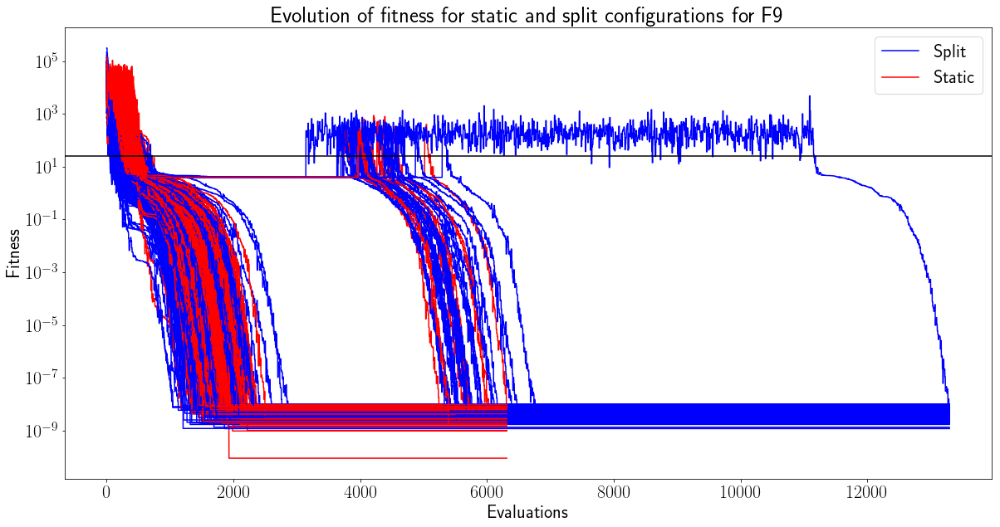

In [99]:
plt.figure(figsize=(20,10))
for i in range(50):
    plt.plot(data['split']['fitness'][i],color='b')
    plt.plot(data['static']['fitness'][i],color='r')
plt.legend(["Split","Static"])
item = get_table_item(fid,"worstcase")
plt.axhline(10**item[1],color='k')
plt.yscale('log')
plt.title(f"Evolution of fitness for static and split configurations for F{fid}")
plt.xlabel("Evaluations")
plt.ylabel("Fitness")
plt.show()

## Relation of variance to performance

In previous sections, we studied the variance present in the data and claimed that it can negatively effect the performance of the split configurations. In this section, we aim to verify these claims by relating the variance of the components of the split configurations to the performance achieved.

In [61]:
vals = []
for fid in fids:
    df = get_data(5,fid)
    impr = results2["W-impr"][fid]
    item = get_table_item(fid,"worstcase")
    idx1 = item[4]
    idx2 = item[5]
    target = f"10e{item[2]}"
    split = f"10e{item[1]}"
#     dfstdssplit = np.array(df.groupby(by=['Representation', 'ndim', 'function ID']).std()[split])
#     dfmeanssplit = np.array(df.groupby(by=['Representation', 'ndim', 'function ID']).mean()[split])
#     dfstds = np.array(df.groupby(by=['Representation', 'ndim', 'function ID']).std()[target])
#     dfmeans = np.array(df.groupby(by=['Representation', 'ndim', 'function ID']).mean()[target])
    
#     dfa = np.array(df)[5:]
    vals1split = df[split][25*idx1:25*(1+idx1)]
    vals2split = df[split][25*idx2:25*(1+idx2)]
    vals2stop = df[target][25*idx2:25*(1+idx2)]
    
#     print(fid)
    std1 = np.std(vals1split)/(1+np.mean(vals1split))
    
    vals2 = [x-y for x,y in zip(vals2stop,vals2split)]
    
    std2 = np.std(vals2)/np.mean(vals2)

    
    vals.append((std1,std2,impr))

The following graph shows the relation of the normalized variance (in terms of AHT) for both $C_1$ and $C_2$ and the relative improvements measures (as determined in [section 6](#emp)).

R-squared for P1 (ignoring 2 outliers) is 0.12557964269515223 (slope is -0.18155647697423496)
R-squared for P2 (ignoring 2 outliers) is 0.34542043542245365 (slope is -0.1756268240008286)


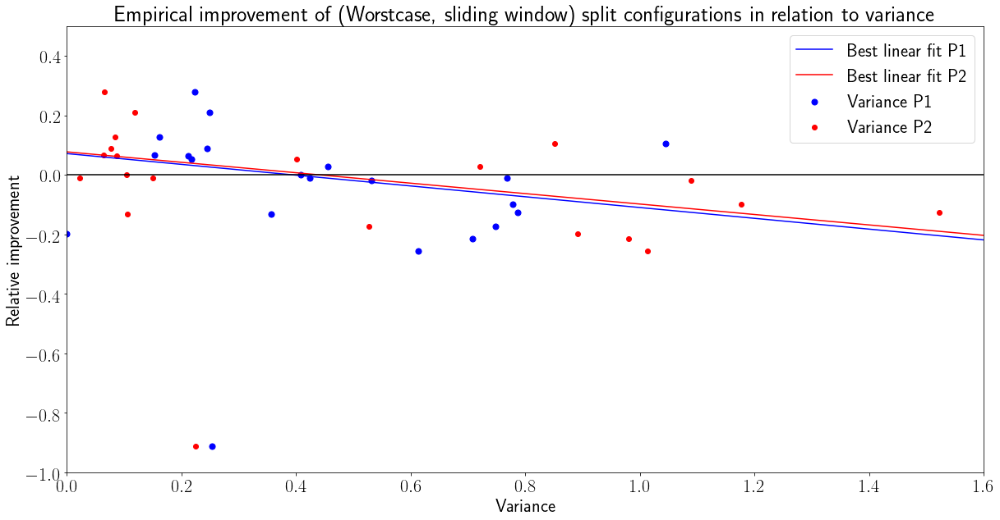

In [78]:


plt.figure(figsize=(20,10))
slope, intercept, r_value, p_value, std_err = stats.linregress([x[0] for x in vals if x[2]>-0.5], [x[2] for x in vals if x[2]>-0.5])
plt.plot(np.arange(0,1.9,0.1),[intercept+x*slope for x in np.arange(0,1.9,0.1)],color='b',label="Best linear fit P1")
print(f"R-squared for P1 (ignoring 2 outliers) is {r_value**2} (slope is {slope})")
slope, intercept, r_value, p_value, std_err = stats.linregress([x[1] for x in vals if x[2]>-0.5], [x[2] for x in vals if x[2]>-0.5])
plt.plot(np.arange(0,1.9,0.1),[intercept+x*slope for x in np.arange(0,1.9,0.1)],color='r',label="Best linear fit P2")
print(f"R-squared for P2 (ignoring 2 outliers) is {r_value**2} (slope is {slope})")

plt.xlim(0,1.6)
plt.scatter([x[0] for x in vals if x[2]>-1],[x[2] for x in vals if x[2]>-1],color='b',label="Variance P1")
plt.scatter([x[1] for x in vals if x[2]>-1],[x[2] for x in vals if x[2]>-1],color='r',label="Variance P2")
plt.legend()
plt.axhline(0,color='k')
# plt.xticks(range(22),results2.index)
plt.xlabel("Variance")
plt.ylabel("Relative improvement")
plt.ylim(-1,0.5)
plt.title('Empirical improvement of (Worstcase, sliding window) split configurations in relation to variance')
plt.show()

The following graph shows the same data, but on a per-function basis.

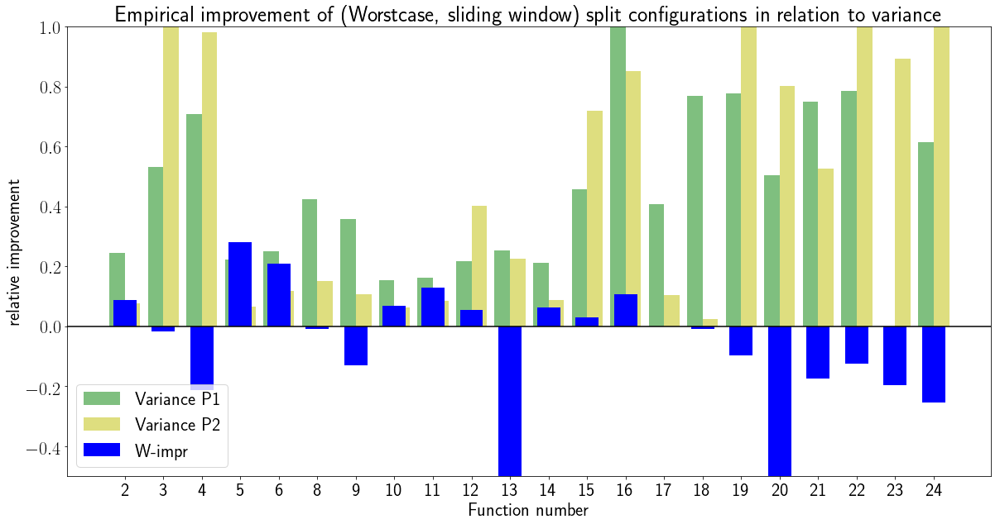

In [375]:
plt.figure(figsize=(20,10))
plt.bar([i-0.2 for i in range(22)],[x[0] for x in vals],width=0.4,color='g',alpha=0.5,label="Variance P1")
plt.bar([i+0.2 for i in range(22)],[x[1] for x in vals],width=0.4,color='y',alpha=0.5,label="Variance P2")
plt.bar([i for i in range(22)],[x[2] for x in vals],width=0.6,color='b',label="W-impr")
plt.legend()
plt.axhline(0,color='k')
plt.xticks(range(22),results2.index)
plt.xlabel("Function number")
plt.ylabel("relative improvement")
plt.ylim(-0.5,1)
plt.title('Empirical improvement of (Worstcase, sliding window) split configurations in relation to variance')
plt.show()

## Explore fitness history for some functions

This function explores the fitness history for all functions we looked at, to get some insight into the differences between functions.

In [55]:
# iid = 4
# fid = 23
def plot_target_history(fid,method, ax=None, zoom_in = False):
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(20,10))
        ax.set_ylabel("Evaluations")
        ax.set_xlabel("Target")
        ax.legend()

    item = get_table_item(fid,method)
    idx1 = item[4]
    idx2 = item[5]
    idxst = item[3]

    configs_to_consider = [i*3 for i in range(int(4608/3))]
    df = get_data(fid=fid,ndim=5)
    df = df.replace(np.nan,np.inf)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID']).mean()
    to_plot = [x[2:] for x in np.array(dfmeans)]
#     to_plot = [to_plot[5*i] for i in range(4608)] 
    # len([to_plot[i] for i in configs_to_consider])
#     plt.figure(figsize=(20,10))
    for i in configs_to_consider:
        ax.plot(to_plot[i],color='b',alpha=0.05)
    ax.plot(to_plot[idx1],color='r',label="Part 1",lw=4)
    ax.plot(to_plot[idx2],color='g',label="Part 2",lw=4)
    ax.plot(to_plot[idxst],color='k',label="Static",lw=4)
#     ax.legend()
    ax.axvline((item[1]-2)*-5,color='k')
    ax.set_xticks([5*i for i in range(11)])

    ax.set_xticklabels([powers[i*5] for i in range(11)])
    ax.set_yscale('log')
#     ax.set_ylabel("Evaluations")
#     ax.set_xlabel("Target")
    ax.set_title(f"F{fid}")
#     ax.show()

    if zoom_in:
        dfa = np.array(df)
        plt.figure(figsize=(20,10))
        for i in range(25):
            plt.plot(dfa[idxst*25+i][5:],color='k')
            plt.plot(dfa[idx1*25+i][5:],color='r')
            plt.plot(dfa[idx2*25+i][5:],color='y')

        # plt.plot(to_plot[idx1],color='r')
        # plt.plot(to_plot[idx2],color='y')
        # plt.plot(to_plot[idxst],color='k')

        plt.axvline((item[1]-2)*-5,color='k')
        plt.xticks([5*i for i in range(11)],[powers[i*5] for i in range(11)])
        # plt.yscale('log')
        plt.ylabel("Evaluations")
        plt.xlabel("Target")
        plt.title(f"F{fid}: Convergence history for selected configurations (using {method} method)")

        plt.show()

# plot_target_history(2,"worstcase")

The following figure shows the hitting times for all functions we considered in this notebook. The black line indicates the best static configuration, while the red and green line indicate the theoretical best $C_1$ and $C_2$ configurations respectively.

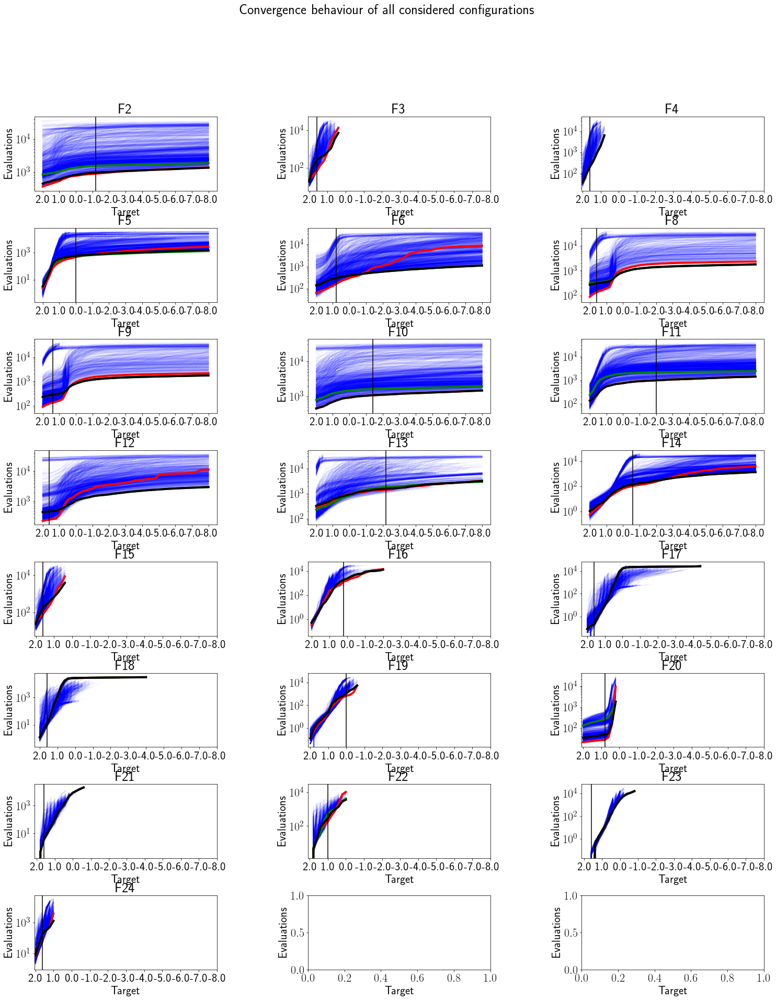

In [60]:
fig, axs = plt.subplots(8,3,figsize=(25,30))
fig.subplots_adjust(hspace = .5, wspace=.5)
fig.set
fig.suptitle("Convergence behaviour of all considered configurations")
axs = axs.ravel()

for i in range(len(fids)):
    plot_target_history(fids[i],"worstcase",ax=axs[i])
    
for ax in axs.flat:
    ax.set(xlabel='Target', ylabel='Evaluations')

In [ ]:
df = get_data(5,23)
impr = results2["W-impr"]
item = get_table_item(23,"worstcase")
idx1 = item[4]
idx2 = item[5]
target = f"10e{item[2]}"
split = f"10e{item[1]}"
# dfstds = np.array(df.groupby(by=['Representation', 'ndim', 'function ID']).std()[target])
# dfmeans = np.array(df.groupby(by=['Representation', 'ndim', 'function ID']).mean()[target])
print(split)
dfa = np.array(df)
vals1 = df[split][25*idx1:25*(1+idx1)]
print(vals1)

The following figure shows the fitness history for the 250 runs for $C_1$ anc $C_2$ (as static configurations) for F9.

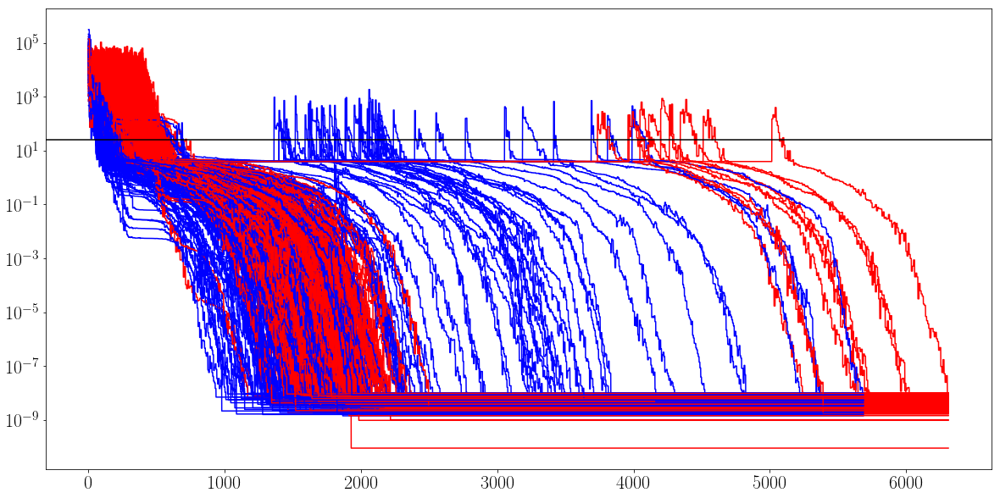

In [73]:
data = load_data(9,"worstcase")
plt.figure(figsize=(20,10))
for i in range(250):
    plt.plot(data['part1']['fitness'][i],color='b')
    plt.plot(data['part2']['fitness'][i],color='r')
plt.axhline(10**1.4,color='k')
plt.yscale('log')

## Calculation of ERT with target $10^{-8}$

Since in all our previous experiment we used targets based on the configuration which had all 25 of its runs hit the target. Instead of this, we can use our new data to calculate the ERT with the target at $10^{-8}$. 

In [42]:
records = []
for fid in fids:
    splitERTs = []
    staticERTs = []
    nonreached = []
    nonreachedST = []
    targets = []
    ths = []
    for method in methods:
#         print(method,fid)
        data = load_data(fid,method)
        
        item = get_table_item(fid,method)
        
        stops = calcStopVals(data['split']['fitness'],10**-8)
        
        sp1 = calcStopVals(data['part1']['fitness'],10**item[1])
        sp2 = calcStopVals(data['part2']['fitness'],10**item[1])
        st2 = calcStopVals(data['part2']['fitness'],10**-8)

        theoretical = [x-y+z for x,y,z in zip(sp1,sp2,st2)]
        
        th = calcERT(theoretical)
        ths.append(th)
        
        splitERTs.append(calcERT(stops))
        nonreached.append(calcNonReached(stops))
        targets.append(item[2])
        
#         print(item)
#         print(stops)
        
        stopsST = calcStopVals(data['static']['fitness'],10**-8)
        staticERTs.append(calcERT(stopsST))
        nonreachedST.append(calcNonReached(stopsST))
        
        
    bestStatic = min(staticERTs)
    imprs = [1-x/bestStatic for x in splitERTs]
    imprsth = [1-x/bestStatic for x in ths]
#     print(splitERTs)
#     print(staticERTs)
#     print(bestStatic)
    records.append((fid,imprs[0],imprs[1],imprs[2],splitERTs[0],splitERTs[1],splitERTs[2],bestStatic,nonreached,nonreachedST,targets,imprsth[0],imprsth[1],imprsth[2]))#,imprs[2]))
    
labels = ["Fid","M-impr","W-impr","MW-impr","M-ERT","W-ERT","MW-ERT","ST-ERT","Split-nonF","ST-nonF","targets","Glueing-M","Glueing-W","Glueing-MW"]#,"Means_window-impr"]
results3 = pd.DataFrame.from_records(records, columns=labels,index='Fid')

C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in long_scalars
  after removing the cwd from sys.path.
C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\lib\site-packages\ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in double_scalars
C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\lib\site-packages\ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in double_scalars


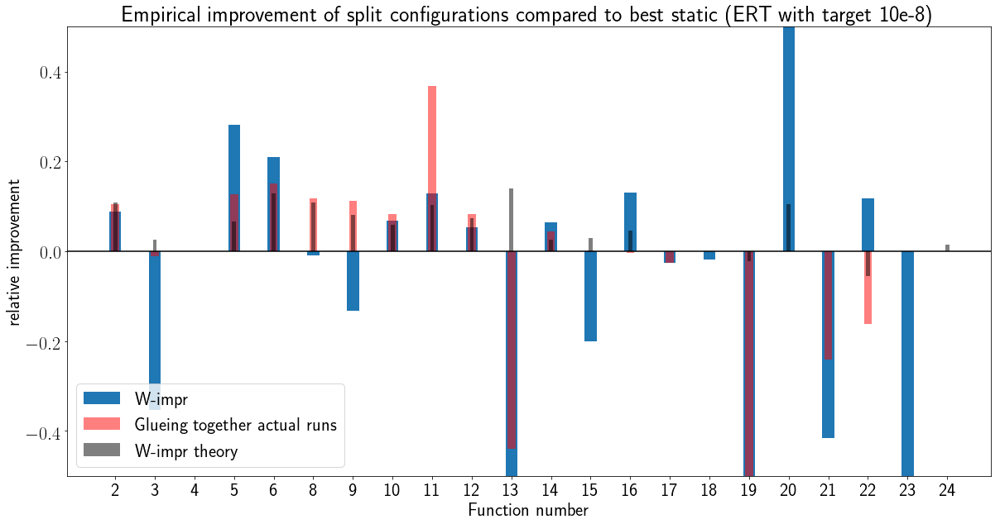

In [71]:
plt.figure(figsize=(20,10))
# plt.bar([i-0.3 for i in range(22)],results['M-impr'],width=0.3,label='M-impr')
plt.bar([i for i in range(22)],results3['W-impr'],width=0.3,label='W-impr')
# plt.bar([i+0.3 for i in range(22)],results['MW-impr'],width=0.3,label='MW-impr')
# plt.bar([i-0.3 for i in range(22)], results2["Glueing-M"],width=0.1,label="Glueing together actual runs",color='k',alpha=0.5)
plt.bar([i for i in range(22)], results3["Glueing-W"],width=0.2,color='r',alpha=0.5,label="Glueing together actual runs")
# plt.bar([i+0.3 for i in range(22)], results2["Glueing-MW"],width=0.1,color='k',alpha=0.5)
plt.bar([i for i in range(22)], resultsth["W-impr"],width=0.1,label="W-impr theory",color='k',alpha=0.5)

plt.legend()
plt.axhline(0,color='k')
plt.xticks(range(22),results2.index)
plt.xlabel("Function number")
plt.ylabel("relative improvement")
plt.ylim(-0.5,0.5)
plt.title('Empirical improvement of split configurations compared to best static (ERT with target 10e-8)')
# plt.savefig("results2.pdf")
plt.show()

In [45]:
results3

,M-impr,W-impr,MW-impr,M-ERT,W-ERT,MW-ERT,ST-ERT,Split-nonF,ST-nonF,targets,Glueing-M,Glueing-W,Glueing-MW
Fid,,,,,,,,,,,,,
2,0.276107,0.088541,0.112113,1.123980e+03,1.415212e+03,1.378612e+03,1.552688e+03,"[0, 0, 0]","[0, 0, 0]","[-8.0, -8.0, -8.0]",0.216432,0.104477,0.102944
3,-0.355922,-0.352458,-0.314083,1.616579e+05,1.612449e+05,1.566698e+05,1.192236e+05,"[183, 183, 181]","[166, 163, 164]","[0.4, 0.4, 0.4]",-0.525588,-0.011308,0.000583
4,NaN,NaN,NaN,inf,inf,inf,inf,"[250, 250, 250]","[250, 250, 250]","[0.8, 0.8, 0.8]",NaN,NaN,NaN
5,0.167722,0.281125,0.167722,1.266288e+03,1.093748e+03,1.266288e+03,1.521472e+03,"[0, 0, 0]","[0, 0, 0]","[-8.0, -8.0, -8.0]",0.097776,0.126832,0.097776
6,-0.129107,0.209490,-0.129107,1.514228e+03,1.060140e+03,1.514228e+03,1.341084e+03,"[0, 0, 0]","[0, 0, 0]","[-8.0, -8.0, -8.0]",0.119133,0.150547,0.119133
8,-0.268334,-0.008650,-0.310241,2.646456e+03,2.104608e+03,2.733896e+03,2.086560e+03,"[0, 0, 0]","[0, 0, 0]","[-8.0, -8.0, -8.0]",0.115095,0.118373,0.127172
9,-0.430681,-0.132112,-0.131368,2.799328e+03,2.215136e+03,2.213680e+03,1.956640e+03,"[0, 0, 0]","[0, 0, 0]","[-8.0, -8.0, -8.0]",0.118154,0.113067,0.114924
10,-1.843078,0.067879,-2.141672,4.495384e+03,1.473840e+03,4.967511e+03,1.581168e+03,"[13, 0, 15]","[150, 0, 154]","[-8.0, -8.0, -8.0]",-0.773935,0.083622,-0.781228
11,0.129726,0.128347,0.129726,1.933951e+03,1.937016e+03,1.933951e+03,2.222232e+03,"[3, 3, 3]","[0, 0, 0]","[-8.0, -8.0, -8.0]",0.361388,0.367854,0.361388


This data implies that for most functions, at least one of the 250 runs did hit the target $10^{-8}$, with F4 and F24 being the exceptions.

## Compare good vs bad performances of 50-50 experiment

This function was part of the original 50-50 experiment and tried to find differences between the split configurations which get improvement and those that do not. However, it was excluded there because the example we studied only saw negative improvements.

In [ ]:
def plot_good_vs_bad_impr_configs(fid):
    ERTs,_,_ = calcERTs_multi(fid)
    goodimprs = []
    badimprs =[]
    for i in range(len(ERTs)):
        if ERTs[i] < results2['ST-ERT'][fid]:
            goodimprs.append(tsorted[i])
        else:
            badimprs.append(tsorted[i])
    c1s = []
    c2s = []
    c1=0
    c2=0
    to_look = goodimprs
    for i in range(10):
        for j in to_look:
            if(intToRepr(j[1])[i] != 0):
                c1 +=1
            if(intToRepr(j[2])[i] != 0):
                c2 +=1
        c1s.append(c1)
        c2s.append(c2)
        c1 = 0
        c2 = 0


    perc_config1 = [x/len(to_look) for x in c1s]
    perc_config2 = [x/len(to_look) for x in c2s]
    plt.figure(figsize=(20,10))
    plt.bar([i-0.2 for i in range(10)],perc_config1,width=0.4,label="Part 1")
    plt.bar([i+0.2 for i in range(10)],perc_config2,width=0.4,label="Part 2")
    plt.axhline(0.5, color='black')
    plt.xlabel("configuration component")
    plt.ylabel("percentage active")
    plt.ylim(0,1)
    plt.xticks(range(10),conf_names[:10])
    plt.title(f"Component activity in {nr_to_check} good splits for F{fid}")
    plt.legend()
    plt.show()

    c1s = []
    c2s = []
    c1=0
    c2=0
    to_look = badimprs
    for i in range(10):
        for j in to_look:
            if(intToRepr(j[1])[i] != 0):
                c1 +=1
            if(intToRepr(j[2])[i] != 0):
                c2 +=1
        c1s.append(c1)
        c2s.append(c2)
        c1 = 0
        c2 = 0


    perc_config1 = [x/len(to_look) for x in c1s]
    perc_config2 = [x/len(to_look) for x in c2s]
    plt.figure(figsize=(20,10))
    plt.bar([i-0.2 for i in range(10)],perc_config1,width=0.4,label="Part 1")
    plt.bar([i+0.2 for i in range(10)],perc_config2,width=0.4,label="Part 2")
    plt.axhline(0.5, color='black')
    plt.xlabel("configuration component")
    plt.ylabel("percentage active")
    plt.ylim(0,1)
    plt.xticks(range(10),conf_names[:10])
    plt.title(f"Component activity in {nr_to_check} bad splits for F{fid}")
    plt.legend()
    plt.show()
    plt.figure(figsize=(20,10))
    bins = range(51)
    plt.hist([int(x[0]) for x in goodimprs],bins=bins)
    plt.hist([int(x[0]) for x in badimprs],bins=bins)
    plt.title(f"Histogram of found splitpoints for F{fid}")
    plt.xlabel("Split")
    plt.ylabel("Occurences")
    plt.legend(["Positive improvement","Negative improvement"])
    plt.xticks([5*i for i in range(11)],[powers[5*i] for i in range(11)])
    plt.show()
    
plot_good_vs_bad_impr_configs(2)

## Splitpoint recalculation

The next function can be used to reprocess the static data generated during the running of the different split configurations to determine if a different splitpoint might have given a better performance.

In [ ]:
def recalculateSplitpoint(fid,method):
    data = load_data(fid,method)
    item = get_table_item(fid,method)
    ERTs = []
    stds = []
    nanstops = []
    stops1 = calcAllStops(data["part1"]['fitness'])
    stops2 = calcAllStops(data["part2"]['fitness'])

    ms1 = np.mean(stops1,axis=0)
    ms2 = np.mean(stops2,axis=0)
    besti = -1
    bestval = np.inf
    
    used_i = int(np.round((item[1]-2)*-5))
    glued = ms1[used_i]-ms2[used_i]+ms2[-1]
    
    for i in range(51):
        comb = ms1[i]-ms2[i]+ms2[-1]
        if comb<bestval:
            besti = i
            bestval = comb
    print(f"F{fid} ({method}): Was original: 10e{item[1]}; recalculated to: 10e{2-(besti/5):.1f}")
    print(f"Glueing at original would give {glued:.1f} but new would give {bestval:.1f}; (impr is {1-bestval/glued:.3f}) ")
#     print(f"10e{item[1]}")
    return f"10e{2-(besti/5):.1f}"

for fid in fids:
    for method in methods.keys():
        recalculateSplitpoint(fid,method)

## Statistical analysis of available data<a id='stats'></a>

Since evolutionary strategies are inherently stochastic processes, we wanted to understand the variance present in the data.
This variance can have a large impact on the performance of the split configurations, because some runs might not be roboust enough to base the split configuration on.


To get some insight, we calculated the variance (in terms of AHT) for all configurations (given they reach the target) and plot them against their performance (AHT). We can then study the relation between mean and variance to determine whether using the mean to calculate splitpoints is a suitable method to deal with variances, or whether we need to specifically keep variance into account when determining the splitpoint.

### Code for figure generation

These functions use a previously generated table of split configurations to be able to show which configurations were eventually chosen by our algorithms.

In [67]:
overview_table = pd.read_csv(data_location + "/overview_table_extended.csv", index_col=0)

relevant_table = [[overview_table["fid"][idx],
overview_table["split"][idx],
overview_table["target"][idx],
overview_table["Static index"][idx],
overview_table["$C_1$ index"][idx],
overview_table["$C_{\Gamma}$ index"][idx],
overview_table["Empirical improvement"][idx],
overview_table["Std split"][idx]] for idx in range(23)]



In [138]:
def scatterplot(table_item,ax = None):
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(20,10))
    ndim = 5
    df = get_data(ndim,table_item[0])
    df = df.fillna(np.inf)

    
    
    dfstds = df.groupby(by=['Representation', 'ndim', 'function ID']).std()
    stds_target = dfstds[table_item[2]]
    stds_target = np.array([stds_target[i] for i in configs_to_consider])
    
    fid = table_item[0]
    target=table_item[2]
    static_idx = table_item[3]
    p1_idx = table_item[4]
    p2_idx = table_item[5]


    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID']).mean()
    means_target = dfmeans[target]
    means_target = np.array([means_target[i] for i in configs_to_consider])
        
    mask = ~np.isnan(stds_target) & ~np.isnan(means_target)
    if(len(stds_target[mask]) > 1):
        slope, intercept, r_value, p_value, std_err = stats.linregress(stds_target[mask], means_target[mask])
        max_val = int(max([i for i in means_target if i < 60000]))
        ax.plot(range(max_val),intercept+range(max_val)*slope,color='r',label="Best linear fit")


    ax.scatter(stds_target,means_target,label="individual configurations")
    ax.set_title("Target {2} for {0}D F{1}".format(ndim,fid,target))

In [118]:
def find_outlier_config(table_item,ax = None, show_scatter = False):
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(20,10))
        
    ndim = 5
    df = get_data(5,table_item[0])
    dfstds = df.groupby(by=['Representation', 'ndim', 'function ID']).std()
    stds_target = dfstds[table_item[2]]

    ndim = 5
    fid = table_item[0]
    target=table_item[2]
    static_idx = table_item[3]
    p1_idx = table_item[4]
    p2_idx = table_item[5]


    df = df.fillna(np.inf)
    dfstds = df.groupby(by=['Representation', 'ndim', 'function ID']).std()
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID']).mean()
    stds_target = dfstds[target]
    means_target = dfmeans[target]
    stds_target = np.array([stds_target[i] for i in configs_to_consider])
    means_target = np.array([means_target[i] for i in configs_to_consider])

    mask = ~np.isnan(stds_target) & ~np.isnan(means_target)
    if(len(stds_target[mask]) < 2):
        return
    slope, intercept, r_value, p_value, std_err = stats.linregress(stds_target[mask], means_target[mask])

    dist_from_linreg = [np.sqrt((intercept+stds_target[i]*slope - means_target[i])**2) for i in range(len(stds_target))]
    dist_from_linreg = [i  if i <np.inf else 0 for i in dist_from_linreg] #.replace(np.inf,np.nan)
    nr_noninf = len(means_target) - np.sum([x>=np.inf for x in means_target])
    perc5 = int(nr_noninf/20)
    outliers = np.argsort(dist_from_linreg)[-perc5:]
#     print(outliers)
    

    indices_config = range(10)
    totals = []
    total = 0
    for i in indices_config:
        for j in outliers:
            if(intToRepr(3*j)[i] != 0):
                total +=1
        totals.append(total)
        total=0

    perc_config = [x/len(outliers) for x in totals]
#     print(len(outliers),perc_config,totals)
#     
    ax.bar(range(10),perc_config)
    ax.axhline(0.5, color='black')
#     if show_scatter:
#         ax.figure(figsize=(20,10))
#         ax.xlabel("configuration component")
#         ax.ylabel("percentage active")
#         ax.ylim(0,1)
#         conf_names = ["active","elitist","mirrored","orthogonal","sequential","threshold","tpa","selection","weights","sampler","ipop"]
#     ax.set_xticks(range(10))
#     ax.set_xticklabels(["active","elitist","mirrored","orthogonal","sequential","threshold","tpa","selection","weights_option","sampler"])
    ax.set_title("Component activity in outliers for {0}D F{1}".format(ndim,table_item[0]))
    ax.set_xticks(range(10))
    ax.set_xticklabels(conf_names[:10])
        
    if show_scatter:
        plt.figure(figsize=(20,10))
        plt.xlabel("standard deviation (evaluations)")
        plt.ylabel("mean (evaluations)")
        plt.scatter(stds_target,means_target,label="individual configurations")
        plt.scatter(stds_target[outliers],means_target[outliers],color='y',label="Outliers")
#         plt.scatter(stds_target[int(static_idx/3)],means_target[int(static_idx/3)],color='r',s=180,label="static",marker='^')
#         plt.scatter(stds_target[int(p1_idx/3)],means_target[int(p1_idx/3)],color='y',s=180,label="p1",marker='>')
#         plt.scatter(stds_target[int(p2_idx/3)],means_target[int(p2_idx/3)],color='c',s=180,label="p2",marker='<')
        plt.plot(stds_target,intercept+stds_target*slope,color='r',label="Best linear fit")
        # plt.yscale('log')
        # plt.xscale('log')
        plt.title("Distribution of variance at target {2} for {0}D F{1}".format(ndim,fid,target))
        plt.legend()
        plt.show()
        print(f"The r-squared value is {r_value**2}")#, with std_err {std_err}")
        #     print(np.argmin(means_target))
#         print(f"The amount of infinite means is: {np.sum([x>50000000 for x in means_target])}")

### Visualization

This section visualizes the relation between performance (AHT) and its variance as scatterplots. For every function, we plot all configuration which reached the final target (shown in the title of the figures). 

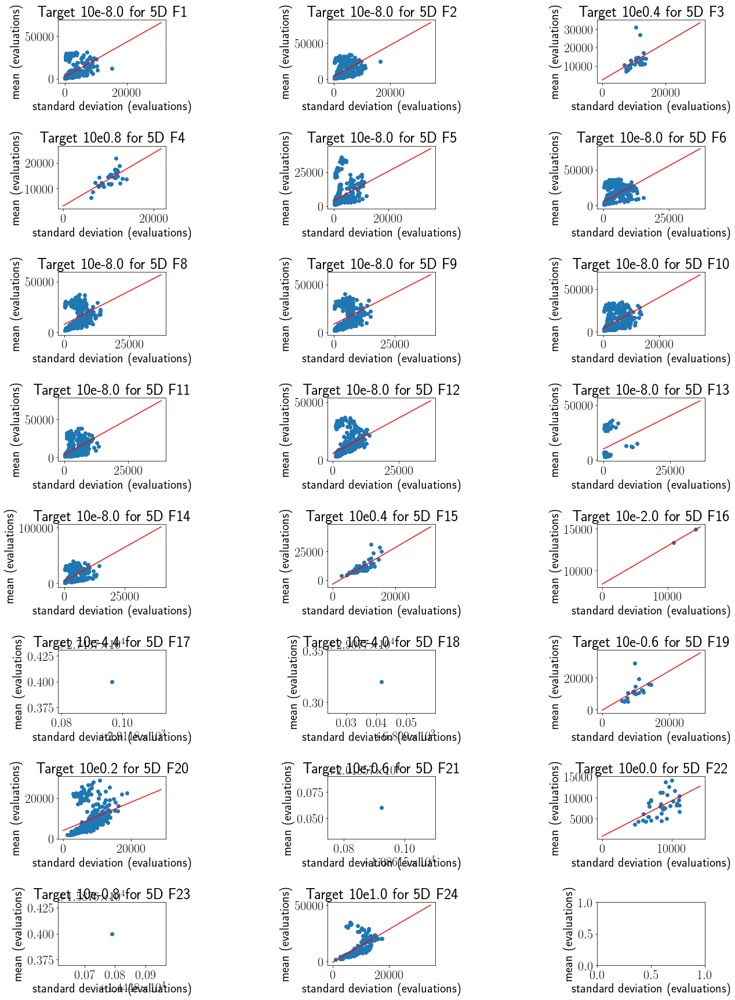

In [140]:
fig, axs = plt.subplots(8,3,figsize=(20,30))
fig.subplots_adjust(hspace = 1, wspace=1.5)
fig.set
axs = axs.ravel()

for i in range(len(relevant_table)):
    scatterplot(relevant_table[i],axs[i])
#     find_outlier_config(relevant_table[i],axs[i],True)


# fig.set(title="Distribution of variance vs mean")
for ax in axs.flat:
    ax.set(xlabel='standard deviation (evaluations)', ylabel='mean (evaluations)')

From these figures we can see two interesting phenomena:

- For most functions, we can see a clearly positive correlation between the variance and performance, indicating that in general, we can assume that well-performing configurations have low variances compared to other configurations. 


- For some functions, only one dot is plotted. In these cases, only one configuration hits the final target with all of its runs. For all other configurations, at least one run does not hit this target. This is likely an effect of the stochastisity of the runs themselves, and indicates that, especially for more difficult functions, nonfinished runs have a very large impact. 


- We also notice some large groups of outliers for some functions. To determine why this is the case, we investigate what these configurations have in common. The result of this investigation is shown below for one of these functions.

Below, we investigate the outliers from the previous figures. We look at the 5% of datapoints which have the largest distance to the linear fit. For these outliers, we look at the component activity to attempt to discover some commonalities. 

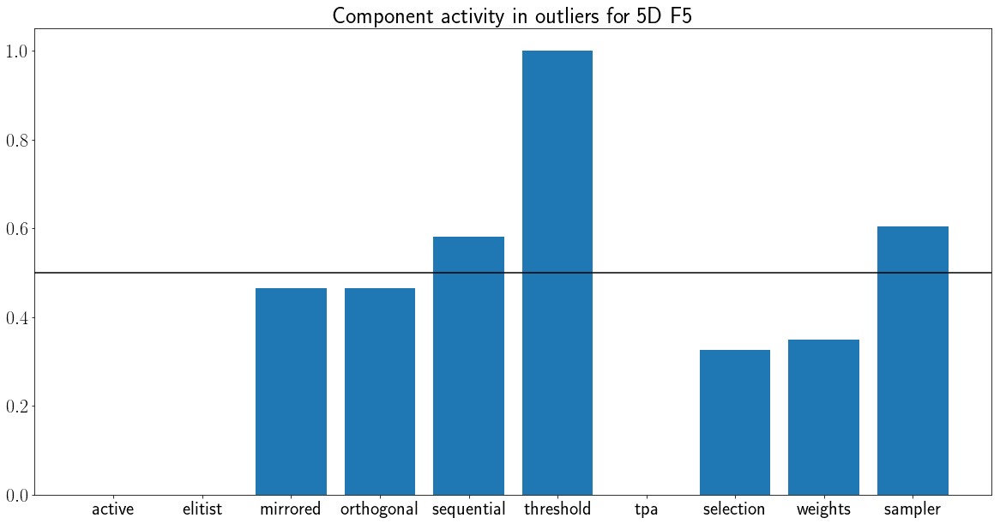

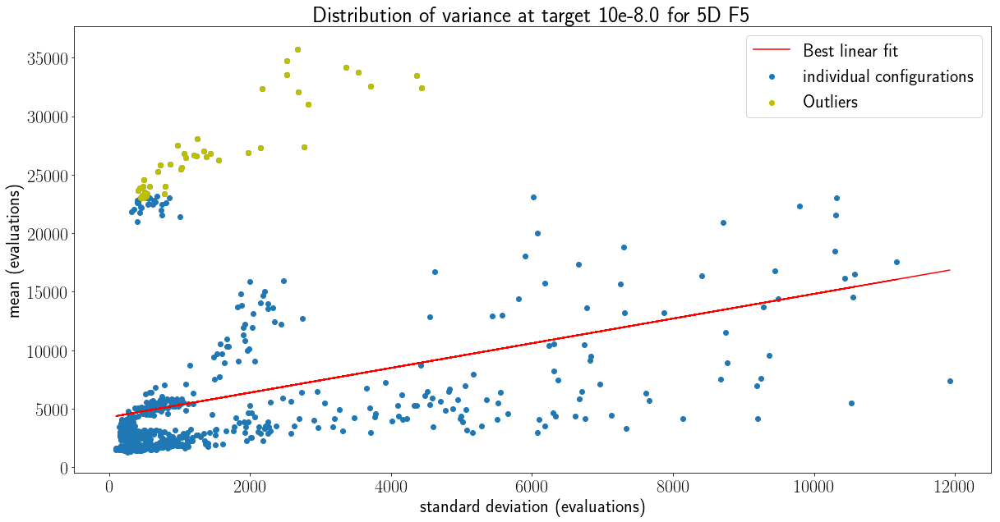

The r-squared value is 0.1050304162860192


In [119]:
find_outlier_config(relevant_table[4],show_scatter=True)

From these figures, we can see that the outliers have one clear commonality: the threshold component is always active. 

Overall, we see that there is a possitive correclation between performance and variance as expected, but it is not as roboust as we would like. So while looking at only the mean performance might work for some functions, we should still keep variance into account. Especially in the more difficult functions, where there might be few configurations which reach te final target, we need te be careful when selecting split configurations.

## Additional statistics from Worstcase-Window approach

## Study 50 best split configurations <a id='50-50'></a>


Since we previously established that variance can play a big role in the performance of a static CMA-ES, we can safely assume that the same holds for split configurations. So just looking at the expected best performing split configuration might give a wrong impression of the actual possibilities for improvement. 

So to rectify this, we decided to not only run the theoretically best split configuration, but the 50 best ones. This should give us a more complete picture of the potential of split configruations. In this section, we study the properties of these 50 split configurations, and try to find commonalities in their performances.

The way these configurations are determined is again similar to our previous experiments. We adapt the `splitpoint_generation.py`-file to return all split configurations which hit the final target, along with their score. This score is determined using the worstcase sliding-window approach. The data we get contains $(\tau,C_1,C_2)$-pair, where for every $(C_1,C_2)$-pairs the best possible splitpoint $\tau$ is chosen.

In this section, we will focus on F8 and use it as an example. We chose F8 because it represents a middle ground in terms of difficulty: there are many static configurations which reach the target ($10^{-8}$), but is is not as straightforward as for example F2. We would expect a split configuration to work reasonably well on F8, since its searchspace consist of two seeminly different sections. However, the previous experiments showed no real improvement for this function.

### Component activity and splitpoint location in calculated split configurations

We start of by selecting the 50 best split-configurations from the available data (the file `FXXSaved_best_splits.npy`). We then first create a bargraph showing the component activity in the C1 and C2 of these configurations.

Note: This code also defines a second way to select 50 split configurations, which we will dicusss later in this section.

'F8_5050_compact.png'

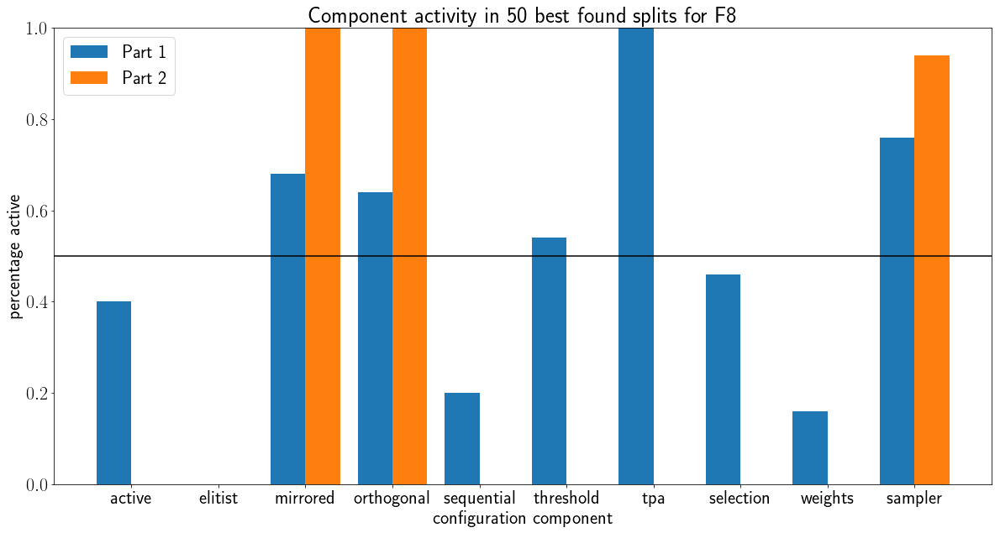

In [68]:
def get_sorted_configs(fid,method=""):
    if method=="orig":
        test = np.load(f"{data_location}MultiSplits/F{fid}Saved_best_splits_orig.npy")
    else: 
        try:
            test = np.load(f"{data_location}MultiSplits/F{fid}Saved_best_splits_worstcase.npy")
        except:
            test = np.load(f"{data_location}MultiSplits/F{fid}Saved_best_splits.npy")

    return [test[i] for i in np.argsort([t[3] for t in test])]
    
def get_sorted_var2(fid,nr_to_check=50,lim_uses=3,method = ""):
    tsorted = get_sorted_configs(fid,method)
    tsorted_new = []
    i =0 
    j=0
    used_as_p1 = {}
    used_as_p2 = {}
    while i<50:
        can_use_p1 = False
        can_use_p2 = False
    #     print(j)
        if tsorted[j][1] not in used_as_p1:
            used_as_p1[tsorted[j][1]] = 0
            can_use_p1 = True
        elif used_as_p1[tsorted[j][1]] < lim_uses:
            can_use_p1 = True
        if tsorted[j][2] not in used_as_p2:
            used_as_p2[tsorted[j][2]] = 0
            can_use_p2 = True
        elif used_as_p2[tsorted[j][2]] < lim_uses:
            can_use_p2 = True
        if can_use_p1 and can_use_p2:
            used_as_p1[tsorted[j][1]] += 1
            used_as_p2[tsorted[j][2]] += 1   

#             print(j)
            tsorted_new.append(tsorted[j])
            i+=1
        j+=1
        if j>=len(tsorted):
            break
    return tsorted_new

def plot_configs_act(fid,nr_to_check=50,use_method2=False,ax=None):
# np.save(f"{data_location}MultiSplits/F{fid}_bestsplits",tsorted[:nr_to_check])
    if use_method2:
        tsorted = get_sorted_var2(fid,nr_to_check)
    else:
        tsorted = get_sorted_configs(fid)
#     print(len(tsorted))
    totals1 = []
    totals2 = []

    total1 = 0
    total2 = 0
    for i in range(10):
        for j in tsorted[:nr_to_check]:
            if(intToRepr(int(j[1]))[i] != 0):
                total1 +=1
            if(intToRepr(int(j[2]))[i] != 0):
                total2 +=1
        totals1.append(total1)
        totals2.append(total2)
        total1 = 0
        total2 = 0

    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(20,10))
        ax.set_xlabel("configuration component")
        ax.set_ylabel("percentage active")
        ax.set_title(f"Component activity in {nr_to_check} best found splits for F{fid}")
        ax.set_xticks(range(10))
        ax.set_xticklabels(conf_names[:10])

    perc_config1 = [x/nr_to_check for x in totals1]
    perc_config2 = [x/nr_to_check for x in totals2]
#     plt.figure(figsize=(20,10))
    ax.bar([i-0.2 for i in range(10)],perc_config1,width=0.4,label="Part 1")
    ax.bar([i+0.2 for i in range(10)],perc_config2,width=0.4,label="Part 2")
    ax.axhline(0.5, color='black')
    ax.set_ylim(0,1)
    ax.legend()
    filename = f"F{fid}_5050_compact.png"
    plt.savefig(filename)
    return filename
#     plt.show()

plot_configs_act(8,use_method2=False)

In this figure, we can see that for this function the C2-part of the 50 best split configurations is always extremely similar, only varying in the sampler used. Because of this, we don't get a varied sample of good split configurations, just slight variations of the same configuration.

Next, we look at the splitpoints used to see if the same patern is present.

'F8_5050_splithist.png'

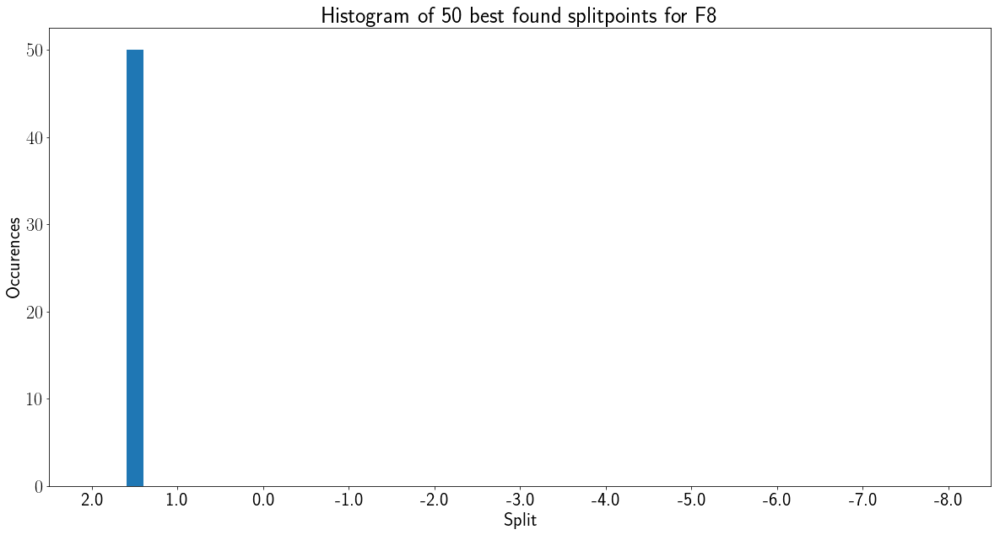

In [46]:
def plot_splits_hist(fid,nr_to_check=50,use_method2=False,ax = None):
    if use_method2:
        tsorted = get_sorted_var2(fid,nr_to_check)
    else:
        tsorted = get_sorted_configs(fid)  
        
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(20,10))
        ax.set_xlabel("Split")
        ax.set_ylabel("Occurences")
        ax.set_title(f"Histogram of {nr_to_check} best found splitpoints for F{fid}")
        ax.set_xticks([5*i for i in range(11)])
        ax.set_xticklabels([powers[5*i] for i in range(11)])
        
#     plt.figure(figsize=(20,10))
#     plt.title(f"Histogram of {nr_to_check} best found splitpoints for F{fid}")
    ax.hist([t[0] for t in tsorted[:nr_to_check]],bins=range(51))
#     plt.xlabel("Split")
#     plt.ylabel("Occurences")
#     plt.xticks([5*i for i in range(11)],[powers[5*i] for i in range(11)])
#     plt.show()
    filename = f"F{fid}_5050_splithist.png"
    plt.savefig(filename)
    return filename

plot_splits_hist(8,use_method2=False)

As expected, the 50 best split configurations for F8 all have the same splitpoint. This indicates that the configuration we saw as C2 performs extermely well form this point onwards, but it started poorly. So putting almost any decent configuration before it will improve performance drastifcally, leading to a very homogenous distribution of split configurations.

### Study the relative activation frequencies off all components

Since the number of split configurations we chose previously is just arbitrary, we first want to get some more insight in the component activity of a much larger section of the possible split configurations. To do this, we create a so called relative activation frequency graph. This graph shows for the X best split configurations how often a certain component is on or off. The advantage this gives over the previous figures is that we can vary the X, allowing us to see how the activation frequencies change when looking at more and more configurations.

These figures were first introduced in the following paper:
> Algorithm configuration data mining for cma evolution strategies<br>
> Sander van Rijn, Hao Wang, Bas van Stein and Thomas B&auml;ck<br>
> Proceedings of the Genetic and Evolutionary Computation Conference 2017<br>
> Available [here](https://dl.acm.org/citation.cfm?id=3071205)

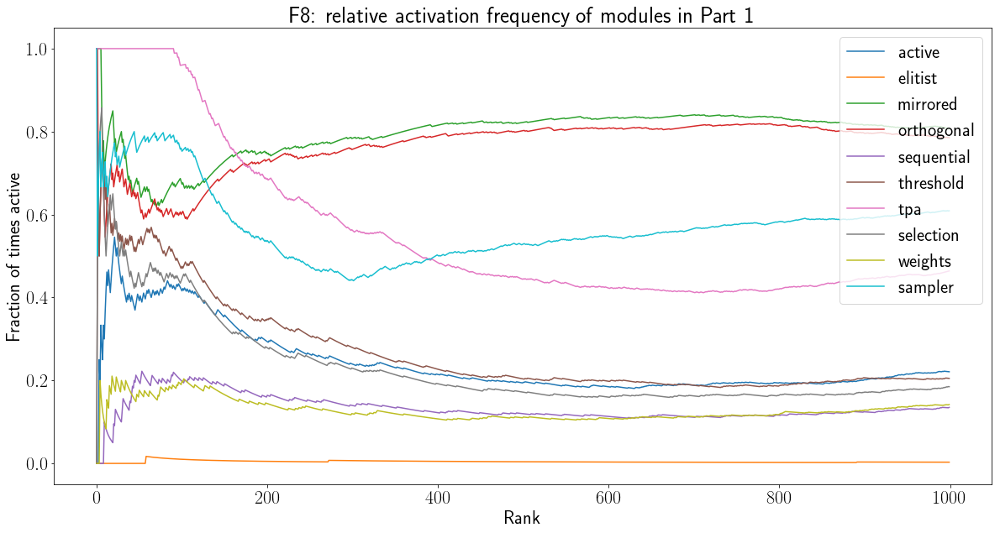

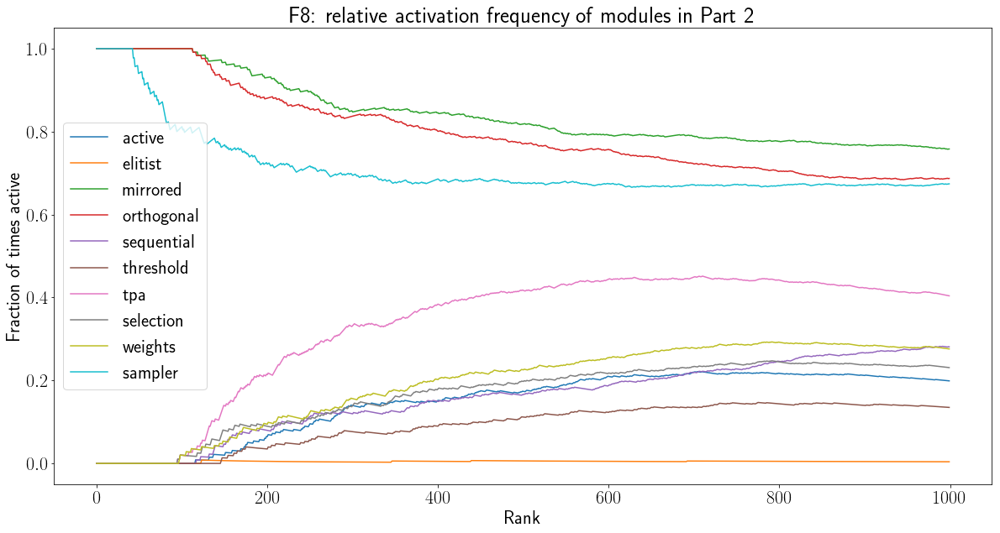

'F8_relative_act_freq_split.png'

<Figure size 432x288 with 0 Axes>

In [50]:

def plot_relative_activation_frequencies(fid):
    tsorted = get_sorted_configs(fid)
    idx1s = []
    idx2s = []

    for i in tsorted[:1000]:
        idx1s.append(intToRepr(i[1]))
        idx2s.append(intToRepr(i[2]))
    idx1s = np.array(idx1s)
    idx2s = np.array(idx2s)

    two_indices = idx1s == 2
    idx1s[two_indices] = 1
    dists = range(1,1001)
    cumsums = np.cumsum(idx1s.T,axis=1)
    rankinfo = np.array([cumsums[:,i]/dists[i] for i in range(1000)])

    plt.figure(figsize=(20,10))
    for i in range(10):
        plt.plot(rankinfo.T[i])

    plt.xlabel("Rank")
    plt.ylabel("Fraction of times active")
    plt.title(f"F{fid}: relative activation frequency of modules in Part 1")
    plt.legend(conf_names[:10])
    plt.show()
    
    two_indices = idx2s == 2
    idx2s[two_indices] = 1
    dists = range(1,1001)
    cumsums = np.cumsum(idx2s.T,axis=1)
    rankinfo = np.array([cumsums[:,i]/dists[i] for i in range(1000)])

    plt.figure(figsize=(20,10))
    for i in range(10):
        plt.plot(rankinfo.T[i])

    plt.xlabel("Rank")
    plt.ylabel("Fraction of times active")
    plt.title(f"F{fid}: relative activation frequency of modules in Part 2")
    plt.legend(conf_names[:10])
    plt.show()
    filename = f"F{fid}_relative_act_freq_split.png"
    plt.savefig(filename)
    return filename

plot_relative_activation_frequencies(8)

From these figures, we can draw the same conculsions as before. We see that for the first 100 or so split configurations, the second part of the configurations is always extremely similar, while for the first configuration there is much more erratic behaviour, indicating that this configuration has no clear modules which need to be on or off.

### Data processing functions

Before we continue and run the actual configurations, we define some functions to help with calculating theoretical ERT-values and improvements compared to static values.

In [69]:
def load_data_split(fid):
    table = np.load(f"{data_location}MultiSplits/F{fid}_bestsplits.npy")
    file_loc = "MultiSplits/"
    splits = []
    for i in range(len(table)):
        try:
            rep1 = int(table[i][1])
            rep2 = int(table[i][2])
            split = np.load(data_location + file_loc + file_name_params_split.format(fid=fid,ndim=5,rep=reprToString(intToRepr(rep1)),rep2=reprToString(intToRepr(rep2))),encoding='bytes')
            splits.append(split)
        except: 
            print(i)
    return splits
def calcERTs_multi(fid):
    splits = load_data_split(fid)
    ERTs = []
    stds = []
    nanstops = []
    for i in splits:
        stops = calcStopVals(i['fitness'],10**-8)
        stds.append(np.std(stops))
        ERTs.append(calcERT(stops))
        nanstops.append(np.nanmean(stops))
    return ERTs,stds,nanstops

In [70]:
def get_theoretical_impr(fid,nr_to_check=50,use_method2=False):
    if use_method2:
        tsorted = get_sorted_var2(fid,nr_to_check)
    else:
        tsorted = get_sorted_configs(fid)
    vals =[]
    item = get_table_item(fid,"means")
    st_val = get_mean_value_static(fid,item[3],-8.0)
    best_st_val = get_x_best_static(fid,nr_to_return=1)[0][1]
#     print(best_st_val)
    if(st_val>best_st_val):
        print(f"For F{fid} the best static value is not equal to the value in the means-table")
        st_val = best_st_val
#     print(item)
    imprs = []
    for i in range(nr_to_check):
        item = tsorted[i]
    #     print(item)
        mval = get_mean_value_split(fid,item[1],item[2],-8.0,powers[int(item[0])])
        impr = 1-mval/st_val
        vals.append(mval)
        imprs.append(impr)
    return imprs,vals,st_val

# get_theoretical_impr(8,nr_to_check=1)

### Calculate theoretical (mean) improvement for the split configurations

We calculate the expected improvement for each of these 50 best split configurations and visualize it in the figure below.

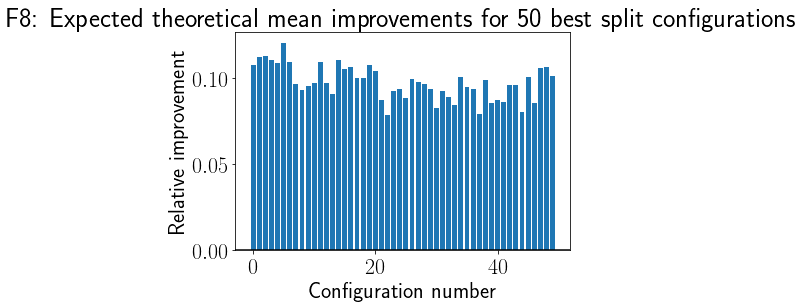

In [48]:
fid = 8
imprs,_,_ = get_theoretical_impr(fid,use_method2=False)
plt.bar(range(len(imprs)),imprs)
plt.axhline(0,color='k')
plt.title(f"F{fid}: Expected theoretical mean improvements for 50 best split configurations")
plt.xlabel("Configuration number")
plt.ylabel("Relative improvement")
plt.show()

From this figure, we see that the expected improvement for all these configurations is similar. This matches our expectations, since all configurations switch to basically the same C2 at the same splitpoint.

### Plot actual performances

We run these configurations for 5 instances, 50 runs each. Using the function below, we plot the actual improvement achieved compared to what we previously prediced. 

'F8_5050_perf.png'

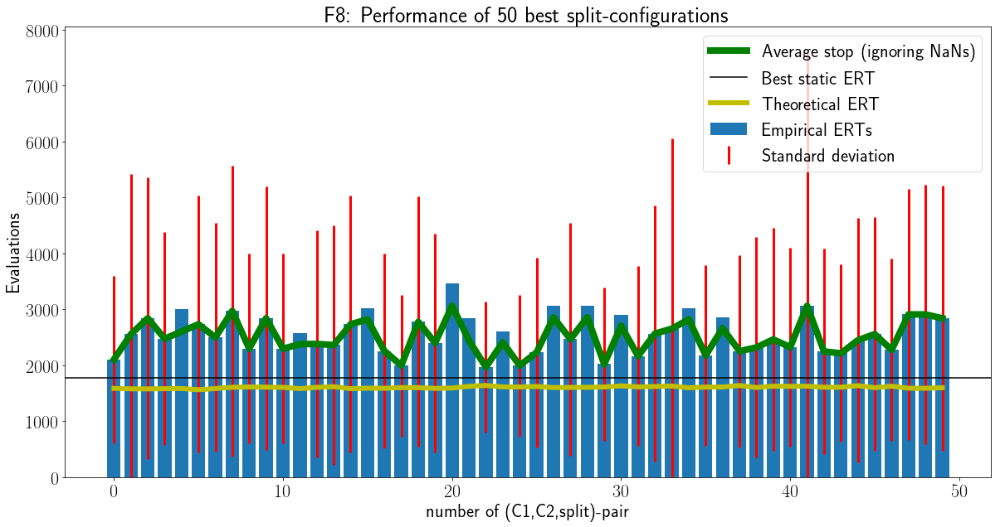

In [47]:
def plot_multi_split_performance(fid,ax=None):
    ERTs,stds,nanstops = calcERTs_multi(fid)
    imprs,vals,st_val = get_theoretical_impr(fid)
    
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(20,10))
        ax.set_xlabel("number of (C1,C2,split)-pair")
        ax.set_ylabel("Evaluations")
        ax.set_title(f"F{fid}: Performance of {len(ERTs)} best split-configurations")
#         ax.set_xticks(range(10))
#         ax.set_xticklabels(conf_names[:10])

#     plt.figure(figsize=(20,10))
    ax.bar(range(len(ERTs)),ERTs,label="Empirical ERTs")
    ax.plot(nanstops,color='g',lw=8,alpha=1,label="Average stop (ignoring NaNs)")
#     plt.axhline(results2['ST-ERT'][fid],color='k',label="Best static ERT")
    ax.axhline(st_val,color='k',label="Best static ERT")
    ax.errorbar(range(len(ERTs)),ERTs,yerr=stds,linewidth=3,fmt='none',color='r',label="Standard deviation")
    ax.plot([t for t in vals[:len(ERTs)]],color='y',lw=6,label="Theoretical ERT")
    ax.legend()
#     plt.xlabel("number of (C1,C2,split)-pair")
#     plt.ylabel("Evaluations")
    ax.set_ylim(0)
#     plt.title(f"F{fid}: Performance of {len(ERTs)} best split-configurations")
    # plt.ylim(0,6000)
#     plt.show()
    filename = f"F{fid}_5050_perf.png"
    plt.savefig(filename)
    return filename
    
plot_multi_split_performance(8)

From this figure, we can see that none of the configurations actually performed better than the best static configuration. 
However this still does not answer our question: we wanted to know if there the decrease in performance is inherent to the function or it is caused by some other factor, such as the way split configurations we chose. Since for this function, we chose 50 configurations which are extremely similar, we have not ruled out the fact that there is some error with these configuration choises.

Note: The static ERT shown here is based on the data from 25 runs, and has not been rerun with 250 runs.

Because of this, we need to use a better way to choose 50 split configurations to test, which we do in the final part of this section. However, we first define some more visualization functions to possibly get more insight into the best split configurations

### Limited occurence method for selecting 50 - 50 configurations

As we said before, just selecting the 50 theoretically best split configurations does not give a very varied distribution of configurations. To remedy this, we decided to use a slightly different method to select which configurations to use:
We order the configurations from best to worst, and then select them in order. However, we restrict a configuration to only be able to occur 3 times as C1 of a split configuration and 3 times as C2 of a split configuration. This eliminates te problems we experienced with F8, and gives a more diverse sample of split configurations to use.

First, we define some functions to create overview tables of these newly selected configurations

In [71]:
def get_x_best_static(fid,nr_to_return=50,target=-8.0):
    df = get_data(fid=fid,ndim=5)
    df = df.replace(np.nan,np.inf)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID']).mean()
    meantarget = dfmeans[f"10e{target}"]
    sortedargs = np.argsort(np.array(meantarget))
    valid_statics = [(i,meantarget[i]) for i in sortedargs if i%3==0]
    return valid_statics[:nr_to_return]


In [72]:

def get_table_5050(fid,lim_uses=3):
    t2 = get_sorted_var2(fid,lim_uses=lim_uses)
    imprs,AHTs,st_val = get_theoretical_impr(fid,use_method2=True)
    # print(st_val)
    statics = get_x_best_static(fid)
    records = []
    for item,impr,AHT,static in zip(t2,imprs,AHTs,statics):
        record = (intToRepr(int(item[1])),intToRepr(int(item[2])),f"10e{2-(int(item[0])/5):+.1f}",f"{impr:.3f}",f"{AHT:.1f}",intToRepr(static[0]),f"{static[1]:.1f}")
        records.append(record)
    labels = ["Config 1", "Config 2", "Splitpoint","Theoretical improvement","Theoretical ERT","Static config","Static ERT"]
    return pd.DataFrame.from_records(records, columns=labels)


In [469]:
for fid in fids_new:
    try:
        data = get_sorted_var2(fid,method="orig")
    #     print(len(data))
        if(len(data)==50):
            np.save(f"F{fid}_Adaptive_configs_orig",data)
        else:
            print(fid)
    except:
        print(fid)
        print("?")

In [208]:
def save_sorted_to_npz(fid):
    np.save(f"sorted_F{fid}",get_sorted_var2(fid))
for i in [2,8,13]:
    save_sorted_to_npz(i)

In [51]:
fid = 8
get_table_5050(fid)

,Config 1,Config 2,Splitpoint,Theoretical improvement,Theoretical ERT,Static config,Static ERT
0,"[0, 0, 1, 1, 0, 0, 1, 0, 0, 2, 0]","[0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]",10e+1.6,0.108,1587.9,"[0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]",1779.5
1,"[0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0]","[0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]",10e+1.6,0.112,1579.6,"[0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]",1783.3
2,"[0, 0, 1, 0, 0, 1, 1, 1, 0, 2, 0]","[0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]",10e+1.6,0.113,1578.6,"[0, 0, 1, 0, 1, 0, 0, 0, 0, 2, 0]",1985.4
3,"[0, 0, 1, 1, 0, 0, 1, 0, 0, 2, 0]","[0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]",10e+1.6,0.096,1609.0,"[0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 0]",2066.9
4,"[0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0]","[0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]",10e+1.6,0.100,1600.7,"[0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0]",2222.2
5,"[0, 0, 1, 0, 0, 1, 1, 1, 0, 2, 0]","[0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]",10e+1.6,0.101,1599.6,"[0, 0, 1, 1, 0, 0, 1, 0, 0, 2, 0]",2321.0
6,"[0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]","[0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0]",10e-7.4,0.009,1764.0,"[0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0]",2322.1
7,"[0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]","[0, 0, 1, 1, 0, 0, 0, 0, 1, 2, 0]",10e-7.4,0.006,1769.7,"[0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0]",2330.4
8,"[0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]","[0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0]",10e-7.4,0.007,1767.3,"[0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0]",2360.1
9,"[0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0]","[0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0]",10e-7.4,-0.001,1781.5,"[0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0]",2367.8


We will now visualize the selected split configurations using a "Combined module activation" plot. 

This graph is created as follows:
For every configuration, we draw a line indicating which components are activated and which are not, with a small offset between them.

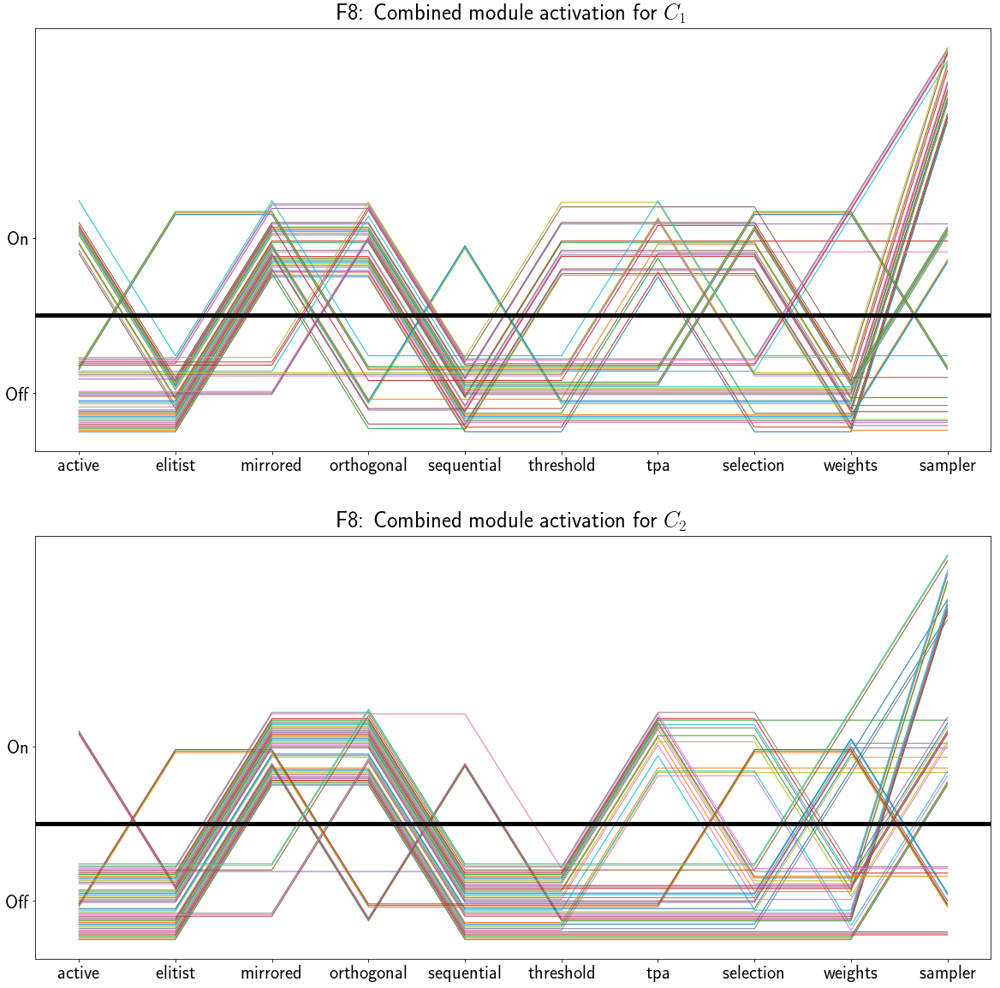

In [94]:
def plot_combined_module_activation_split(fid,ax=None):
    sortedargs = get_sorted_var2(fid)
    colors = ['r','g','b']

    if ax is None:
        fig, ax = plt.subplots(2,1,figsize=(20,20))
        ax[0].set_title(f"F{fid}: Combined module activation for $C_1$")
        ax[0].set_xticks(range(10))
        ax[0].set_xticklabels(conf_names[:10])
        ax[0].set_yticks([0.5,2.5])
        ax[0].set_yticklabels(["Off","On"])
        ax[1].set_title(f"F{fid}: Combined module activation for $C_2$")
        ax[1].set_xticks(range(10))
        ax[1].set_xticklabels(conf_names[:10])
        ax[1].set_yticks([0.5,2.5])
        ax[1].set_yticklabels(["Off","On"])

    for i in range(50):
        ax[0].plot([2*j +i/50 for j in intToRepr(int(sortedargs[i][1]))[:10]],alpha=1,lw=1)
    for i in range(50):
        ax[1].plot([2*j +i/50 for j in intToRepr(int(sortedargs[i][2]))[:10]],alpha=1,lw=1)
    ax[1].axhline(1.5,color='k',lw=5)
    ax[0].axhline(1.5,color='k',lw=5)

plot_combined_module_activation_split(8)

These plots show the commonalities between the configurations which have been selected as $C_1$ and $C_2$ of the 50 best split configurations.


From these figures, we can see that the configurations are indeed much more varied. We can also see that the expected improvement for some of the configurations is negative, with only few configurations showing potential for improvement. 

Next to the split configigurations, the table also shows the 50 best static configurations for this function. We can see that the differences between the performances of these configurations are significant, which puts the performance of the split configurations into perspective: while they might not perform as well as the absolute best static configuration, they are still comparable to the top static configurations.

This also means that, if it turns out that the best static configuration has such good performance because it got 'lucky' during the initial 25 runs, the actual split configurations might still be improvement relative to the actual performance of this configuration when we run more robust experiments on it.

Because of this, we decided not to rerun these experiments using this new selection method, and instead focus first on solving the problem of robustness of the available data. This method will then be used in the final section of this notebook.

## Overview table

### Functions to create overview table
<a id='overview_functions'></a>


First, we determine what the best target to have been hit.

Based on this target, we determine the best static configuration

In [73]:
def get_best_static_config(fid):
    item = get_table_item(fid=fid,method="worstcase") 
    static = get_x_best_static(fid=fid,nr_to_return=1,target=item[2]) # Gets the config with the best AHT, which equals ERT since non-finished runs get discarded
    return static

We now determine for every instance the best static configuration and its performance. This will be averaged in the overview table.

In [74]:
def get_mean_static_instancebased(fid):
    df = get_data(fid=fid,ndim=5)
    df = df.replace(np.nan,np.inf)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID', 'instance ID']).mean()
    meantarget = dfmeans[get_final_target(fid)]
    best_instanced_means = [(3*np.argmin([meantarget[5*i+iid] for i in range(4608) if i%3==0]) ,
                             np.min([meantarget[5*i+iid] for i in range(4608) if i%3==0])) for iid in range(5)]
#     valid_statics = [(i,meantarget[i]) for i in sortedargs if i%3==0]
#     print(np.argsort(meantarget))
    return best_instanced_means

The following two functions plot the graphs (ERT histogram and ERT/variance scatterplot) from [this section](#stats).

In [75]:
configs_to_consider = [i for i in range(4608) if i%3==0]
def plot_ERT_histogram(fid,ax=None):
   
    df = get_data(fid=fid,ndim=5)
    df = df.replace(np.nan,np.inf)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID']).mean()
    meantarget = [dfmeans[get_final_target(fid)][i] for i in configs_to_consider]
    meantarget = [i for i in meantarget if i <50001]
    bin_nr = 10
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(10,5))
        ax.set_xlabel("ERT")
        ax.set_ylabel("Occurences")
        ax.set_title(f"Distriburion of AHT's for target {get_final_target(fid)} for F{fid}")
        bin_nr = 60
    minval = min(meantarget)
    maxval = max([i for i in meantarget if i <50001])
    bins = [minval+i*(maxval-minval)/bin_nr for i in range(bin_nr)]
    ax.hist(meantarget,bins=bins)
    filename = f"F{fid}_hist_ERT.png"
    plt.savefig(filename)
    return filename

In [76]:
def plot_scatterplot_ERT_var(fid,ax = None):

    ndim = 5
    target=get_final_target(fid)

    
    df = get_data(ndim,fid)
    df = df.fillna(np.inf)

    dfstds = df.groupby(by=['Representation', 'ndim', 'function ID']).std()
    stds_target = dfstds[target]


    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID']).mean()
    means_target = dfmeans[target]
    mask = ~np.isnan(stds_target) & ~np.isnan(means_target)
#     print(mask)
    slope, intercept, r_value, p_value, std_err = stats.linregress( means_target[mask],stds_target[mask])

    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(10,5))
        ax.set_xlabel("ERT")
        ax.set_ylabel("Variance")
        ax.set_title(f"Target {target} for {ndim}D F{fid}")
        
    ax.scatter([means_target[i] for i in configs_to_consider],[stds_target[i] for i in configs_to_consider],label="individual configurations")
    ax.plot(means_target,intercept+means_target*slope,color='r',label="Best linear fit")
    filename = f"F{fid}_scatterplot_var.png"
    plt.savefig(filename)
    return filename


The next function plots the combined module activation for the 50 best static configuration. This graph is created as follows:
For every configuration, we draw a line indicating which components are activated and which are not, with a small offset between them.

In [77]:
def plot_combined_module_activation_static(fid,ax = None):
    statics = [int(i[0]) for i in get_x_best_static(fid)]
    colors = ['r','g','b']

    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(20,10))
        ax.set_title(f"F{fid}: Combined module activation for best statics")
        ax.set_xticks(range(10))
        ax.set_xticklabels(conf_names[:10])
        ax.set_yticks([0.5,2.5])
        ax.set_yticklabels(["Off","On"])
    for i in range(len(statics)):
        ax.plot([2*j +i/50 for j in intToRepr(int(statics[i]))[:10]],alpha=1,lw=1,color=colors[i%3])
    ax.axhline(1.5,color='k',lw=5)
    filename = f"F{fid}_combined_module_activation_static.png"
    plt.savefig(filename)
    return filename

This is the code for the combined module activation plot for the split configurations, used in the overview table.

In [78]:
def plot_combined_module_activation(fid,ax=None):
    sortedargs = get_sorted_var2(fid)
    colors = ['r','g','b']

    if ax is None:
        fig, ax = plt.subplots(2,1,figsize=(20,20))
        ax[0].set_title(f"F{fid}: Combined module activation for part 1")
        ax[0].set_xticks(range(10))
        ax[0].set_xticklabels(conf_names[:10])
        ax[0].set_yticks([0.5,2.5])
        ax[0].set_yticklabels(["Off","On"])
        ax[1].set_title(f"F{fid}: Combined module activation for part 2")
        ax[1].set_xticks(range(10))
        ax[1].set_xticklabels(conf_names[:10])
        ax[1].set_yticks([0.5,2.5])
        ax[1].set_yticklabels(["Off","On"])

#     plt.figure(figsize=(20,10))
#     plt.title(f"F{fid}: Combined module activation for part 1")
    for i in range(50):
        ax[0].plot([2*j +i/50 for j in intToRepr(int(sortedargs[i][1]))[:10]],alpha=1,lw=1)
#     plt.xticks(range(10),conf_names[:10])
#     plt.show()


#     plt.figure(figsize=(20,10))
#     plt.title(f"F{fid}: Combined module activation for part 2")

    for i in range(50):
        ax[1].plot([2*j +i/50 for j in intToRepr(int(sortedargs[i][2]))[:10]],alpha=1,lw=1)
#     plt.xticks(range(10),conf_names[:10])
#     plt.show()
    ax[1].axhline(1.5,color='k',lw=5)
    ax[0].axhline(1.5,color='k',lw=5)
    filename = f"F{fid}_combined_module_activation_split.png"
    plt.savefig(filename)
    return filename
# plot_combined_module_activation(8)

Next, we calculate for each of the 50 best static configurations how well they perform on each instance. 
So for every configuration, we get 5 values indicating its ranking in each of the 5 instances. This value is then summed and averaged over all 50 configurations to give an average ranksum, indicating how much instance effects performance of static configuration performance. 

In [79]:
def calc_instance_effect(fid):
    statics = [int(i[0]) for i in get_x_best_static(fid,nr_to_return=50)]
    df = get_data(fid=fid,ndim=5)
    df = df.replace(np.nan,np.inf)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID', 'instance ID']).mean()
    meantarget = dfmeans[get_final_target(fid)]
    
    rankings_iid = [ 3*np.argsort([meantarget[5*i+iid] for i in range(4608) if i%3==0])  for iid in range(5)]
    ranksum = []
    for st in statics:
        ranksum.append(np.sum([[i for i in range(len(rankings_iid[iid])) if rankings_iid[iid][i] == st] for iid in range(5)]))
    return ranksum

This following function calculates the performance of a split configuration according to a specific splitpoint determination method. More information on the different kinds of ERT reported can be found in [this section](#emp).

In [80]:
def get_info_split(fid,method):
    data = load_data(fid,method)
    item = get_table_item(fid,method)

    stops = calcStopVals(data['split']['fitness'],10**item[2])
    sp1 = calcStopVals(data['part1']['fitness'],10**item[1])
    sp2 = calcStopVals(data['part2']['fitness'],10**item[1])
    st2 = calcStopVals(data['part2']['fitness'],10**item[2])

    theoretical = [x-y+z for x,y,z in zip(sp1,sp2,st2)]

    glueERT = calcERT(theoretical)

    actualERT = calcERT(stops)
    nonreached = calcNonReached(stops)

    stopsST = calcStopVals(data['static']['fitness'],10**item[2])
    stopsST1 = calcStopVals(data['part1']['fitness'],10**item[2])
    stopsST2 = calcStopVals(data['part2']['fitness'],10**item[2])
    staticERT = min(calcERT(stopsST),calcERT(stopsST1),calcERT(stopsST2))

    df = get_data(fid=fid,ndim=5)
    df = df.replace(np.nan,np.inf)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID']).mean()
    val1 = dfmeans[f"10e{item[1]}"][item[4]]
    val2sp = dfmeans[f"10e{item[1]}"][item[5]]
    val2st = dfmeans[f"10e{item[2]}"][item[5]]
    theoryERT =  val2st - val2sp + val1
    
    return (item[4],item[5],f"10e{item[1]}",f"10e{item[2]}",theoryERT,actualERT,glueERT,staticERT)
    


The next function is a slightly different way to visualize the configurations chosen in the 50-50 experiments. These figures use the limited occurenct variant of the configuration selection, and show for every component how many configurations switched it from on/off to on/off.

In [81]:
def plot_election_plots(fid,ax=None):
    sortedargs = get_sorted_var2(fid)
    totalonon = np.zeros((10,1))
    totalofof = np.zeros((10,1))
    totalonof = np.zeros((10,1))
    totalofon = np.zeros((10,1))


    for i in range(10):
        for j in sortedargs:
            if(intToRepr(int(j[1]))[i] == 0):
                if(intToRepr(int(j[2]))[i] == 0):
                    totalofof[i] += 1
                else:
                    totalofon[i] += 1
            else:
                if(intToRepr(int(j[2]))[i] == 0):
                    totalonof[i] += 1
                else:
                    totalonon[i] += 1
    if ax is None:
        fig, ax = plt.subplots(1,1,figsize=(20,10))
        ax.set_title(f"F{fid}:Plot of changes between part 1 and 2")
        ax.set_xticks(range(10))
        ax.set_xticklabels(conf_names[:10])
        
#     plt.figure(figsize=(20,10))
    ax.bar(range(10), [i[0] for i in totalonon],color='darkgreen',width=0.7)
    ax.bar(range(10), [i[0] for i in totalofon], bottom=[i[0] for i in totalonon],color='lightgreen',width=0.7)
    ax.bar(range(10), [i[0] for i in totalonof], bottom=[i[0]+j[0] for i,j in zip(totalonon,totalofon)],color='pink',width=0.7)
    ax.bar(range(10), [i[0] for i in totalofof], bottom=[i[0]+j[0]+k[0] for i,j,k in zip(totalonon,totalonof,totalofon)],color='darkred',width=0.7)
    ax.set_ylim(0,50)
    ax.legend(["On -- On","Off -- On","On -- Off","Off -- Off"])
    filename = f"F{fid}_election_plots.png"
    plt.savefig(filename)
    return filename
#     plt.show()

# election_plots(2)

The following function determines the best 'common' static configuration and its ERT.

The common configurations are based on table XX from the paper xx. (TODO)

In [82]:
common_vars_complete = [0,2304,1152,1,2,3457,3458,2305,2306,594]
def get_best_common_vars(fid):
    df = get_data(fid=fid,ndim=5)
    df = df.replace(np.nan,np.inf)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID']).mean()
    vals = np.array(dfmeans[get_final_target(fid)])
    vals_to_consider = vals[common_vars_complete]
#     print(np.argmin(vals_to_consider))
    return (common_vars_complete[np.argmin(vals_to_consider)],np.min(vals_to_consider))

common_vars_nonipop = [0,2304,1152,594]
def get_best_common_vars_nonipop(fid):
    df = get_data(fid=fid,ndim=5)
    df = df.replace(np.nan,np.inf)
    dfmeans = df.groupby(by=['Representation', 'ndim', 'function ID']).mean()
    vals = np.array(dfmeans[get_final_target(fid)])
    vals_to_consider = vals[common_vars_nonipop]
#     print(np.argmin(vals_to_consider))
    return (common_vars_nonipop[np.argmin(vals_to_consider)],np.min(vals_to_consider))

The next to functions calculate the instance-based ERT: for every instance, the split configuration determined in [this section](#instance) is used, and its ERT calculated. These ERTs are then averaged to display in the overview table.

In [83]:
def get_idx_instance_table(fid,iid):
    return [i for i in range(len(table_instances)) if table_instances[i][0] == fid and table_instances[i][-1] == iid][0]

In [84]:
def calc_instance_based_ERT(fid):
    ERTs = []
    for iid in range(5):
        try:
            data = load_data_instanced(fid,iid)
            idx = get_idx_instance_table(fid,iid)
            stopssplit = calcStopVals(data['split']['fitness'],10**table_instances[idx][2])
            ERTs.append(calcERT(stopssplit))
        except:
            print(iid)
    return np.mean(ERTs)

This final function calls all previous funtions and creates data records for a single function.

In [85]:
def CreateTableRecord(fid):
    # Static
    target = get_final_target(fid) # As string
    best_static = get_best_static_config(fid) # (representation(int), ERT)
    best_static_instancebased = get_mean_static_instancebased(fid) #5 times (repr(int),ERT)
    iid_ERT = np.mean([i[1] for i in best_static_instancebased])
    instance_ranksums = calc_instance_effect(fid) # 50 ranksums
    mean_ranksum = np.mean(instance_ranksums)
    
    # Common confiug
    common,commonERT = get_best_common_vars(fid)
    
    # Split
    splitinfos = []
    statics = []
    for method in methods.keys():
        info = get_info_split(fid,method) #(C1,C2,split,target,theoryERT,actualERT,glueERT,staticERT)
        splitinfos.append([info[i] for i in [0,1,2,4,5,6]])
        statics.append(info[-1])
        
    bestStatic = min(statics) 
    
    
    # instance-based
    ERT_instance_based = calc_instance_based_ERT(fid)
    
    # Figures (general)
    hist_name = plot_ERT_histogram(fid)
    scatter = plot_scatterplot_ERT_var(fid)
    cma = plot_combined_module_activation_static(fid)
    
    # Figures (50-50 experiments)
    try:
        compact = plot_configs_act(fid)
        splits = plot_splits_hist(fid)
        cmasplit = plot_combined_module_activation(fid)
        elect = plot_election_plots(fid)
        perf = plot_multi_split_performance(fid)
        
    except:
        compact = ""
        splits = ""
        cmasplit = ""
        elect = ""
        perf = ""
        
    record = (fid,target,reprToString(intToRepr(best_static[0][0])),best_static[0][1],iid_ERT,mean_ranksum,
              reprToString(intToRepr(common)),commonERT,
              hist_name,scatter,cma,
              reprToString(intToRepr(splitinfos[0][0])),reprToString(intToRepr(splitinfos[0][1])),splitinfos[0][2],splitinfos[0][3],splitinfos[0][4],splitinfos[0][5],
              reprToString(intToRepr(splitinfos[1][0])),reprToString(intToRepr(splitinfos[1][1])),splitinfos[1][2],splitinfos[1][3],splitinfos[1][4],splitinfos[1][5],
              reprToString(intToRepr(splitinfos[2][0])),reprToString(intToRepr(splitinfos[2][1])),splitinfos[2][2],splitinfos[2][3],splitinfos[2][4],splitinfos[2][5],
              bestStatic,ERT_instance_based,
              compact,splits,cmasplit,elect,perf
             )
    return record

### Functions to format the table

This part defines some functions used to correctely display configurations and figures in the overview table.

In [86]:
pd.set_option('display.max_colwidth', -1)

def get_thumbnail(path):
    i = Image.open(path)
    i.thumbnail((150, 150), Image.LANCZOS)
    return i

def image_base64(im):
    if isinstance(im, str):
        im = get_thumbnail(im)
    with BytesIO() as buffer:
        im.save(buffer, 'png')
        return base64.b64encode(buffer.getvalue()).decode()

def image_formatter(im):
    if im.__contains__('png'):
        return f'<img src="data:image/png;base64,{image_base64(im)}">'
    if im == "":
        return "Not available"
    return im


def config_formatter(conf):
    return f"{str(conf).zfill(11)}"

### The table itself

If the table has not yet been generated, or needs to be updated, run the code below. Otherwise run the cell below that to load the csv and save a lot of computation time

In [45]:
records = []
records.append(("Explanation","Final target reached (best_value-optimum)","Best static configuration (without (B)IPOP)",
               "ERT of this configuration; is equal to AHT since we disregard all configurations for which not every run reaches the target. This is calculated from 5 times 5 runs, all using the same configuration",
               "average of the best static ERT per instance. We average the 5 ERTs (of 5 runs each) of 5 possibly different static configurations, one for each instance.", 
               "Value indicating how much of an impact the instances have on the performance of the configurations. Calculated by taking the 50 best static configurations, and summing their ranking for each of the 5 instances used.",
               "Static configuration from a smaller set of commonly used configurations","ERT of this configuration (over 5 times 5 runs)",
               "Distribution of ERTs for all non-(B)IPOP static configurations", "Scatterplot comparing the performance and variance of the static configurations previously described",
               "Plot showing for the 50 best static configurations which components are activated and which are not. Every line indicates one configuration, sorted from the best at the bottom to the 50th best at the top.",
               "Part 1 of the theoretically best split configuration, calculated using the approach from the original PPSN paper","Part 2 of this configuration","The target at which part1 switches to part2",
               "Theoretically calculated ERT for this configuration", "Actual achieved ERT for this configuration", "ERT expected when rerunning the original PPSN-approach on the newly generated data (250 runs)",
               "Part 1 of the theoretically best split configuration, calculated using the worstcase - sliding window approach","Part 2 of this configuration","The target at which part1 switches to part2",
               "Theoretically calculated ERT for this configuration", "Actual achieved ERT for this configuration", "ERT expected when rerunning the original PPSN-approach on the newly generated data (250 runs)",
               "Part 1 of the theoretically best split configuration, calculated using the mean-value with sliding window approach","Part 2 of this configuration","The target at which part1 switches to part2",
               "Theoretically calculated ERT for this configuration", "Actual achieved ERT for this configuration", "ERT expected when rerunning the original PPSN-approach on the newly generated data (250 runs)",
               "Actual found best ERT for all rerun static configurations (250 runs)", "ERT achieved when calculating the splitpoint on an instance-specific basis (average over 5 instances, 50 runs each)",
                "Plot indication the 50 best theoretical split configurations and which configurations they switch between",
                "Plot indicating the distribution of the splitpoint among these 50 best split configurations",
                "Same as the previous Combined Module Activation plot, but now for both part1 and part2 of these 50 best split confgiuratons",
                "Another visualization showing which modules are changed in these 50 best split configurations",
                "Actual achieved ERT for these split configurations compared to both static and expected ERTs"
               ))
for fid in fids:
    record = CreateTableRecord(fid)
    records.append(record)
    plt.close('all')    
    
    
labels = ["Fid","Target","Best static Config","ERT of static","ERT instance_based","Mean instancebased ranksum",
          "Best common config","ERT of common config",
          "ERT_histogram", "ERT -- variance", "Combined Module Activation",
         "Part 1 (MN)","Part 2 (MN)", "Splitpoint (MN)", "ERT-theory (MN)","ERT-Actual (MN)", "ERT-glueing (MN)",
         "Part 1 (WW)","Part 2 (WW)", "Splitpoint (WW)", "ERT-theory (WW)","ERT-Actual (WW)", "ERT-glueing (WW)",
         "Part 1 (MW)","Part 2 (MW)", "Splitpoint (MW)", "ERT-theory (MW)","ERT-Actual (MW)", "ERT-glueing (MW)",
         "Actual best static ERT","Instancebased split ERT",
         "Component activity","Splitpoints","Combined Module Activation split","Election plots","50-50 performance"

         ]



table_overview_complete = pd.DataFrame.from_records(records, columns=labels,index='Fid')
table_overview_complete.to_csv("Overview_table_complete.csv")

1
0
0
0
4


In [66]:
table_overview_complete = pd.read_csv("Overview_table_complete.csv")

Now that the table is loaded, the following function displays it using the required formatting functions to display the figures and configurations correctely.

,Target,Best static Config,ERT of static,ERT instance_based,Mean instancebased ranksum,Best common config,ERT of common config,ERT_histogram,ERT -- variance,Combined Module Activation,Part 1 (MN),Part 2 (MN),Splitpoint (MN),ERT-theory (MN),ERT-Actual (MN),ERT-glueing (MN),Part 1 (WW),Part 2 (WW),Splitpoint (WW),ERT-theory (WW),ERT-Actual (WW),ERT-glueing (WW),Part 1 (MW),Part 2 (MW),Splitpoint (MW),ERT-theory (MW),ERT-Actual (MW),ERT-glueing (MW),Actual best static ERT,Instancebased split ERT,Component activity,Splitpoints,Combined Module Activation split,Election plots,50-50 performance
Fid,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Explanation,Final target reached (best_value-optimum),Best static configuration (without (B)IPOP),"ERT of this configuration; is equal to AHT since we disregard all configurations for which not every run reaches the target. This is calculated from 5 times 5 runs, all using the same configuration","average of the best static ERT per instance. We average the 5 ERTs (of 5 runs each) of 5 possibly different static configurations, one for each instance.","Value indicating how much of an impact the instances have on the performance of the configurations. Calculated by taking the 50 best static configurations, and summing their ranking for each of the 5 instances used.",Static configuration from a smaller set of commonly used configurations,ERT of this configuration (over 5 times 5 runs),Distribution of ERTs for all non-(B)IPOP static configurations,Scatterplot comparing the performance and variance of the static configurations previously described,"Plot showing for the 50 best static configurations which components are activated and which are not. Every line indicates one configuration, sorted from the best at the bottom to the 50th best at the top.","Part 1 of the theoretically best split configuration, calculated using the approach from the original PPSN paper",Part 2 of this configuration,The target at which part1 switches to part2,Theoretically calculated ERT for this configuration,Actual achieved ERT for this configuration,ERT expected when rerunning the original PPSN-approach on the newly generated data (250 runs),"Part 1 of the theoretically best split configuration, calculated using the worstcase - sliding window approach",Part 2 of this configuration,The target at which part1 switches to part2,Theoretically calculated ERT for this configuration,Actual achieved ERT for this configuration,ERT expected when rerunning the original PPSN-approach on the newly generated data (250 runs),"Part 1 of the theoretically best split configuration, calculated using the mean-value with sliding window approach",Part 2 of this configuration,The target at which part1 switches to part2,Theoretically calculated ERT for this configuration,Actual achieved ERT for this configuration,ERT expected when rerunning the original PPSN-approach on the newly generated data (250 runs),Actual found best ERT for all rerun static configurations (250 runs),"ERT achieved when calculating the splitpoint on an instance-specific basis (average over 5 instances, 50 runs each)",Plot indication the 50 best theoretical split configurations and which configurations they switch between,Plot indicating the distribution of the splitpoint among these 50 best split configurations,"Same as the previous Combined Module Activation plot, but now for both part1 and part2 of these 50 best split confgiuratons",Another visualization showing which modules are changed in these 50 best split configurations,Actual achieved ERT for these split configurations compared to both static and expected ERTs
2,10e-8.0,11001110020,1347.96,1285.24,170.48,00000000001,2312.92,,,,11000110110,01111000110,10e0.6,1177.12,1123.98,1216.64,01000110120,01111000000,10e-1.2,1202.4,1415.21,1390.47,11001110020,01001000020,10e-0.8,1193.04,1378.61,1392.85,1184.71,1072.53,Not available,Not available,Not available,Not available,Not available
3,10e0.4,00110000120,7111.08,2942.12,806.12,1100000000
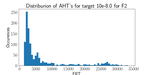
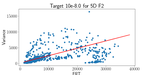
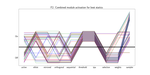
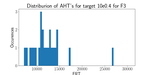
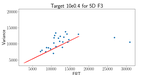
...
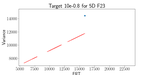
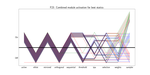
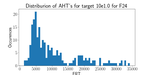
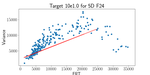
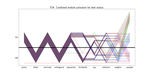

In [51]:


html = HTML('''
        <style>
            .df tbody tr:nth-child(even) { background-color: lightblue; }
        </style>
        ''' + table_overview_complete.to_html(formatters={'ERT_histogram': image_formatter, 'ERT -- variance':image_formatter,
                                                'Combined Module Activation': image_formatter,'Component activity': image_formatter,
                                                'Splitpoints': image_formatter, 'Combined Module Activation split': image_formatter,
                                                'Election plots': image_formatter,'50-50 performance': image_formatter,
                                                'Best static Config' : config_formatter, 
                                                "Part 1 (MN)" : config_formatter ,"Part 2 (MN)" : config_formatter ,
                                                "Part 1 (WW)" : config_formatter ,"Part 2 (WW)" : config_formatter ,
                                                "Part 1 (MW)" : config_formatter ,"Part 2 (MW)" : config_formatter 
                                                }, escape=False))
html

To get more detail about the specific parts of this table, or the figures in more detail, refer to the following functions / sections in this notebook:
- ERT histogram / ERT-std scatterplot: [Statistical Analysis](#stats)
- Combined module activation plot for static configurations: function plot_combined_module_activation_staticin section [Functions to create overview table](#overview_functions)
- MN method: Mean based method without sliding window. This is the original approach from the PPSN paper. See section [PPSN extended](#PPSN)
- WW method and MW method: Worstcase method using sliding window and mean method using sliding window. See section [Different methods](#methods)
- Achieved ERT for split configurations: See section [Empirical results](#emp)
- Instancebased split ert: See section [Instancebased](#instance)
- 50-50 experiment visualizations: See functions in section [Functions to create overview table](#overview_functions) to create larger figures, or section [50-50 experiment](#50-50) for more information about this approach

Since we noticed that the worstcase sliding-window approach performed best, we  study its performance in slightly more detail. The difference between this section and the previous one is the fact that we consider a different static configuration.
In the previous section, we compared the split performances to one of two static configurations: the one with the best mean performance and the one with the best worstcase performance. However, we also have the data from C1 and C2 from the split conifgurations. Since the CMA-ES is a stochastic process, the configuration which performed best on the original 25 runs might not be the best one when we rerun it, and so for some functions we found that the new runs for C1 or C2 have a lower ERT than the predeterimed static configurations. So we now compare the split configurations to the best static configuration in the set of all the ones we reran.

We will also look at an additional value which we will call 'glueing-ERT'. To determine this value, we take the runs from the static configurations $C_1$ and $C_2$ and 'glue' them together, essentially recalculating the predicted ERT with more robust data.

First, we cacluate the required values. The table below shows the newly calculated values

In [101]:
records = []
for fid in fids:
    splitERTs = []
    staticERTs = []
    nonreached = []
    nonreachedST = []
    targets = []
    ths = []
    for method in methods:
#         print(method,fid)
        data = load_data(fid,method)
        
        item = get_table_item(fid,method)
        
        stops = calcStopVals(data['split']['fitness'],10**item[2])
        
        sp1 = calcStopVals(data['part1']['fitness'],10**item[1])
        sp2 = calcStopVals(data['part2']['fitness'],10**item[1])
        st2 = calcStopVals(data['part2']['fitness'],10**item[2])

        theoretical = [x-y+z for x,y,z in zip(sp1,sp2,st2)]
        
        th = calcERT(theoretical)
        ths.append(th)
        
        splitERTs.append(calcERT(stops))
        nonreached.append(calcNonReached(stops))
        targets.append(item[2])
        
#         print(item)
#         print(stops)
        
        stopsST = calcStopVals(data['static']['fitness'],10**item[2])
        stopsST1 = calcStopVals(data['part1']['fitness'],10**item[2])
        stopsST2 = calcStopVals(data['part2']['fitness'],10**item[2])
        staticERTs.append(min(calcERT(stopsST),calcERT(stopsST1),calcERT(stopsST2)))
        nonreachedST.append(calcNonReached(stopsST))
        
        
    bestStatic = min(staticERTs)
    imprs = [1-x/bestStatic for x in splitERTs]
    imprsth = [1-x/bestStatic for x in ths]
#     print(splitERTs)
#     print(staticERTs)
#     print(bestStatic)
    records.append((fid,imprs[0],imprs[1],imprs[2],splitERTs[0],splitERTs[1],splitERTs[2],bestStatic,nonreached,nonreachedST,targets,imprsth[0],imprsth[1],imprsth[2]))#,imprs[2]))
    
labels = ["Fid","M-impr","W-impr","MW-impr","M-ERT","W-ERT","MW-ERT","ST-ERT","Split-nonF","ST-nonF","targets","Glueing-M","Glueing-W","Glueing-MW"]#,"Means_window-impr"]
results2 = pd.DataFrame.from_records(records, columns=labels,index='Fid')

In [108]:
results2.rename(index = str, columns={"M-impr": "Mean NoWindow-impr","W-impr" : "Worst Window-impr","MW-impr":"Mean Window-impr","M-ERT": "Mean NoWindow-ERT","W-ERT": "Worst Window-ERT","MW-ERT": "Mean Window-ERT","ST-ERT": "Best static ERT","ST-nonF": "Static-nonF","Glueing-M":"Mean NoWindow-Glueing impr","Glueing-W":"Worst Window-Glueing impr","Glueing-MW":"Mean Winodw-Glueing impr"})

,Mean NoWindow-impr,Worst Window-impr,Mean Window-impr,Mean NoWindow-ERT,Worst Window-ERT,Mean Window-ERT,Best static ERT,Split-nonF,Static-nonF,targets,Mean NoWindow-Glueing impr,Worst Window-Glueing impr,Mean Winodw-Glueing impr
Fid,,,,,,,,,,,,,
2,0.051,-0.195,-0.164,1123.980,1415.212,1378.612,1184.712,"[0, 0, 0]","[0, 0, 0]","[-8.0, -8.0, -8.0]",-0.027,-0.174,-0.176
3,-0.148,-0.017,-0.206,10472.419,9284.851,11003.276,9125.742,"[2, 1, 4]","[1, 0, 2]","[0.4, 0.4, 0.4]",-0.287,-0.016,0.015
4,-0.197,-0.214,-0.239,9149.538,9278.403,9469.584,7642.008,"[3, 7, 5]","[0, 7, 7]","[0.8, 0.8, 0.8]",0.018,-0.214,-0.207
5,0.168,0.281,0.168,1266.288,1093.748,1266.288,1521.472,"[0, 0, 0]","[0, 0, 0]","[-8.0, -8.0, -8.0]",0.098,0.127,0.098
6,-0.129,0.209,-0.129,1514.228,1060.140,1514.228,1341.084,"[0, 0, 0]","[0, 0, 0]","[-8.0, -8.0, -8.0]",0.119,0.151,0.119
8,-0.462,-0.163,-0.511,2646.456,2104.608,2733.896,1809.552,"[0, 0, 0]","[0, 0, 0]","[-8.0, -8.0, -8.0]",-0.020,-0.017,-0.006
9,-0.454,-0.151,-0.150,2799.328,2215.136,2213.680,1925.256,"[0, 0, 0]","[0, 0, 0]","[-8.0, -8.0, -8.0]",0.104,0.099,0.100
10,-1.843,0.068,-2.142,4495.384,1473.840,4967.511,1581.168,"[13, 0, 15]","[150, 0, 154]","[-8.0, -8.0, -8.0]",-0.774,0.084,-0.781
11,0.130,0.128,0.130,1933.951,1937.016,1933.951,2222.232,"[3, 3, 3]","[0, 0, 0]","[-8.0, -8.0, -8.0]",0.361,0.368,0.361


Since this table contains a lot of information, we extract the main data we are interested in: the relative improvements for the worstcase-window approach. This is then plotted in the figure below.

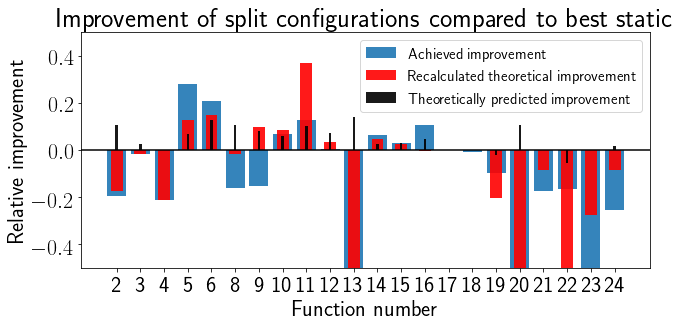

In [151]:
plt.figure(figsize=(10,5))
# plt.bar([i-0.3 for i in range(22)],results['M-impr'],width=0.3,label='M-impr')
plt.bar([i for i in range(22)],results2['W-impr'][:22],width=0.8,label='Achieved improvement',alpha=0.9)
# plt.bar([i+0.3 for i in range(22)],results['MW-impr'],width=0.3,label='MW-impr')
# plt.bar([i-0.3 for i in range(22)], results2["Glueing-M"],width=0.1,label="Glueing together actual runs",color='k',alpha=0.5)
plt.bar([i for i in range(22)], results2["Glueing-W"][:22],width=0.5,color='r',alpha=0.9,label="Recalculated theoretical improvement")
# plt.bar([i+0.3 for i in range(22)], results2["Glueing-MW"],width=0.1,color='k',alpha=0.5)
# plt.bar([i for i in range(22)], results3["W-impr"],width=0.3,color='green',label="ERT with target 10e-8",alpha=0.9)
plt.bar([i for i in range(22)], resultsth["W-impr"][:22],width=0.1,label="Theoretically predicted improvement",color='k',alpha=0.9)

plt.legend(prop={'size' : 15})
plt.axhline(0,color='k')
plt.xticks(range(22),results2.index[:22])
plt.xlabel("Function number")
plt.ylabel("Relative improvement")
plt.ylim(-0.5,0.5)
plt.title('Improvement of split configurations compared to best static')
plt.tight_layout()
plt.savefig("results2_ww_extra.pdf")
plt.show()

In this graph, we notice that for some functions, the improvement which we initally saw has disapeared. This is most obvious with F2.
Because of this, we know that the performance of the static configurations can differ substantially between the original and the new data. This is something we will discuss in detail in the final section of this document [here](#finalexp).

Another important fact to note here is that the glueing-ERT is often negative, indicating that when we repeat the splitpoint selection (using the Mean NoWindow method) on the new data, we now expect negative improvement. This indicates that the performance on the 25 runs which we use to determine the splitpoint might not be robust enough to base the split configuration on. We study this in detail in the [final section](#finalexp) of this notebook.